```python
file1 \_ |-----------------------------------|   -+-
file2 \_ |-----------------------------------|    |   training data
file3 \_ |-----------------------------------|    |        80%
file4 \_ |-----------------------------------|    |
                                                 -+-
file5 \_ |-----------------------------------|    |  validation data
file6 \_ |-----------------------------------|    |        20%
         |-----------------------------------|   -+-
```

In [1]:
import os
import glob

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

from utils.MovingAverager import *

# 前處理

In [2]:
# df = load_original_data('./pocket/202301101952/source')

In [3]:
# df['acc_x'] = moving_average(df['acc_x'], 11)
# df['acc_y'] = moving_average(df['acc_y'], 11)
# df['acc_z'] = moving_average(df['acc_z'], 11)

# df['acc_t'] = np.sqrt((df['acc_x'] ** 2) + (df['acc_y'] ** 2) + (df['acc_z'] ** 2))
# # df['acc_t'] = moving_average(df['acc_t'], 41)
# df['acc_v'] = 9.8
# df['acc_h'] = np.abs(df['acc_t'] - df['acc_v'])
# # df['angle'] = 90 - np.arctan(df['acc_v'] / df['acc_h']) / np.pi * 180
# a = df['acc_v'] / df['acc_t']
# a[a >= 1] = 1
# df['angle'] = np.arcsin(a) / np.pi * 180
# # df['angle'] = np.arccos(df['acc_h'] / df['acc_t']) / np.pi * 180

# df['mag_h'] = df['mag_t'] * np.cos(df['angle'] / 180 * np.pi)
# df['mag_v'] = df['mag_t'] * np.sin(df['angle'] / 180 * np.pi)

In [4]:
# df['est_agnle'] = np.arcsin(np.abs(df['mag_z'] / df['mag_t'])) / np.pi * 180

In [5]:
# plt.figure()
# # plt.plot(np.arange(len(df)), df['angle'])
# plt.plot(np.arange(len(df)), df['mag_y'], label='mag Y')
# plt.plot(np.arange(len(df)), df['mag_v'], label='mag V')
# # plt.plot(np.arange(len(df)), df['mag_z'], label='mag Z')
# # plt.plot(np.arange(len(df)), df['mag_v'] - df['mag_z'])
# plt.legend()
# plt.show()

In [6]:
# df[100:]

# 讀檔

In [7]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def gen_total_mag(df: pd.DataFrame):
    
    df['mag_x'] = moving_average(df['mag_x'], 41)
    df['mag_y'] = moving_average(df['mag_y'], 41)
    df['mag_z'] = moving_average(df['mag_z'], 41)
    
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    df['mag_h'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2))
    df['mag_v'] = df['mag_z']
    
    return df


def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = total_df[:-5]  # remove last None value row
    total_df = rename_data(total_df)
    total_df = gen_total_mag(total_df)
    
    return total_df

In [8]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, seq_len=25):
    num_of_segs = int(np.floor(len(df) / seq_len))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * seq_len):int((i + 1) * seq_len)].to_numpy()
        segments.append(seg)
        
    return segments


def split_segments_overlap(df, seq_len=25, shift=15):
    
    segments = []
    for i in range(0, len(df) - seq_len, shift):
        seg = df.iloc[i:i + seq_len].to_numpy()
        segments.append(seg)
        
    return segments


def select_data(df):
    return df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'mag_x', 'mag_y', 'mag_z', 'mag_t', 'mag_h', 'mag_v', 'system_time']]


def preprocess_data(df, seq_len=25, shift=15, is_train_data=False):
    pre_df = select_data(df)
    
    if is_train_data:
        segs = split_segments_overlap(pre_df, seq_len, shift)
    else:
        segs = split_segments(pre_df, seq_len)
    
    return segs

In [9]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

#         print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num, file_index=None, is_train_data=False):
    prefix = 'train' if is_train_data else 'valid'
    pair_data = []
    folder_paths = glob.glob(f'*{os.path.normpath(root_folder)}/*')

    if file_index is not None:
        folder_paths = folder_paths[file_index[0]:file_index[1]]

    for i, folder_path in enumerate(folder_paths):
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(f'{prefix} {i + 1: >3}: {folder_path}')
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        source_df, target_df = align_data(source_df, target_df)

        source_segs = preprocess_data(source_df, seq_len, shift, is_train_data)
        target_segs = preprocess_data(target_df, seq_len, shift, is_train_data)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [10]:
datapoint_per_second = 20
duration = 2
seq_len = 25
shift = 15  # the shfit of the data
classes = {0: 'target', 1: 'front_pocket', 2: 'pocket', 3: 'swing'}

In [11]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [12]:
train_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[0, 8], is_train_data=True)
valid_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[8, 10], is_train_data=False)

train_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[0, 8], is_train_data=True)
valid_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[8, 10], is_train_data=False)

train_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[0, 8], is_train_data=True)
valid_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[8, 10], is_train_data=False)

train   1: front_pocket/202302071628
train   2: front_pocket/202302071652
train   3: front_pocket/202302071523
train   4: front_pocket/202302071531
train   5: front_pocket/202302071715
train   6: front_pocket/202302071641
train   7: front_pocket/202302071541
train   8: front_pocket/202302071619
valid   1: front_pocket/202302071704
valid   2: front_pocket/202302071724
train   1: pocket/202302132108
train   2: pocket/202302131750
train   3: pocket/202302131601
train   4: pocket/202302071606
train   5: pocket/202302132053
train   6: pocket/202302122132
train   7: pocket/202302132116
train   8: pocket/202302131643
valid   1: pocket/202301101952
valid   2: pocket/202302132101
train   1: swing/202302142339
train   2: swing/202302132131
train   3: swing/202302142117
train   4: swing/202302132124
train   5: swing/202302121947
train   6: swing/202302121857
train   7: swing/202302142128
train   8: swing/202302121920
valid   1: swing/202302121909
valid   2: swing/202302142331


In [13]:
print(len(train_front_pocket_pair_data), len(train_pocket_pair_data), len(train_swing_pair_data))

3070 3003 2900


In [14]:
train_front_pocket_pair_data[0][0][0, -1], train_front_pocket_pair_data[0][2][0, -1]

(1675758113.8017025, 1675758113.8259406)

# 建立dataloader

In [15]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [16]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [17]:
class FirstDerivativeLoss(nn.Module):
    def __init__(self, weight=None, size_average=None, reduce=None, reduction='mean'):
        super(FirstDerivativeLoss, self).__init__()

    def forward(self, source, target):
        # calculate the first derivative
        source_o = torch.reshape(source, (len(source), -1))
        target_o = torch.reshape(target, (len(target), -1))
        d_source = source_o[1:] - source_o[:-1]
        d_target = target_o[1:] - target_o[:-1]
        deriv = d_source - d_target

        # calculate the loss as the mean squared error of the derivative
        loss = torch.mean(torch.pow(deriv, 2))

        return loss

In [18]:
def generator_loss(z_imu, target_imu, predict_mag, target_mag, source_total_mag, target_total_mag):
    imu_loss = mse_loss(z_imu, target_imu)
    mag_loss = mse_loss(predict_mag, target_mag)
    d1_loss = div_loss(predict_mag, target_mag)
    
    pred_total_mag = torch.sqrt(torch.sum(torch.pow(predict_mag, 2), dim=-1))
    
#     print(source_total_mag.shape, target_total_mag.shape, pred_total_mag.shape)
#     print(source_total_mag[0])
#     print(target_total_mag[0])
#     print(pred_total_mag[0])
    
    smag_limitation_loss = torch.mean(torch.abs(pred_total_mag - source_total_mag))
    tmag_limitation_loss = torch.mean(torch.abs(pred_total_mag - target_total_mag))

    total_loss = imu_loss + mag_loss * 2 + d1_loss + smag_limitation_loss * 0.5 + tmag_limitation_loss * 1.5
    return total_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss)

# def discriminator_loss(d_real, d_fake):
#     real_loss = bce_loss(d_real, torch.ones_like(d_real))
#     fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

#     return real_loss + fake_loss

In [19]:
train_data = train_front_pocket_pair_data + train_pocket_pair_data + train_swing_pair_data
valid_data = valid_front_pocket_pair_data + valid_pocket_pair_data + valid_swing_pair_data

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=512)

In [20]:
batch = next(iter(train_loader))

In [21]:
EPOCH = 10000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()
div_loss = FirstDerivativeLoss()

In [22]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [23]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.imu_layer = nn.Sequential(
            nn.Linear(6, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU(),
        )
        self.mag_layer = nn.Sequential(
            nn.Linear(2, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        self.pos_encoder = PositionalEncoding(64, 0.1)
        
        self.encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        self.nn = nn.Sequential(
            nn.Linear(64, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 6),
            nn.LeakyReLU(),
        )
        
        self.decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        
        self.mag_last = nn.Sequential(
            nn.Linear(64, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 2),
        )
        
    def forward(self, source_imu, source_mag):
        
        ### step 1
        h_imu = self.imu_layer(source_imu)
        h_imu = self.pos_encoder(h_imu)
        
        h_mag = self.mag_layer(source_mag)
        h_mag = self.pos_encoder(h_mag)
        
        ### step 2
        z = self.encoder(h_imu)
        z_imu = self.nn(z)
        
        ### step 3
        pred_latent = self.decoder(h_mag, z)
        pred_mag = self.mag_last(pred_latent)
        
        return z_imu, pred_mag
        

In [24]:
model = NotSimpleTransformer(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
# discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
# optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [25]:
output = model(torch.empty(16, 25, 6).to(device), torch.empty(16, 25, 2).to(device))
output[0].shape, output[1].shape

(torch.Size([16, 25, 6]), torch.Size([16, 25, 2]))

In [26]:
from torchinfo import summary
summary(model, input_size=[(1, 25, 6), (1, 25, 2)])

Layer (type:depth-idx)                        Output Shape              Param #
NotSimpleTransformer                          [1, 25, 6]                --
├─Sequential: 1-1                             [1, 25, 64]               --
│    └─Linear: 2-1                            [1, 25, 32]               224
│    └─LeakyReLU: 2-2                         [1, 25, 32]               --
│    └─Linear: 2-3                            [1, 25, 64]               2,112
│    └─LeakyReLU: 2-4                         [1, 25, 64]               --
├─PositionalEncoding: 1-2                     [1, 25, 64]               --
│    └─Dropout: 2-5                           [1, 25, 64]               --
├─Sequential: 1-3                             [1, 25, 64]               --
│    └─Linear: 2-6                            [1, 25, 16]               48
│    └─LeakyReLU: 2-7                         [1, 25, 16]               --
│    └─Linear: 2-8                            [1, 25, 64]               1,088
│    └─LeakyR

In [27]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 2)
    targ_mag = result[1].reshape(-1, 2)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['h', 'v'], ['tab:blue', 'tab:orange']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [31]:
def train(dataloader, draw=False):
    model.train()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        source_data = source_data.to(device)
        source_imu = source_data[:, :, :6]
        source_mag = source_data[:, :, 9:11]
        source_total_mag = source_data[:, :, 11]
        
        target_data = target_data.to(device)
        target_imu = target_data[:, :, :6]
        target_mag = target_data[:, :, 9:11]
        target_total_mag = target_data[:, :, 11]

        # generate mag
        z_imu, predict_mag = model(source_imu, source_mag)
        
        # generator loss
        gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                              source_total_mag, target_total_mag)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # record loss
        g_losses.append(gen_loss.item())
        imu_losses.append(imu_loss.item())
        mag_losses.append(mag_loss.item())
        d1_losses.append(d1_loss.item())
        lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

In [32]:
def evalute(dataloader, draw=False):
    model.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 9:11]
            source_total_mag = source_data[:, :, 11]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 9:11]
            target_total_mag = target_data[:, :, 11]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
            gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                                  source_total_mag, target_total_mag)

            # record loss
            g_losses.append(gen_loss.item())
            imu_losses.append(imu_loss.item())
            mag_losses.append(mag_loss.item())
            d1_losses.append(d1_loss.item())
            lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

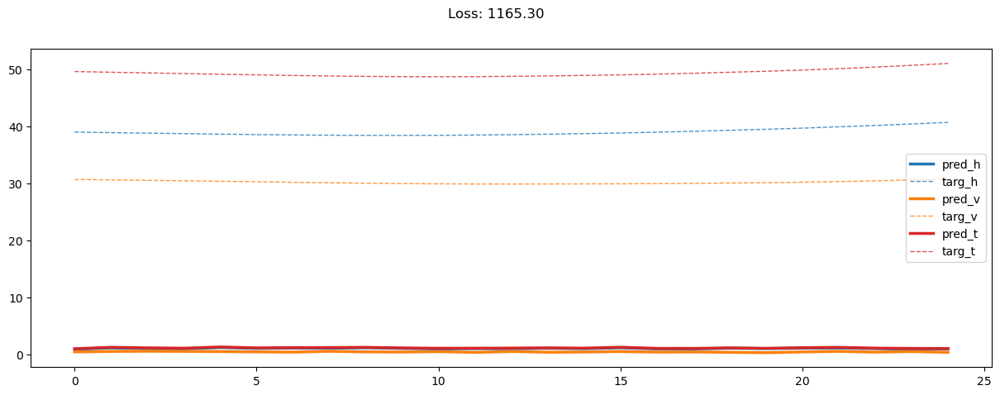

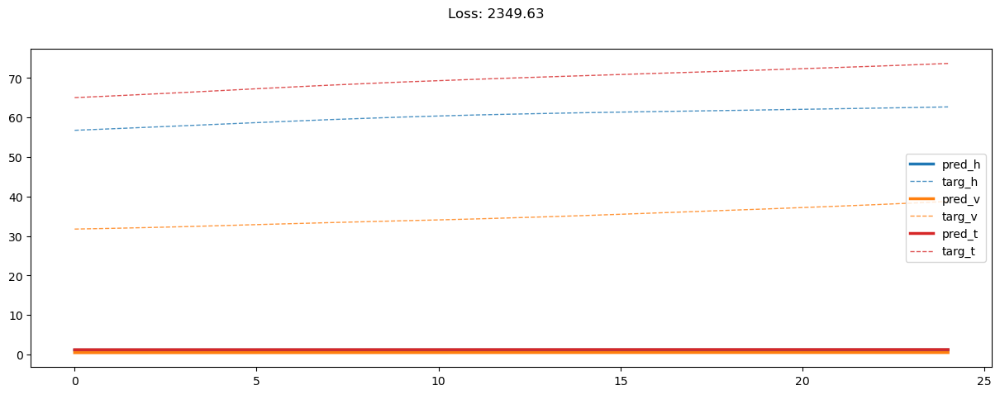

00020: train loss:  3131.341, imu loss:  0.676, mag loss:  1393.310, div loss:  297.309, slim:  21.835, tlim:  23.879
       valid loss:  2888.050, imu loss:  0.484, mag loss:  1389.970, div loss:  62.285, slim:  22.435, tlim:  22.749
00040: train loss:  2800.422, imu loss:  0.675, mag loss:  1223.654, div loss:  301.005, slim:  22.086, tlim:  26.927
       valid loss:  2557.777, imu loss:  0.484, mag loss:  1222.618, div loss:  62.295, slim:  22.698, tlim:  25.608
00060: train loss:  2381.490, imu loss:  0.676, mag loss:  1012.687, div loss:  297.100, slim:  22.933, tlim:  31.249
       valid loss:  2144.034, imu loss:  0.484, mag loss:  1012.331, div loss:  62.302, slim:  23.579, tlim:  29.865
00080: train loss:  1946.998, imu loss:  0.677, mag loss:  788.611, div loss:  301.676, slim:  24.703, tlim:  36.714
       valid loss:  1702.044, imu loss:  0.484, mag loss:  786.798, div loss:  62.304, slim:  25.333, tlim:  35.329
00100: train loss:  1532.935, imu loss:  0.676, mag loss:  577

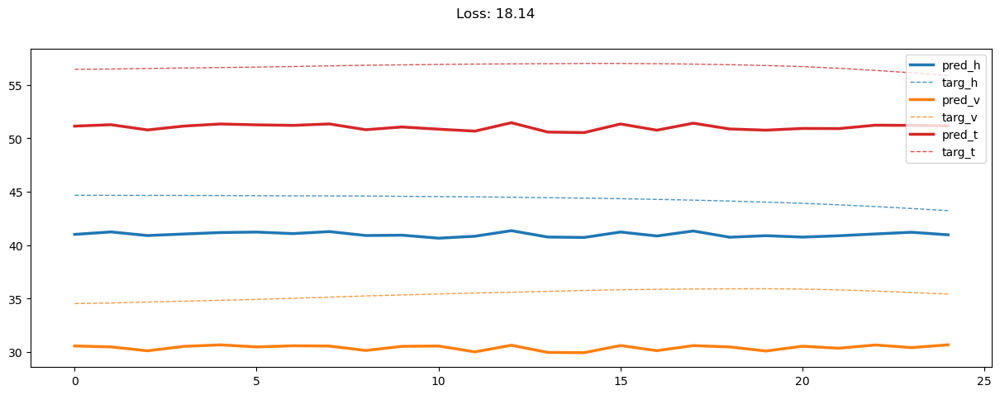

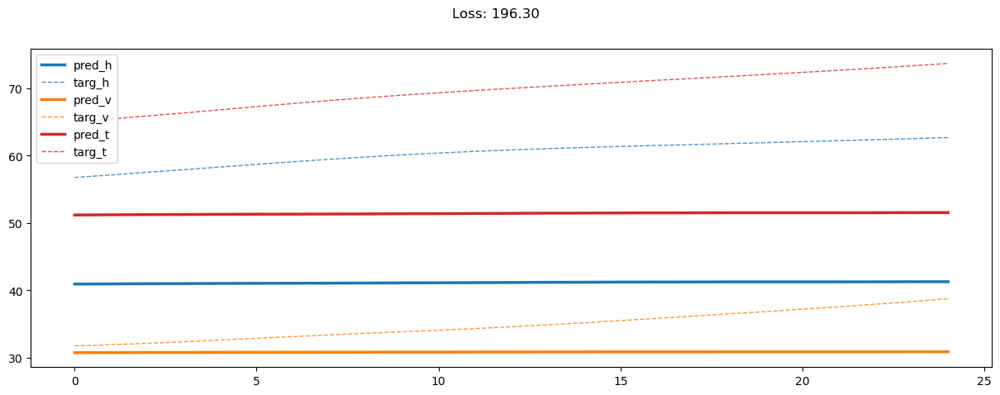

00200: train loss:  657.740, imu loss:  0.676, mag loss:  146.203, div loss:  244.147, slim:  45.326, tlim:  65.232
       valid loss:  482.935, imu loss:  0.483, mag loss:  165.732, div loss:  41.456, slim:  40.910, tlim:  59.385
00220: train loss:  546.872, imu loss:  0.677, mag loss:  112.099, div loss:  198.118, slim:  46.893, tlim:  66.955
       valid loss:  447.155, imu loss:  0.483, mag loss:  151.695, div loss:  33.989, slim:  40.693, tlim:  59.298
00240: train loss:  511.039, imu loss:  0.677, mag loss:  98.849, div loss:  185.250, slim:  48.673, tlim:  68.718
       valid loss:  376.456, imu loss:  0.483, mag loss:  113.212, div loss:  32.702, slim:  44.423, tlim:  63.090
00260: train loss:  494.657, imu loss:  0.677, mag loss:  92.941, div loss:  179.068, slim:  49.427, tlim:  69.544
       valid loss:  361.750, imu loss:  0.483, mag loss:  105.242, div loss:  31.960, slim:  45.401, tlim:  64.082
00280: train loss:  483.523, imu loss:  0.676, mag loss:  89.563, div loss:  1

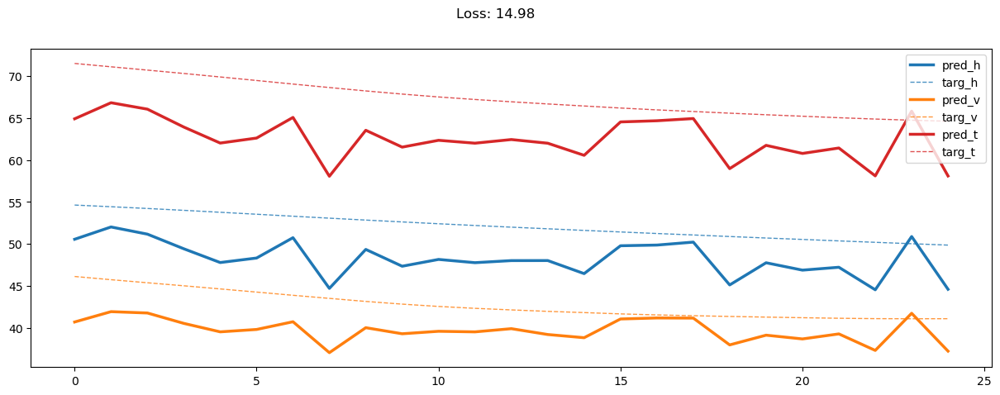

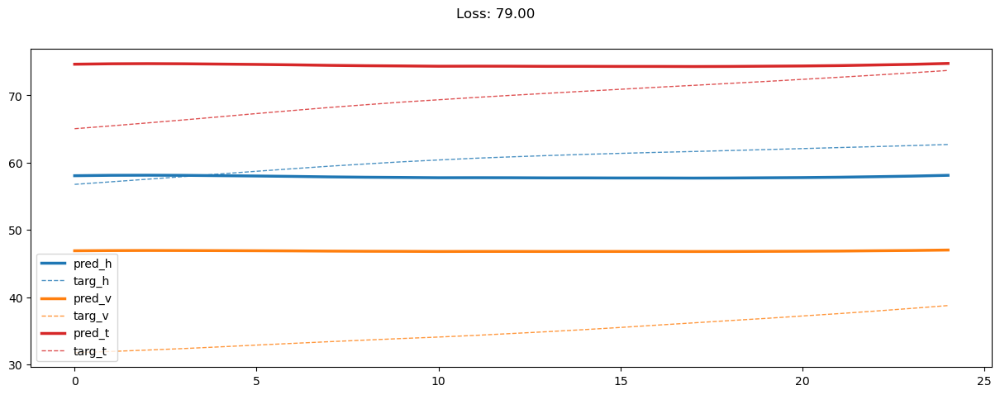

00400: train loss:  457.271, imu loss:  0.676, mag loss:  81.147, div loss:  162.737, slim:  50.855, tlim:  70.758
       valid loss:  313.910, imu loss:  0.483, mag loss:  78.092, div loss:  30.290, slim:  49.460, tlim:  68.149
00420: train loss:  452.671, imu loss:  0.675, mag loss:  80.607, div loss:  159.311, slim:  50.719, tlim:  70.741
       valid loss:  317.406, imu loss:  0.483, mag loss:  80.221, div loss:  30.747, slim:  48.850, tlim:  67.540
00440: train loss:  446.769, imu loss:  0.678, mag loss:  79.592, div loss:  155.037, slim:  50.867, tlim:  70.957
       valid loss:  317.077, imu loss:  0.483, mag loss:  80.231, div loss:  30.824, slim:  48.638, tlim:  67.327
00460: train loss:  445.104, imu loss:  0.675, mag loss:  78.682, div loss:  155.029, slim:  51.037, tlim:  71.012
       valid loss:  312.878, imu loss:  0.483, mag loss:  77.024, div loss:  31.053, slim:  49.630, tlim:  68.319
00480: train loss:  441.076, imu loss:  0.675, mag loss:  77.578, div loss:  153.226

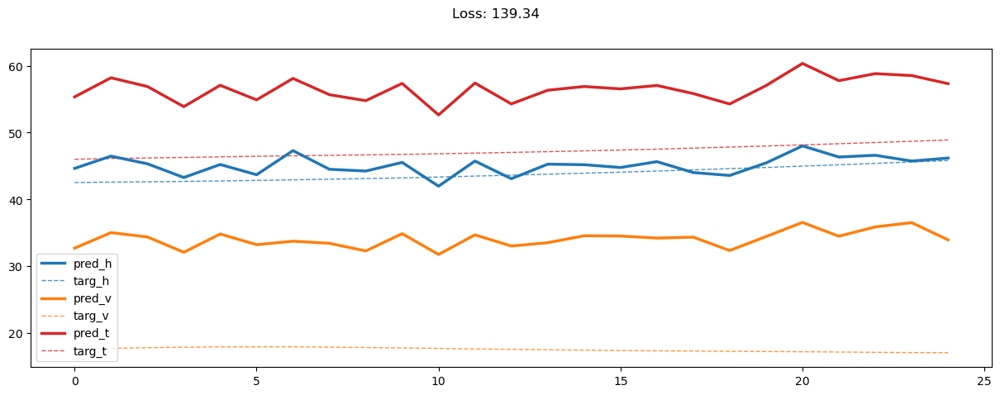

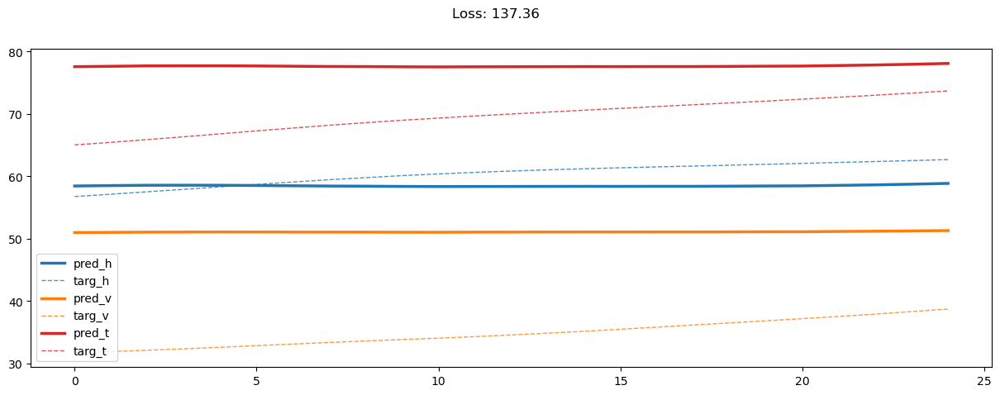

00600: train loss:  430.090, imu loss:  0.674, mag loss:  74.232, div loss:  148.778, slim:  51.039, tlim:  71.103
       valid loss:  308.926, imu loss:  0.482, mag loss:  75.196, div loss:  31.206, slim:  49.406, tlim:  68.095
00620: train loss:  424.076, imu loss:  0.677, mag loss:  73.224, div loss:  144.701, slim:  51.111, tlim:  71.130
       valid loss:  307.315, imu loss:  0.482, mag loss:  73.824, div loss:  31.641, slim:  49.755, tlim:  68.444
00640: train loss:  423.417, imu loss:  0.675, mag loss:  72.662, div loss:  145.084, slim:  51.154, tlim:  71.171
       valid loss:  308.463, imu loss:  0.482, mag loss:  74.111, div loss:  32.329, slim:  49.699, tlim:  68.388
00660: train loss:  417.092, imu loss:  0.674, mag loss:  71.669, div loss:  140.530, slim:  51.203, tlim:  71.299
       valid loss:  313.083, imu loss:  0.482, mag loss:  76.983, div loss:  33.150, slim:  48.725, tlim:  67.415
00680: train loss:  418.814, imu loss:  0.674, mag loss:  71.569, div loss:  142.718

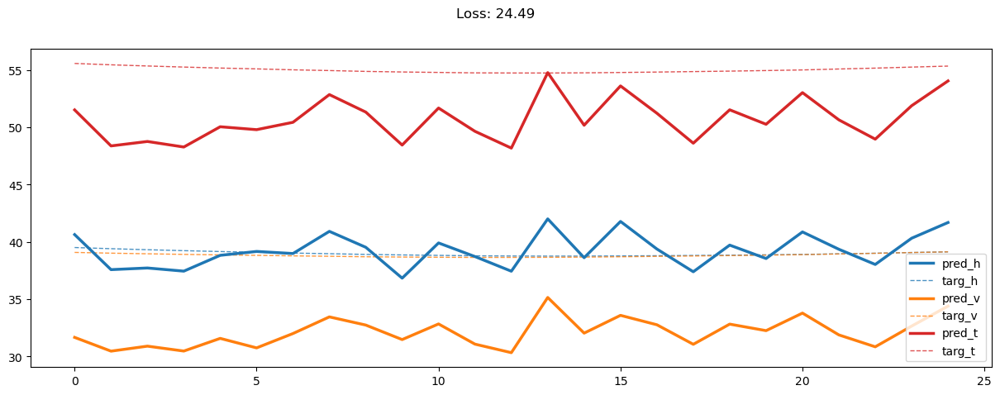

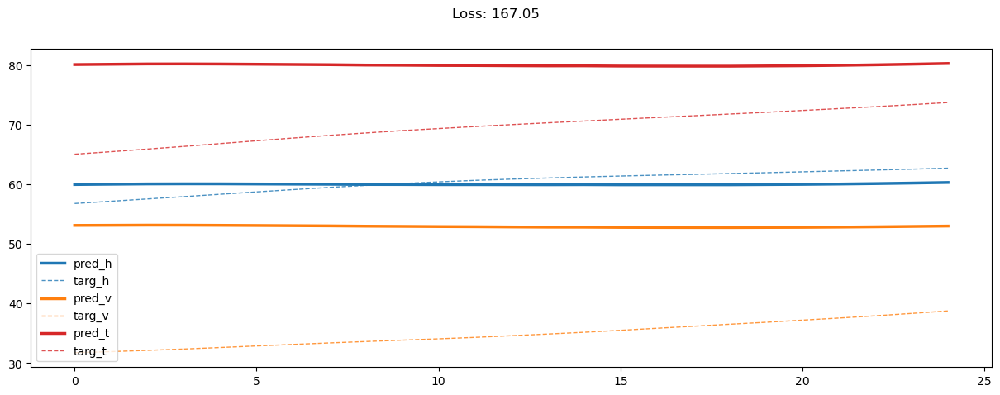

00800: train loss:  409.577, imu loss:  0.673, mag loss:  68.814, div loss:  138.871, slim:  51.139, tlim:  71.224
       valid loss:  310.668, imu loss:  0.481, mag loss:  73.804, div loss:  34.916, slim:  49.814, tlim:  68.503
00820: train loss:  403.586, imu loss:  0.673, mag loss:  68.293, div loss:  133.762, slim:  51.288, tlim:  71.281
       valid loss:  318.609, imu loss:  0.481, mag loss:  77.141, div loss:  36.675, slim:  49.568, tlim:  68.257
00840: train loss:  402.727, imu loss:  0.673, mag loss:  67.421, div loss:  134.925, slim:  51.152, tlim:  71.140
       valid loss:  314.477, imu loss:  0.481, mag loss:  75.262, div loss:  36.251, slim:  49.594, tlim:  68.283
00860: train loss:  401.558, imu loss:  0.675, mag loss:  67.307, div loss:  133.892, slim:  51.198, tlim:  71.186
       valid loss:  317.936, imu loss:  0.481, mag loss:  76.725, div loss:  37.139, slim:  49.416, tlim:  68.105
00880: train loss:  401.728, imu loss:  0.675, mag loss:  67.253, div loss:  133.779

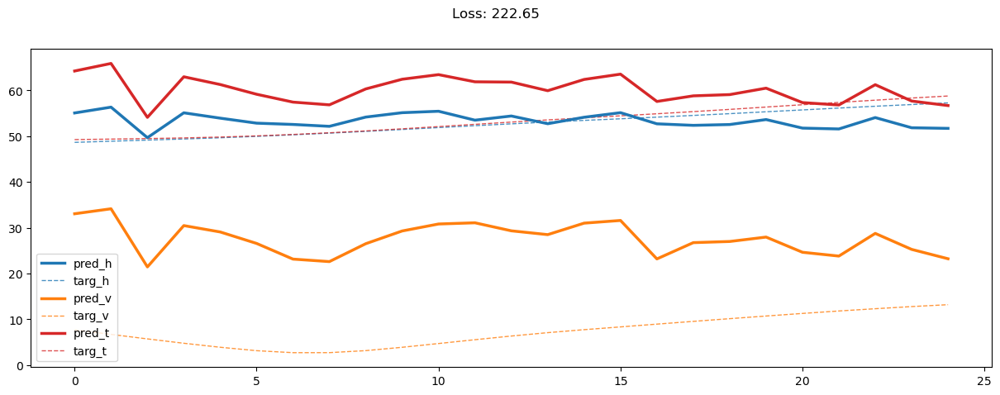

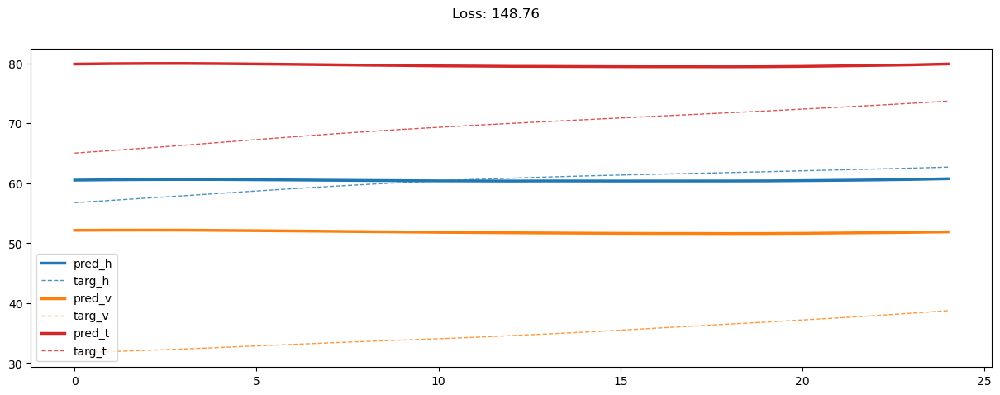

01000: train loss:  390.823, imu loss:  0.673, mag loss:  64.860, div loss:  127.945, slim:  51.162, tlim:  71.269
       valid loss:  320.779, imu loss:  0.481, mag loss:  75.731, div loss:  39.659, slim:  50.572, tlim:  69.262
01020: train loss:  392.335, imu loss:  0.673, mag loss:  64.993, div loss:  129.188, slim:  51.263, tlim:  71.238
       valid loss:  318.982, imu loss:  0.480, mag loss:  75.945, div loss:  38.215, slim:  50.182, tlim:  68.871
01040: train loss:  389.858, imu loss:  0.676, mag loss:  64.562, div loss:  127.367, slim:  51.303, tlim:  71.360
       valid loss:  321.341, imu loss:  0.480, mag loss:  76.050, div loss:  39.627, slim:  50.550, tlim:  69.239
01060: train loss:  389.132, imu loss:  0.674, mag loss:  64.252, div loss:  127.011, slim:  51.462, tlim:  71.474
       valid loss:  324.353, imu loss:  0.480, mag loss:  78.208, div loss:  40.169, slim:  49.627, tlim:  68.317
01080: train loss:  387.601, imu loss:  0.673, mag loss:  63.894, div loss:  126.685

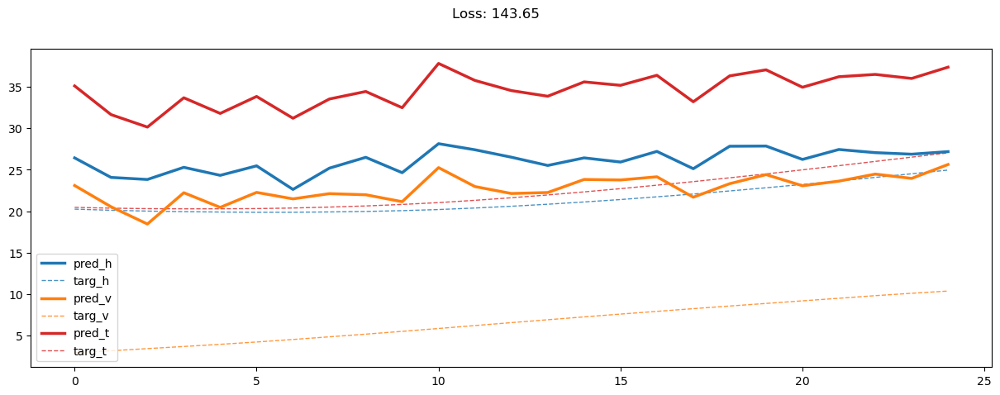

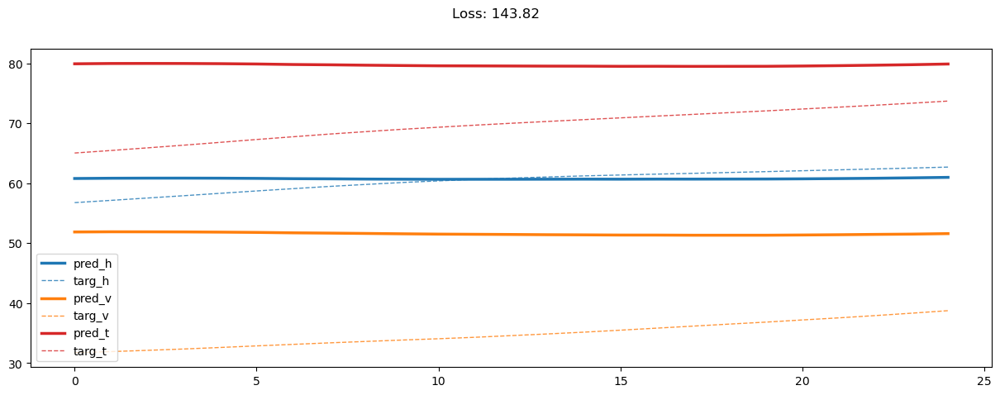

01200: train loss:  378.088, imu loss:  0.674, mag loss:  61.699, div loss:  121.482, slim:  51.212, tlim:  71.286
       valid loss:  331.564, imu loss:  0.480, mag loss:  79.067, div loss:  43.993, slim:  50.462, tlim:  69.151
01220: train loss:  379.222, imu loss:  0.672, mag loss:  61.547, div loss:  122.980, slim:  51.220, tlim:  71.244
       valid loss:  337.910, imu loss:  0.480, mag loss:  81.333, div loss:  45.184, slim:  50.774, tlim:  69.463
01240: train loss:  376.533, imu loss:  0.672, mag loss:  61.132, div loss:  121.004, slim:  51.268, tlim:  71.306
       valid loss:  332.516, imu loss:  0.480, mag loss:  79.013, div loss:  44.277, slim:  50.850, tlim:  69.539
01260: train loss:  373.198, imu loss:  0.673, mag loss:  60.407, div loss:  119.092, slim:  51.373, tlim:  71.289
       valid loss:  330.344, imu loss:  0.480, mag loss:  79.693, div loss:  42.880, slim:  49.783, tlim:  68.471
01280: train loss:  372.770, imu loss:  0.673, mag loss:  60.020, div loss:  119.567

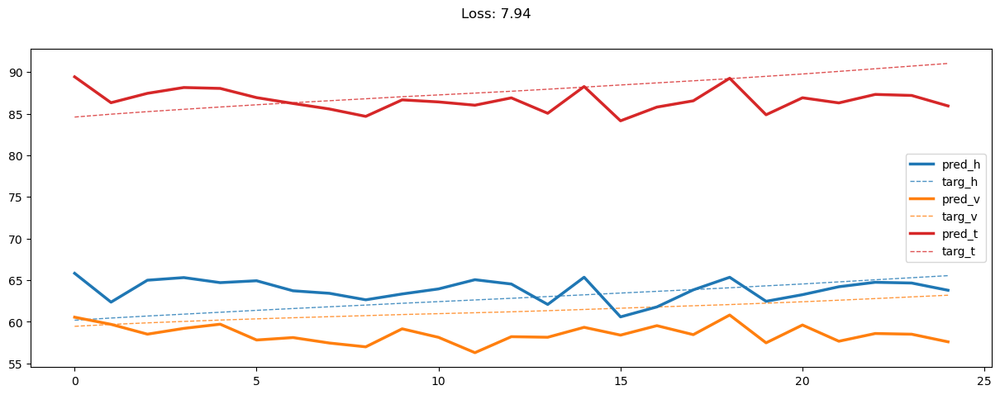

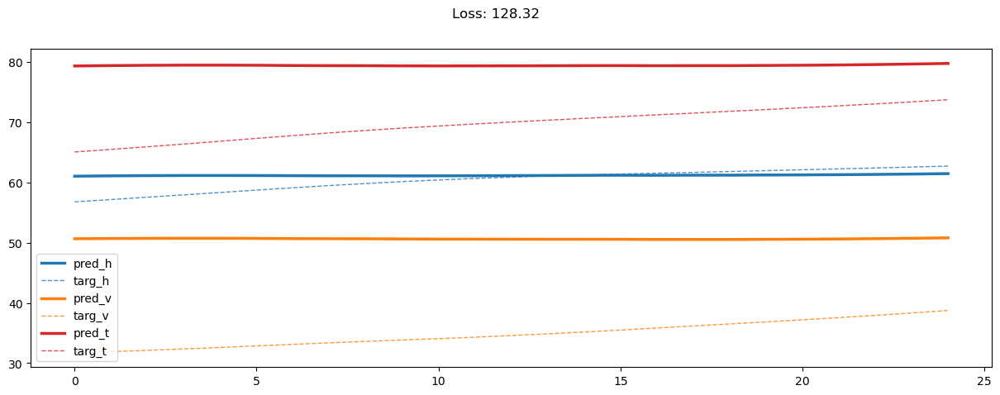

01400: train loss:  365.726, imu loss:  0.672, mag loss:  58.650, div loss:  115.075, slim:  51.298, tlim:  71.354
       valid loss:  337.096, imu loss:  0.480, mag loss:  80.070, div loss:  46.785, slim:  50.828, tlim:  69.517
01420: train loss:  361.448, imu loss:  0.674, mag loss:  57.442, div loss:  113.287, slim:  51.305, tlim:  71.299
       valid loss:  337.738, imu loss:  0.480, mag loss:  80.344, div loss:  46.657, slim:  50.941, tlim:  69.629
01440: train loss:  362.589, imu loss:  0.674, mag loss:  57.654, div loss:  114.133, slim:  51.238, tlim:  71.237
       valid loss:  343.519, imu loss:  0.480, mag loss:  82.044, div loss:  49.009, slim:  50.955, tlim:  69.644
01460: train loss:  362.219, imu loss:  0.671, mag loss:  57.395, div loss:  114.127, slim:  51.317, tlim:  71.314
       valid loss:  341.398, imu loss:  0.480, mag loss:  81.030, div loss:  48.739, slim:  51.043, tlim:  69.732
01480: train loss:  358.905, imu loss:  0.671, mag loss:  56.986, div loss:  111.761

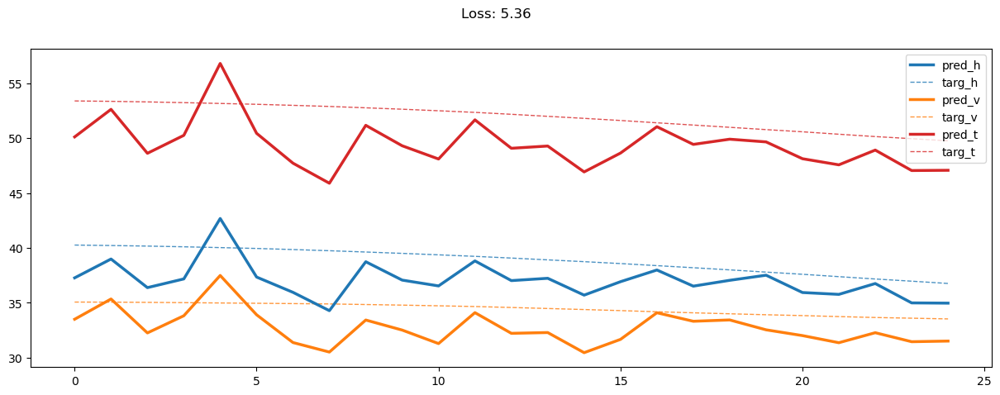

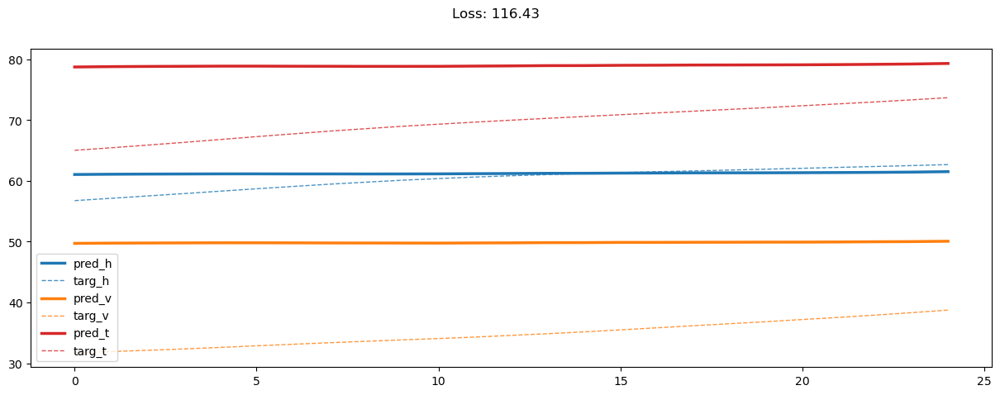

01600: train loss:  352.348, imu loss:  0.671, mag loss:  55.295, div loss:  108.375, slim:  51.407, tlim:  71.339
       valid loss:  348.743, imu loss:  0.480, mag loss:  83.668, div loss:  51.682, slim:  50.606, tlim:  69.295
01620: train loss:  348.830, imu loss:  0.671, mag loss:  54.094, div loss:  107.128, slim:  51.401, tlim:  71.428
       valid loss:  345.735, imu loss:  0.479, mag loss:  82.234, div loss:  51.364, slim:  50.695, tlim:  69.384
01640: train loss:  345.037, imu loss:  0.670, mag loss:  53.623, div loss:  104.298, slim:  51.454, tlim:  71.397
       valid loss:  349.946, imu loss:  0.479, mag loss:  83.391, div loss:  52.519, slim:  51.066, tlim:  69.755
01660: train loss:  349.604, imu loss:  0.672, mag loss:  54.027, div loss:  108.349, slim:  51.307, tlim:  71.251
       valid loss:  345.877, imu loss:  0.479, mag loss:  81.492, div loss:  51.283, slim:  51.548, tlim:  70.237
01680: train loss:  347.671, imu loss:  0.673, mag loss:  53.369, div loss:  107.304

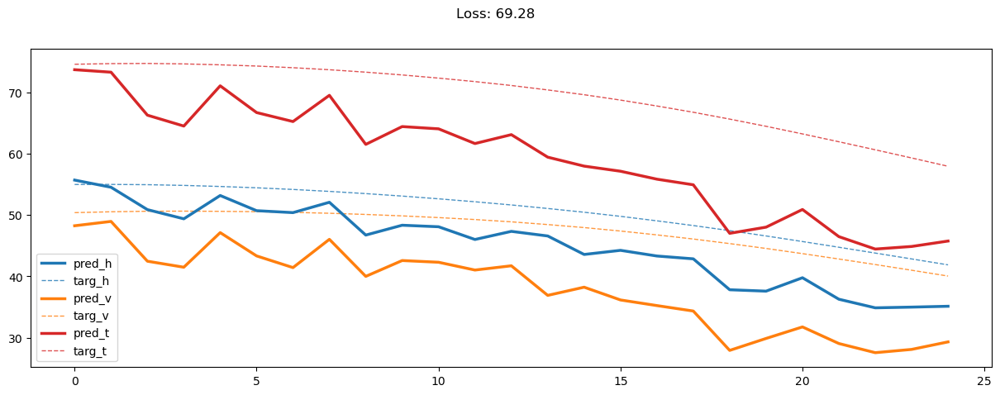

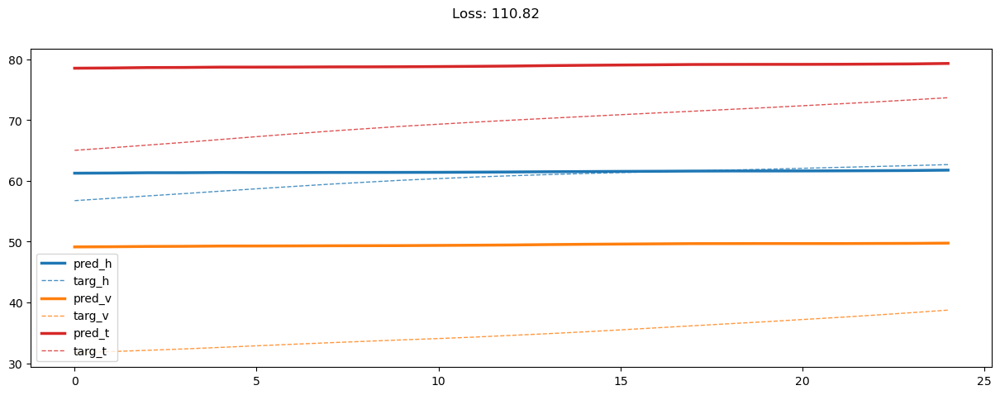

01800: train loss:  337.810, imu loss:  0.672, mag loss:  51.387, div loss:  101.521, slim:  51.384, tlim:  71.434
       valid loss:  350.972, imu loss:  0.479, mag loss:  83.055, div loss:  53.037, slim:  51.656, tlim:  70.346
01820: train loss:  336.110, imu loss:  0.671, mag loss:  50.936, div loss:  100.683, slim:  51.419, tlim:  71.451
       valid loss:  348.107, imu loss:  0.479, mag loss:  82.424, div loss:  52.238, slim:  51.254, tlim:  69.943
01840: train loss:  334.535, imu loss:  0.671, mag loss:  51.019, div loss:  98.999, slim:  51.405, tlim:  71.417
       valid loss:  351.067, imu loss:  0.479, mag loss:  84.223, div loss:  53.252, slim:  50.428, tlim:  69.117
01860: train loss:  332.990, imu loss:  0.671, mag loss:  50.514, div loss:  98.689, slim:  51.281, tlim:  71.308
       valid loss:  354.331, imu loss:  0.479, mag loss:  84.590, div loss:  53.372, slim:  51.633, tlim:  70.322
01880: train loss:  331.733, imu loss:  0.671, mag loss:  50.038, div loss:  97.855, s

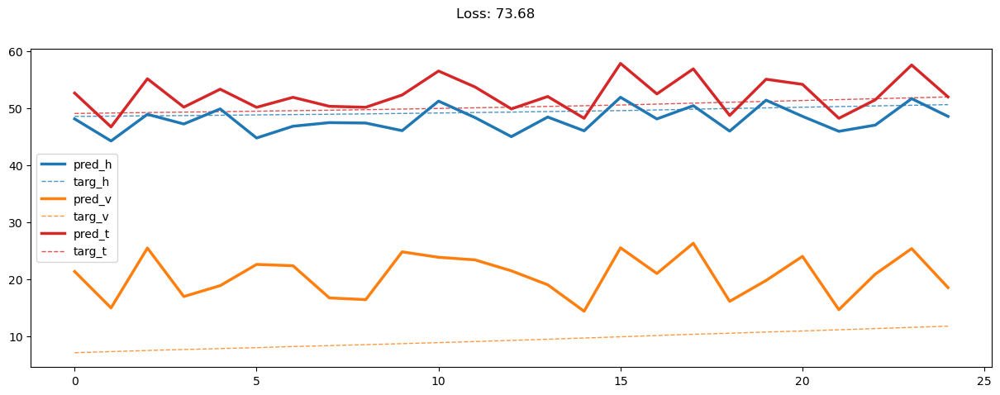

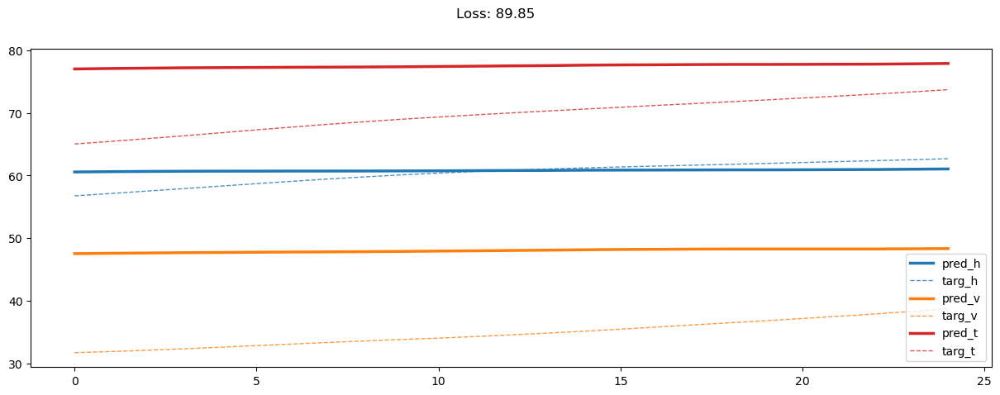

02000: train loss:  321.198, imu loss:  0.671, mag loss:  47.116, div loss:  93.274, slim:  51.526, tlim:  71.505
       valid loss:  353.152, imu loss:  0.479, mag loss:  83.343, div loss:  54.439, slim:  51.757, tlim:  70.446
02020: train loss:  321.238, imu loss:  0.671, mag loss:  47.199, div loss:  93.201, slim:  51.493, tlim:  71.481
       valid loss:  357.210, imu loss:  0.479, mag loss:  84.318, div loss:  56.276, slim:  51.893, tlim:  70.582
02040: train loss:  319.464, imu loss:  0.669, mag loss:  46.849, div loss:  92.029, slim:  51.522, tlim:  71.538
       valid loss:  358.638, imu loss:  0.479, mag loss:  85.335, div loss:  56.555, slim:  51.450, tlim:  70.140
02060: train loss:  319.126, imu loss:  0.672, mag loss:  46.840, div loss:  91.958, slim:  51.362, tlim:  71.423
       valid loss:  355.674, imu loss:  0.479, mag loss:  84.484, div loss:  55.544, slim:  51.324, tlim:  70.014
02080: train loss:  321.160, imu loss:  0.671, mag loss:  47.006, div loss:  93.482, sli

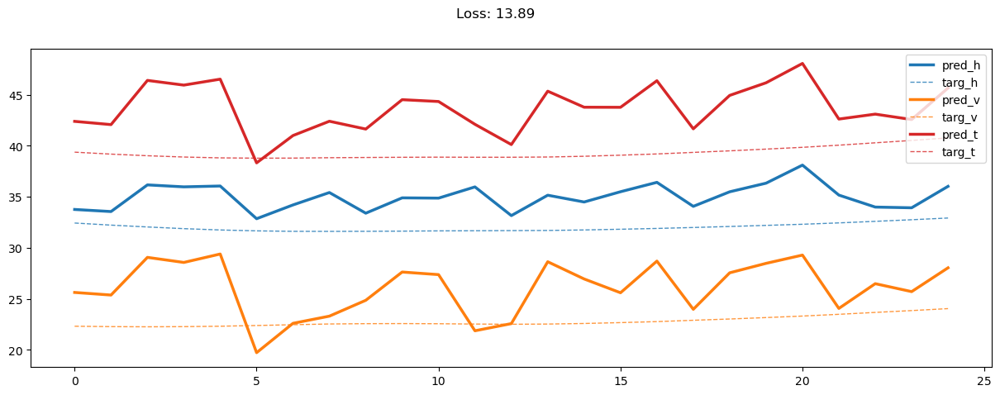

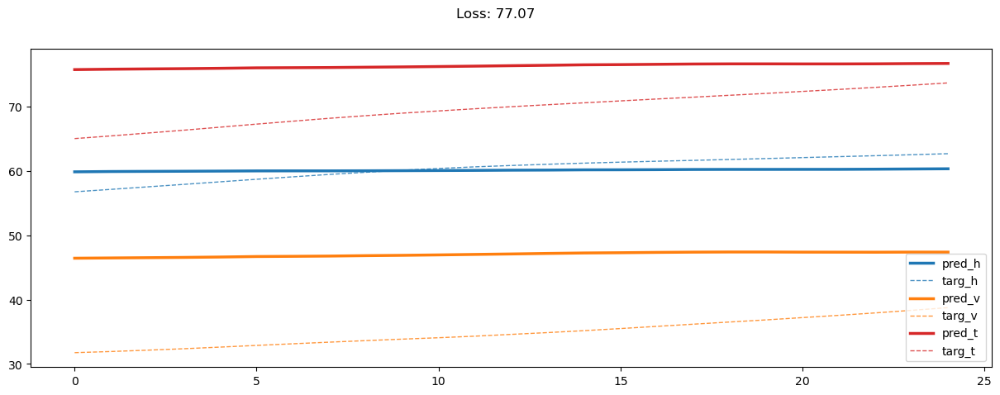

02200: train loss:  312.053, imu loss:  0.671, mag loss:  44.689, div loss:  88.823, slim:  51.615, tlim:  71.582
       valid loss:  357.950, imu loss:  0.479, mag loss:  84.141, div loss:  57.630, slim:  51.763, tlim:  70.452
02220: train loss:  311.186, imu loss:  0.671, mag loss:  44.733, div loss:  88.175, slim:  51.423, tlim:  71.440
       valid loss:  358.840, imu loss:  0.479, mag loss:  84.773, div loss:  56.934, slim:  51.924, tlim:  70.613
02240: train loss:  309.665, imu loss:  0.670, mag loss:  44.313, div loss:  87.229, slim:  51.495, tlim:  71.595
       valid loss:  362.454, imu loss:  0.479, mag loss:  85.479, div loss:  59.164, slim:  51.909, tlim:  70.599
02260: train loss:  309.217, imu loss:  0.671, mag loss:  44.259, div loss:  87.236, slim:  51.406, tlim:  71.393
       valid loss:  360.166, imu loss:  0.479, mag loss:  84.719, div loss:  58.484, slim:  51.866, tlim:  70.555
02280: train loss:  306.831, imu loss:  0.669, mag loss:  43.759, div loss:  85.784, sli

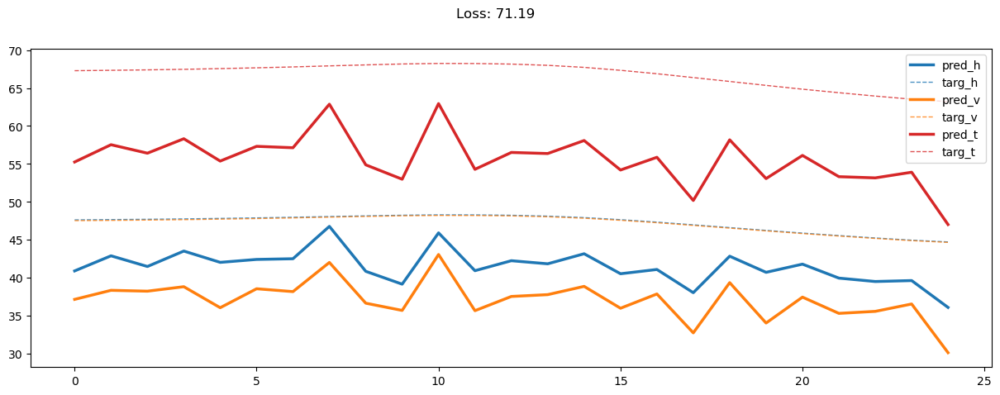

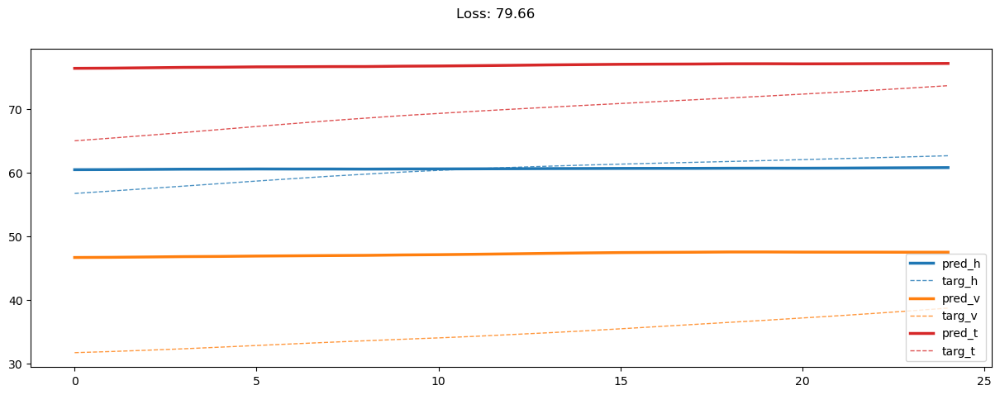

02400: train loss:  300.828, imu loss:  0.671, mag loss:  42.233, div loss:  82.690, slim:  51.504, tlim:  71.500
       valid loss:  366.407, imu loss:  0.479, mag loss:  86.300, div loss:  60.617, slim:  52.338, tlim:  71.027
02420: train loss:  300.088, imu loss:  0.670, mag loss:  41.970, div loss:  82.170, slim:  51.595, tlim:  71.673
       valid loss:  367.975, imu loss:  0.479, mag loss:  87.175, div loss:  61.682, slim:  51.716, tlim:  70.405
02440: train loss:  298.216, imu loss:  0.669, mag loss:  41.503, div loss:  81.669, slim:  51.455, tlim:  71.430
       valid loss:  367.638, imu loss:  0.479, mag loss:  86.961, div loss:  61.642, slim:  51.781, tlim:  70.470
02460: train loss:  297.011, imu loss:  0.670, mag loss:  41.274, div loss:  80.855, slim:  51.520, tlim:  71.452
       valid loss:  367.624, imu loss:  0.478, mag loss:  86.640, div loss:  62.599, slim:  51.617, tlim:  70.306
02480: train loss:  296.172, imu loss:  0.669, mag loss:  41.042, div loss:  80.490, sli

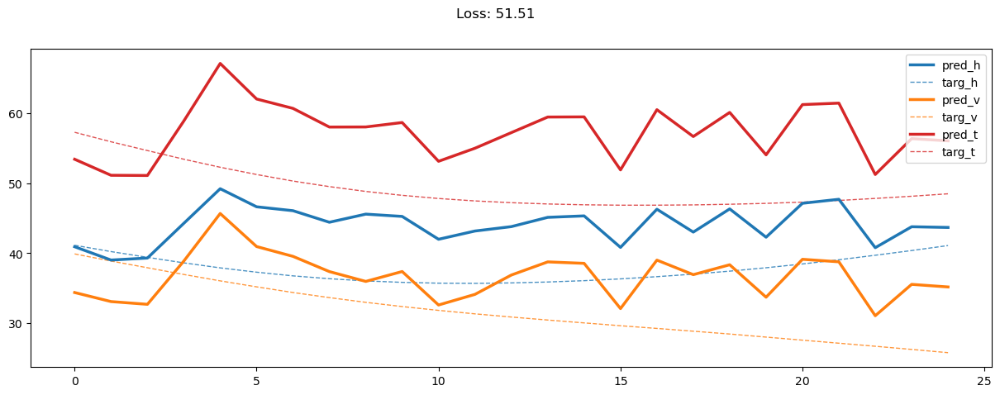

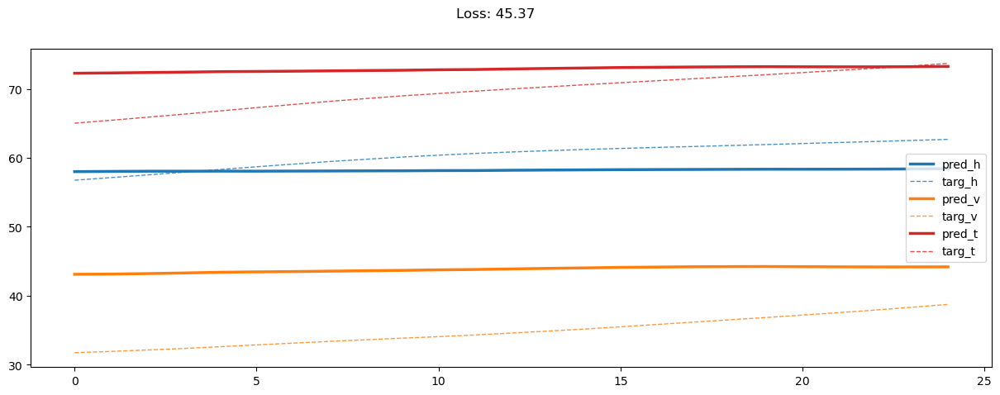

02600: train loss:  293.814, imu loss:  0.668, mag loss:  39.895, div loss:  80.359, slim:  51.418, tlim:  71.526
       valid loss:  368.447, imu loss:  0.478, mag loss:  86.278, div loss:  62.897, slim:  52.241, tlim:  70.931
02620: train loss:  288.040, imu loss:  0.669, mag loss:  38.835, div loss:  76.768, slim:  51.433, tlim:  71.478
       valid loss:  374.400, imu loss:  0.478, mag loss:  88.654, div loss:  64.484, slim:  52.048, tlim:  70.737
02640: train loss:  286.646, imu loss:  0.670, mag loss:  38.313, div loss:  76.105, slim:  51.643, tlim:  71.615
       valid loss:  372.488, imu loss:  0.478, mag loss:  87.557, div loss:  64.925, slim:  51.968, tlim:  70.658
02660: train loss:  288.840, imu loss:  0.670, mag loss:  39.024, div loss:  77.158, slim:  51.502, tlim:  71.475
       valid loss:  373.193, imu loss:  0.478, mag loss:  88.062, div loss:  65.506, slim:  51.525, tlim:  70.214
02680: train loss:  287.993, imu loss:  0.669, mag loss:  38.610, div loss:  77.090, sli

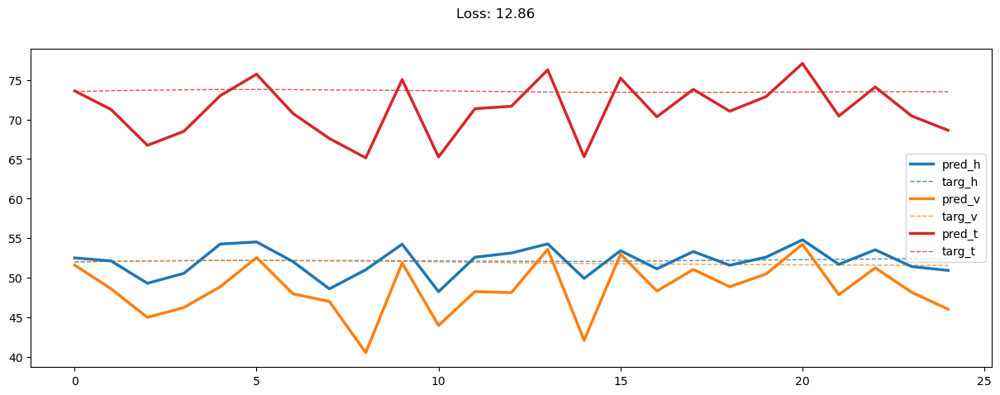

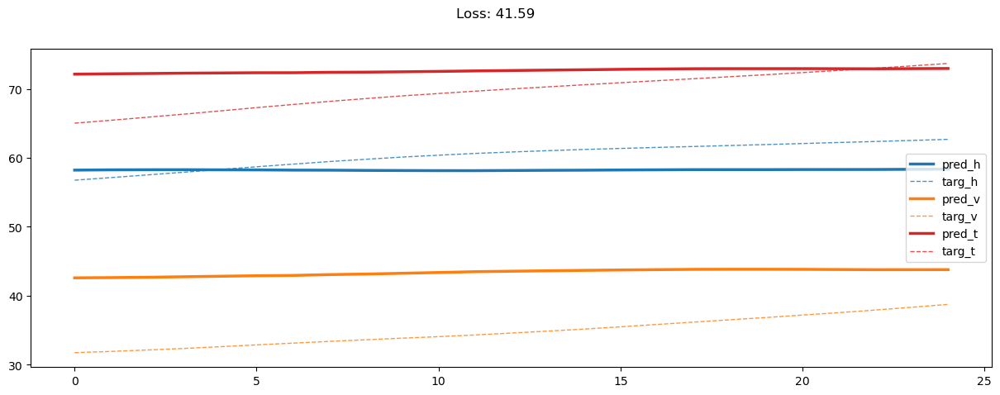

02800: train loss:  279.217, imu loss:  0.668, mag loss:  36.472, div loss:  72.333, slim:  51.570, tlim:  71.658
       valid loss:  372.662, imu loss:  0.478, mag loss:  88.092, div loss:  63.803, slim:  52.081, tlim:  70.770
02820: train loss:  279.447, imu loss:  0.670, mag loss:  36.686, div loss:  72.361, slim:  51.410, tlim:  71.559
       valid loss:  375.387, imu loss:  0.478, mag loss:  88.743, div loss:  65.752, slim:  51.818, tlim:  70.507
02840: train loss:  278.744, imu loss:  0.667, mag loss:  36.605, div loss:  71.658, slim:  51.555, tlim:  71.622
       valid loss:  377.116, imu loss:  0.478, mag loss:  89.861, div loss:  66.463, slim:  51.209, tlim:  69.899
02860: train loss:  276.647, imu loss:  0.669, mag loss:  35.935, div loss:  71.035, slim:  51.575, tlim:  71.523
       valid loss:  374.078, imu loss:  0.478, mag loss:  88.486, div loss:  64.682, slim:  51.956, tlim:  70.645
02880: train loss:  275.092, imu loss:  0.668, mag loss:  35.552, div loss:  70.245, sli

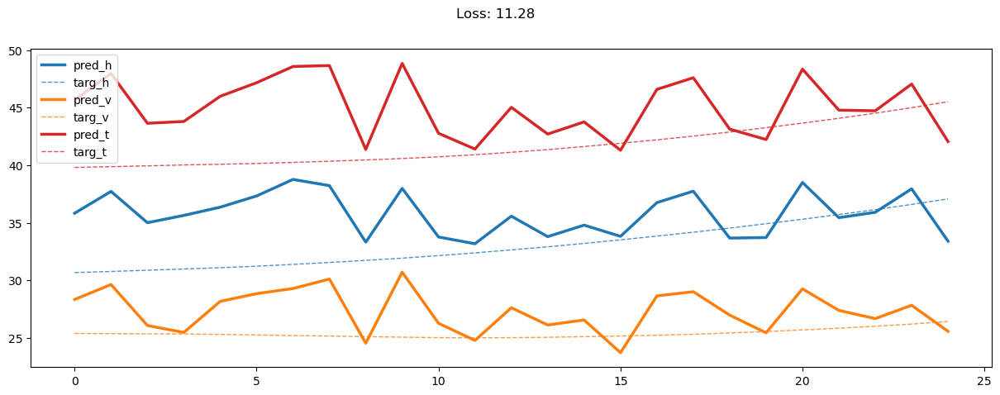

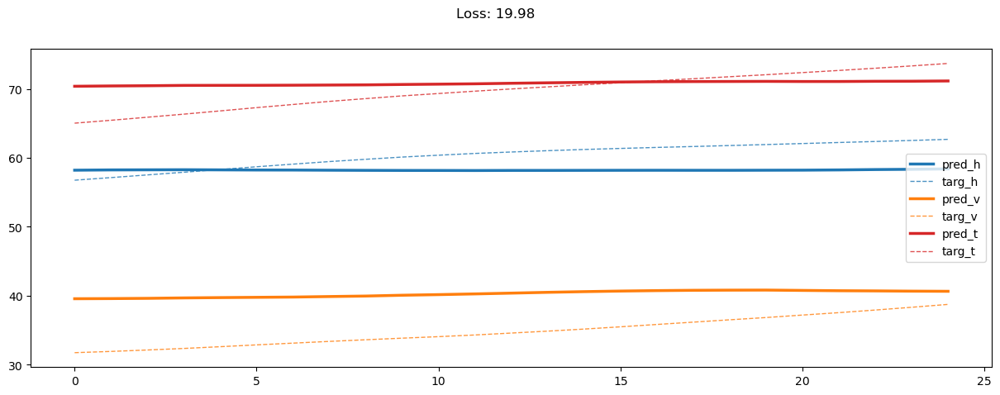

03000: train loss:  270.494, imu loss:  0.668, mag loss:  34.314, div loss:  68.151, slim:  51.524, tlim:  71.523
       valid loss:  378.624, imu loss:  0.478, mag loss:  89.612, div loss:  67.168, slim:  51.860, tlim:  70.549
03020: train loss:  271.348, imu loss:  0.668, mag loss:  34.626, div loss:  68.391, slim:  51.498, tlim:  71.526
       valid loss:  380.491, imu loss:  0.478, mag loss:  90.039, div loss:  68.614, slim:  51.644, tlim:  70.333
03040: train loss:  270.586, imu loss:  0.668, mag loss:  34.381, div loss:  67.766, slim:  51.645, tlim:  71.712
       valid loss:  377.314, imu loss:  0.479, mag loss:  89.266, div loss:  66.037, slim:  52.116, tlim:  70.806
03060: train loss:  268.173, imu loss:  0.668, mag loss:  33.855, div loss:  66.663, slim:  51.582, tlim:  71.561
       valid loss:  384.275, imu loss:  0.479, mag loss:  91.505, div loss:  70.190, slim:  51.281, tlim:  69.971
03080: train loss:  266.299, imu loss:  0.668, mag loss:  33.500, div loss:  65.496, sli

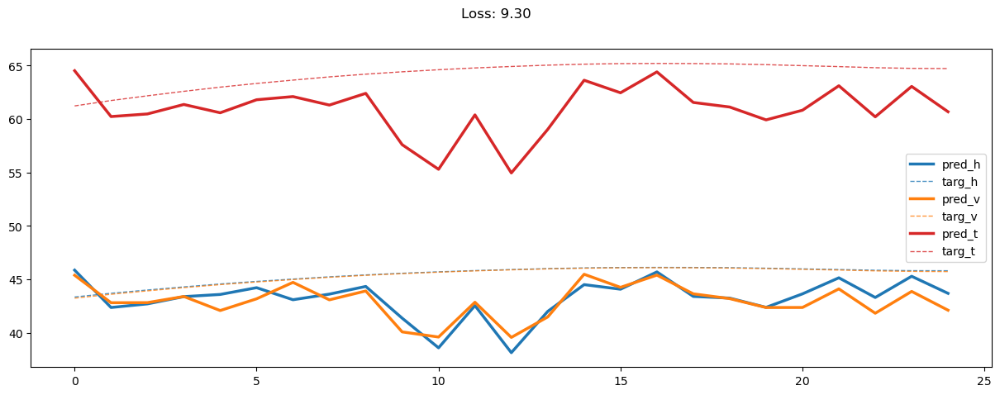

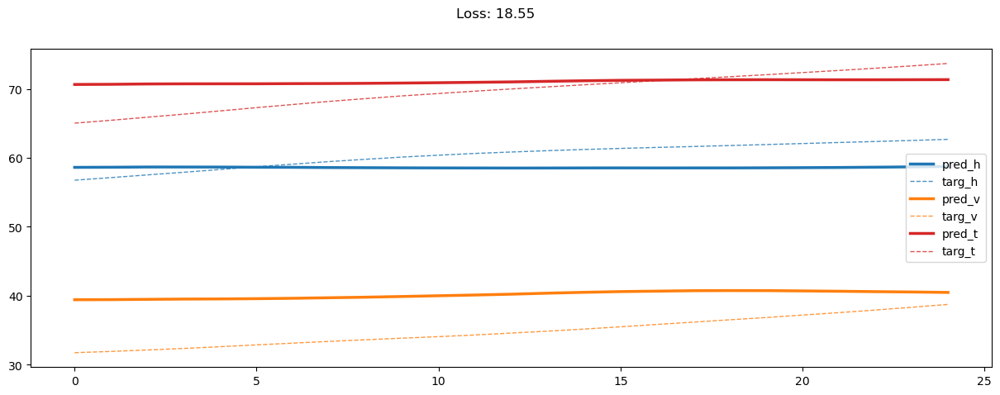

03200: train loss:  259.791, imu loss:  0.667, mag loss:  31.739, div loss:  62.494, slim:  51.574, tlim:  71.577
       valid loss:  384.451, imu loss:  0.479, mag loss:  91.067, div loss:  69.712, slim:  52.046, tlim:  70.735
03220: train loss:  263.451, imu loss:  0.667, mag loss:  32.668, div loss:  64.117, slim:  51.684, tlim:  71.659
       valid loss:  384.119, imu loss:  0.479, mag loss:  91.489, div loss:  69.532, slim:  51.548, tlim:  70.237
03240: train loss:  261.707, imu loss:  0.668, mag loss:  32.132, div loss:  63.395, slim:  51.595, tlim:  71.720
       valid loss:  383.632, imu loss:  0.479, mag loss:  90.713, div loss:  69.750, slim:  51.972, tlim:  70.661
03260: train loss:  260.487, imu loss:  0.668, mag loss:  31.883, div loss:  62.681, slim:  51.708, tlim:  71.678
       valid loss:  381.591, imu loss:  0.479, mag loss:  90.546, div loss:  68.383, slim:  51.801, tlim:  70.491
03280: train loss:  258.988, imu loss:  0.669, mag loss:  31.486, div loss:  62.152, sli

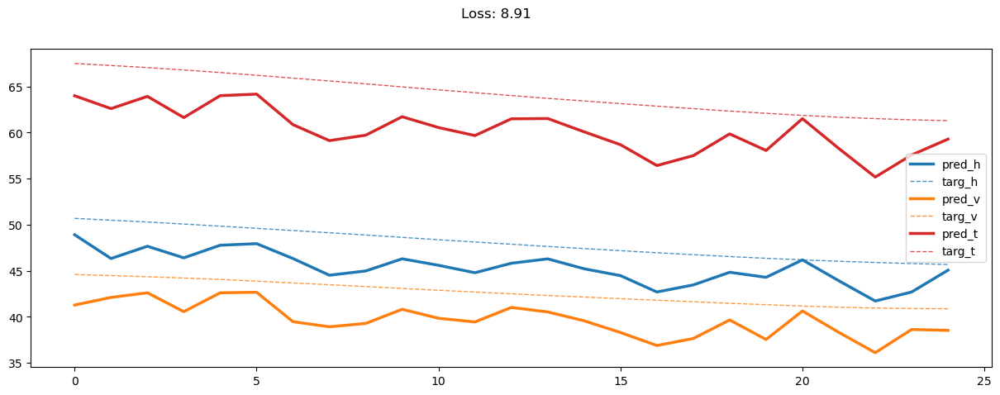

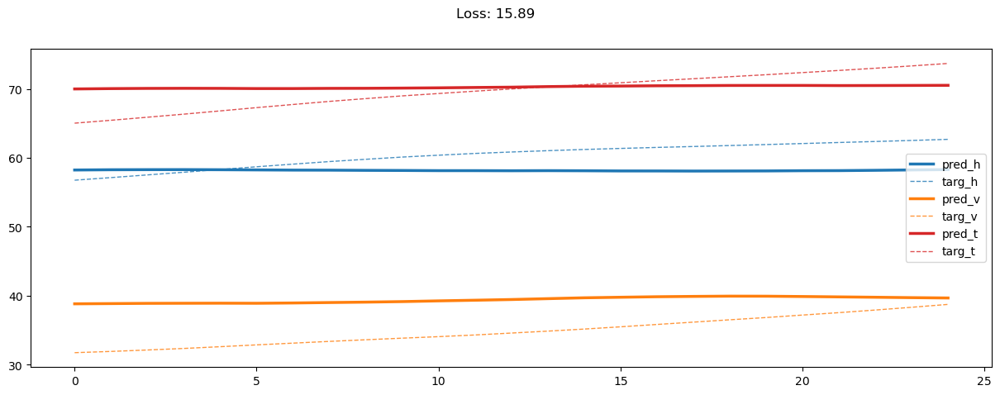

03400: train loss:  255.870, imu loss:  0.667, mag loss:  30.895, div loss:  60.280, slim:  51.491, tlim:  71.591
       valid loss:  379.836, imu loss:  0.479, mag loss:  89.467, div loss:  68.790, slim:  51.800, tlim:  70.489
03420: train loss:  252.963, imu loss:  0.668, mag loss:  30.104, div loss:  58.861, slim:  51.546, tlim:  71.634
       valid loss:  381.618, imu loss:  0.479, mag loss:  90.232, div loss:  68.499, slim:  52.071, tlim:  70.760
03440: train loss:  255.351, imu loss:  0.667, mag loss:  30.608, div loss:  60.319, slim:  51.515, tlim:  71.594
       valid loss:  385.687, imu loss:  0.479, mag loss:  91.086, div loss:  72.018, slim:  51.492, tlim:  70.181
03460: train loss:  252.749, imu loss:  0.668, mag loss:  29.786, div loss:  59.139, slim:  51.618, tlim:  71.707
       valid loss:  382.998, imu loss:  0.479, mag loss:  90.492, div loss:  69.457, slim:  52.022, tlim:  70.711
03480: train loss:  252.830, imu loss:  0.667, mag loss:  30.048, div loss:  58.761, sli

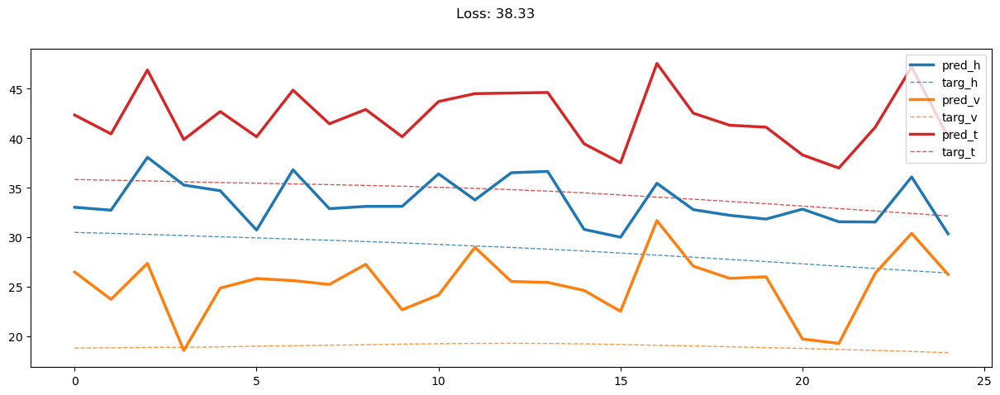

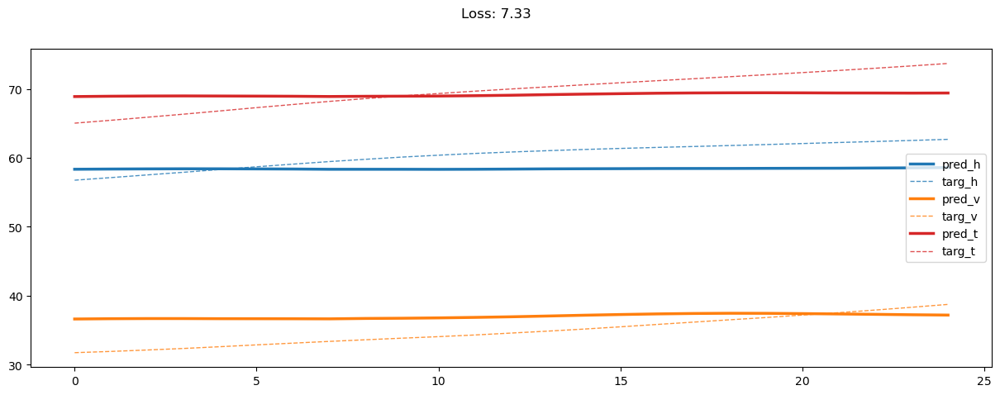

03600: train loss:  250.641, imu loss:  0.667, mag loss:  29.451, div loss:  57.756, slim:  51.556, tlim:  71.692
       valid loss:  388.857, imu loss:  0.479, mag loss:  92.247, div loss:  72.874, slim:  51.488, tlim:  70.177
03620: train loss:  246.553, imu loss:  0.667, mag loss:  28.578, div loss:  55.546, slim:  51.585, tlim:  71.594
       valid loss:  388.874, imu loss:  0.479, mag loss:  92.648, div loss:  71.630, slim:  51.717, tlim:  70.406
03640: train loss:  247.758, imu loss:  0.668, mag loss:  28.832, div loss:  56.361, slim:  51.570, tlim:  71.521
       valid loss:  388.316, imu loss:  0.479, mag loss:  91.966, div loss:  72.468, slim:  51.701, tlim:  70.390
03660: train loss:  247.411, imu loss:  0.666, mag loss:  28.637, div loss:  56.329, slim:  51.560, tlim:  71.575
       valid loss:  386.996, imu loss:  0.479, mag loss:  91.739, div loss:  70.932, slim:  52.037, tlim:  70.726
03680: train loss:  245.740, imu loss:  0.667, mag loss:  28.253, div loss:  55.279, sli

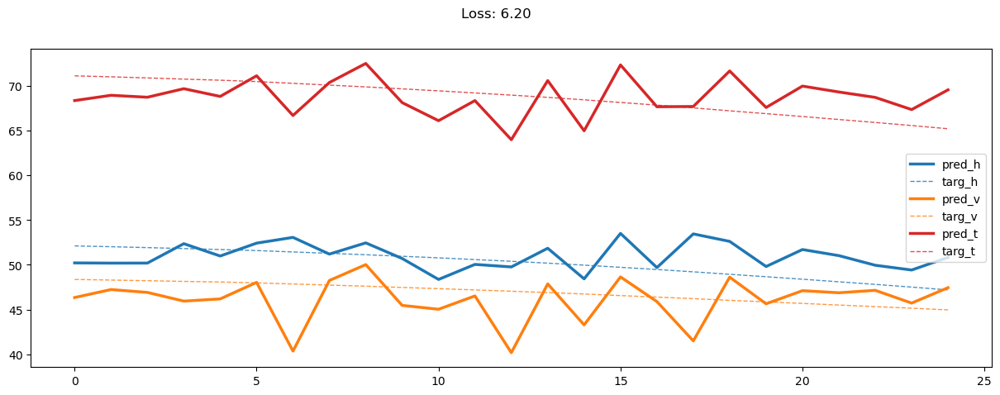

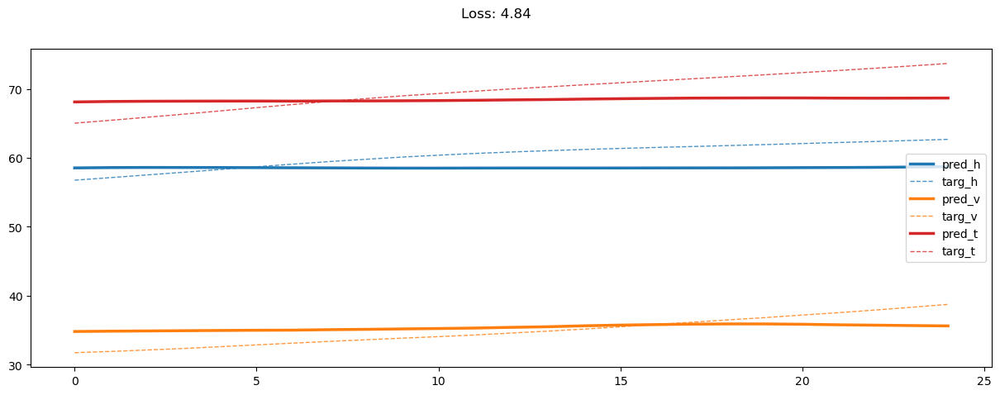

03800: train loss:  240.029, imu loss:  0.668, mag loss:  26.830, div loss:  52.410, slim:  51.662, tlim:  71.640
       valid loss:  389.994, imu loss:  0.479, mag loss:  92.251, div loss:  72.698, slim:  52.141, tlim:  70.830
03820: train loss:  242.180, imu loss:  0.665, mag loss:  27.167, div loss:  53.929, slim:  51.594, tlim:  71.637
       valid loss:  389.433, imu loss:  0.479, mag loss:  92.272, div loss:  72.221, slim:  52.078, tlim:  70.767
03840: train loss:  239.260, imu loss:  0.668, mag loss:  26.757, div loss:  51.964, slim:  51.519, tlim:  71.570
       valid loss:  387.509, imu loss:  0.479, mag loss:  91.612, div loss:  71.659, slim:  52.057, tlim:  70.746
03860: train loss:  239.448, imu loss:  0.667, mag loss:  26.738, div loss:  52.179, slim:  51.511, tlim:  71.580
       valid loss:  388.284, imu loss:  0.479, mag loss:  92.221, div loss:  71.467, slim:  51.932, tlim:  70.621
03880: train loss:  238.307, imu loss:  0.666, mag loss:  26.385, div loss:  51.555, sli

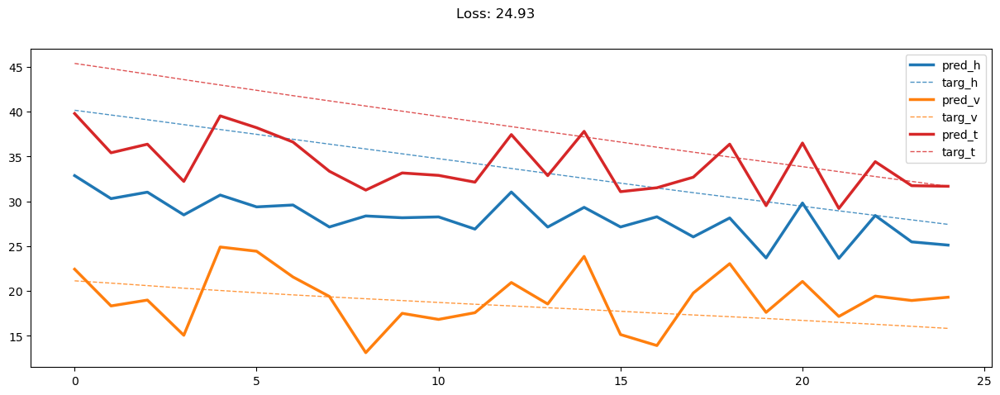

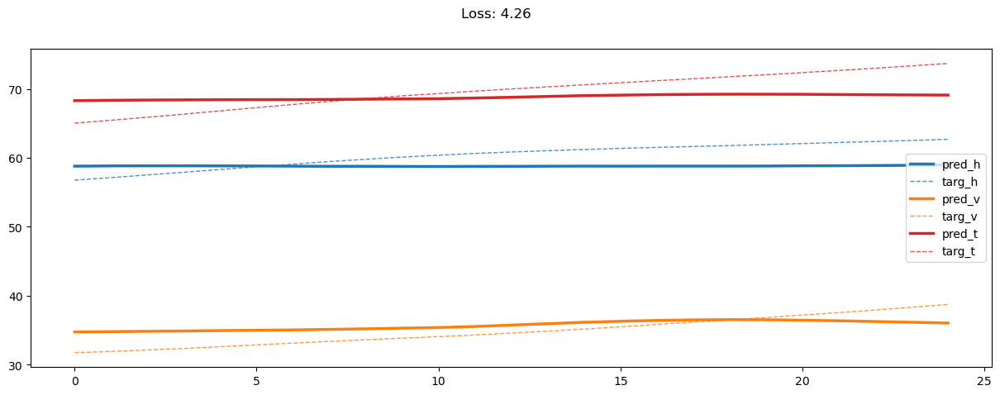

04000: train loss:  236.744, imu loss:  0.666, mag loss:  25.995, div loss:  50.865, slim:  51.547, tlim:  71.633
       valid loss:  387.498, imu loss:  0.479, mag loss:  91.632, div loss:  71.638, slim:  52.042, tlim:  70.731
04020: train loss:  235.847, imu loss:  0.667, mag loss:  25.491, div loss:  50.805, slim:  51.637, tlim:  71.716
       valid loss:  385.884, imu loss:  0.479, mag loss:  91.396, div loss:  71.069, slim:  51.755, tlim:  70.444
04040: train loss:  235.864, imu loss:  0.666, mag loss:  25.752, div loss:  50.452, slim:  51.541, tlim:  71.648
       valid loss:  389.641, imu loss:  0.479, mag loss:  92.781, div loss:  72.652, slim:  51.457, tlim:  70.146
04060: train loss:  234.833, imu loss:  0.666, mag loss:  25.609, div loss:  49.743, slim:  51.584, tlim:  71.608
       valid loss:  388.966, imu loss:  0.479, mag loss:  91.581, div loss:  72.870, slim:  52.211, tlim:  70.900
04080: train loss:  232.538, imu loss:  0.665, mag loss:  24.884, div loss:  48.701, sli

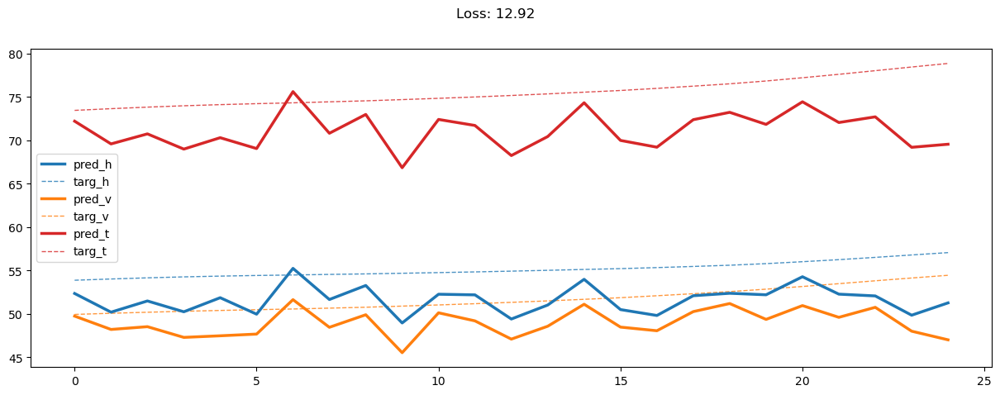

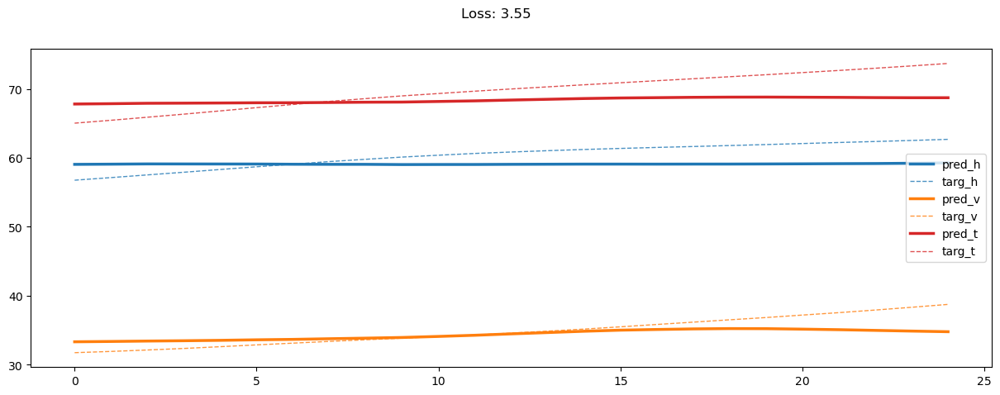

04200: train loss:  231.527, imu loss:  0.667, mag loss:  24.633, div loss:  48.318, slim:  51.629, tlim:  71.641
       valid loss:  389.482, imu loss:  0.478, mag loss:  91.749, div loss:  73.721, slim:  51.876, tlim:  70.565
04220: train loss:  229.668, imu loss:  0.665, mag loss:  24.270, div loss:  47.135, slim:  51.633, tlim:  71.675
       valid loss:  387.457, imu loss:  0.479, mag loss:  91.379, div loss:  72.178, slim:  52.004, tlim:  70.693
04240: train loss:  229.768, imu loss:  0.667, mag loss:  24.185, div loss:  47.494, slim:  51.560, tlim:  71.638
       valid loss:  387.397, imu loss:  0.479, mag loss:  91.349, div loss:  72.470, slim:  51.858, tlim:  70.547
04260: train loss:  229.911, imu loss:  0.668, mag loss:  24.176, div loss:  47.566, slim:  51.702, tlim:  71.651
       valid loss:  392.325, imu loss:  0.478, mag loss:  92.928, div loss:  73.474, slim:  52.241, tlim:  70.930
04280: train loss:  228.014, imu loss:  0.665, mag loss:  23.751, div loss:  46.515, sli

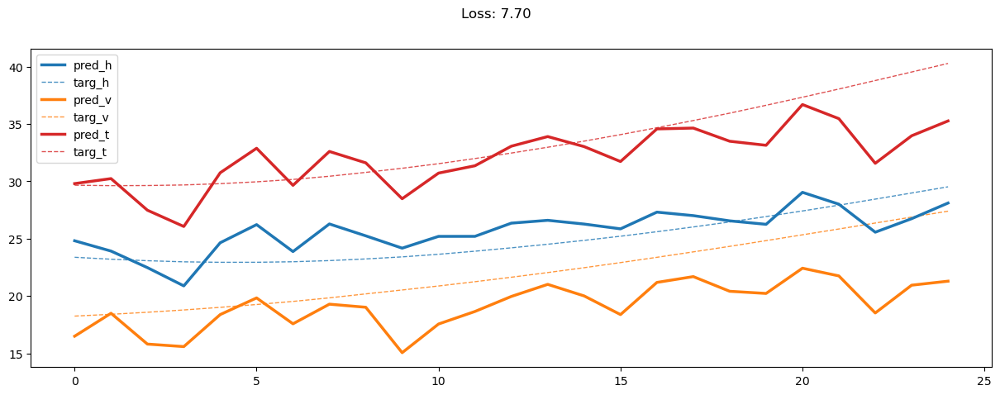

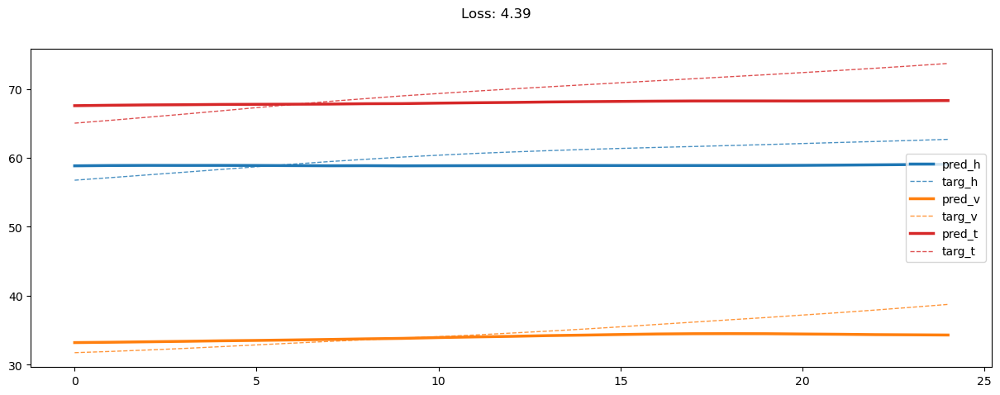

04400: train loss:  226.951, imu loss:  0.666, mag loss:  23.415, div loss:  46.255, slim:  51.646, tlim:  71.586
       valid loss:  389.544, imu loss:  0.478, mag loss:  91.598, div loss:  73.362, slim:  52.237, tlim:  70.926
04420: train loss:  223.850, imu loss:  0.664, mag loss:  22.734, div loss:  44.260, slim:  51.748, tlim:  71.722
       valid loss:  391.895, imu loss:  0.479, mag loss:  92.923, div loss:  74.031, slim:  51.753, tlim:  70.442
04440: train loss:  225.125, imu loss:  0.667, mag loss:  23.022, div loss:  45.048, slim:  51.649, tlim:  71.694
       valid loss:  388.408, imu loss:  0.478, mag loss:  91.874, div loss:  72.786, slim:  51.681, tlim:  70.370
04460: train loss:  223.768, imu loss:  0.665, mag loss:  22.696, div loss:  44.435, slim:  51.645, tlim:  71.635
       valid loss:  390.386, imu loss:  0.478, mag loss:  92.196, div loss:  73.593, slim:  51.944, tlim:  70.633
04480: train loss:  223.521, imu loss:  0.668, mag loss:  22.535, div loss:  44.302, sli

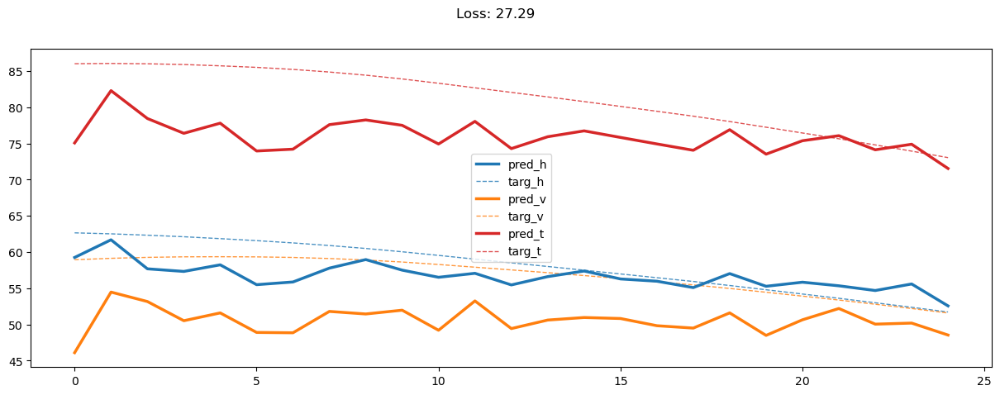

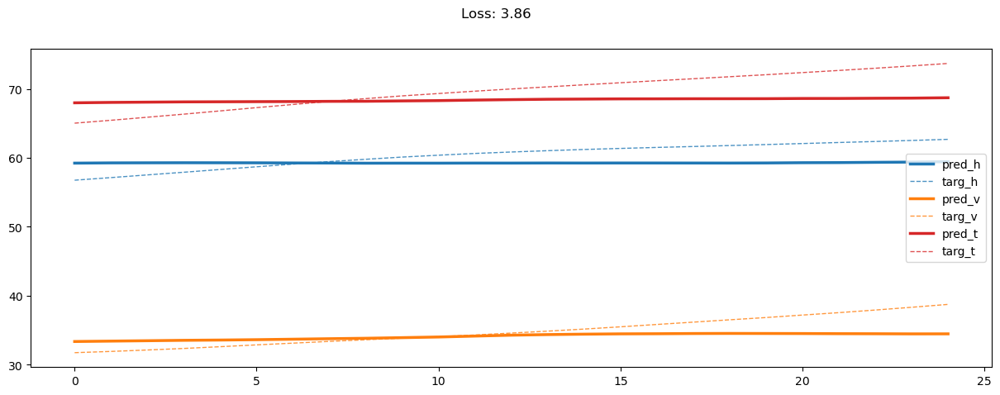

04600: train loss:  221.786, imu loss:  0.665, mag loss:  22.158, div loss:  43.338, slim:  51.744, tlim:  71.730
       valid loss:  392.859, imu loss:  0.478, mag loss:  92.871, div loss:  74.120, slim:  52.242, tlim:  70.932
04620: train loss:  220.901, imu loss:  0.666, mag loss:  21.956, div loss:  42.939, slim:  51.646, tlim:  71.708
       valid loss:  391.441, imu loss:  0.478, mag loss:  92.629, div loss:  73.440, slim:  52.115, tlim:  70.804
04640: train loss:  220.465, imu loss:  0.666, mag loss:  21.813, div loss:  42.757, slim:  51.756, tlim:  71.692
       valid loss:  391.272, imu loss:  0.478, mag loss:  92.559, div loss:  73.418, slim:  52.112, tlim:  70.801
04660: train loss:  218.923, imu loss:  0.665, mag loss:  21.528, div loss:  41.806, slim:  51.648, tlim:  71.715
       valid loss:  394.757, imu loss:  0.478, mag loss:  93.767, div loss:  74.075, slim:  52.317, tlim:  71.007
04680: train loss:  218.722, imu loss:  0.666, mag loss:  21.402, div loss:  41.881, sli

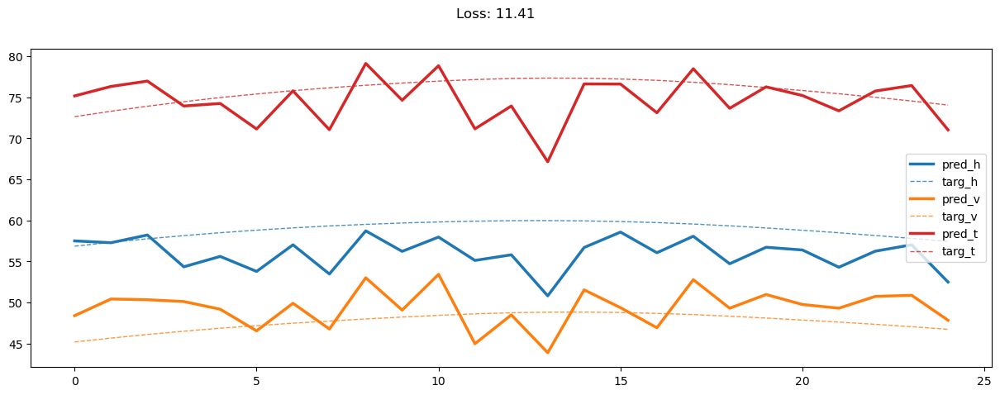

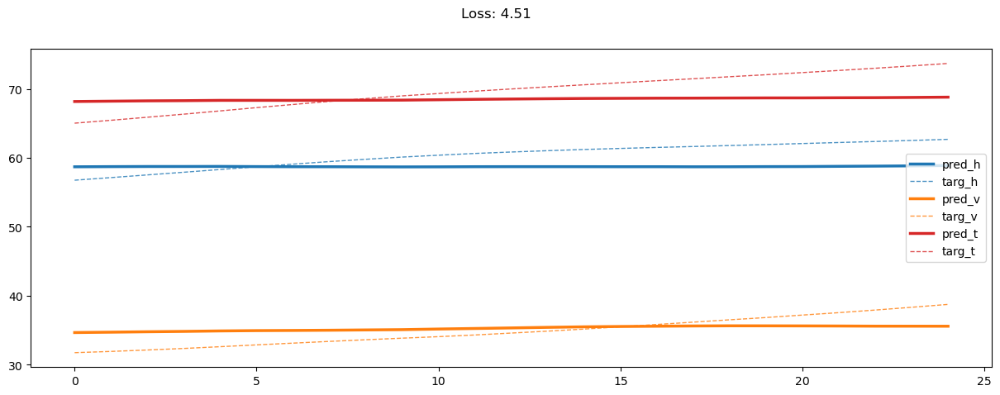

04800: train loss:  216.330, imu loss:  0.667, mag loss:  20.769, div loss:  40.616, slim:  51.691, tlim:  71.777
       valid loss:  386.677, imu loss:  0.478, mag loss:  90.945, div loss:  72.557, slim:  51.859, tlim:  70.548
04820: train loss:  216.326, imu loss:  0.665, mag loss:  20.862, div loss:  40.648, slim:  51.577, tlim:  71.668
       valid loss:  391.295, imu loss:  0.478, mag loss:  91.525, div loss:  74.883, slim:  52.425, tlim:  71.114
04840: train loss:  214.107, imu loss:  0.666, mag loss:  20.310, div loss:  39.296, slim:  51.777, tlim:  71.758
       valid loss:  388.629, imu loss:  0.478, mag loss:  91.788, div loss:  71.880, slim:  52.330, tlim:  71.020
04860: train loss:  215.775, imu loss:  0.666, mag loss:  20.697, div loss:  40.251, slim:  51.715, tlim:  71.738
       valid loss:  387.935, imu loss:  0.478, mag loss:  91.644, div loss:  72.546, slim:  51.794, tlim:  70.484
04880: train loss:  214.221, imu loss:  0.665, mag loss:  20.216, div loss:  39.657, sli

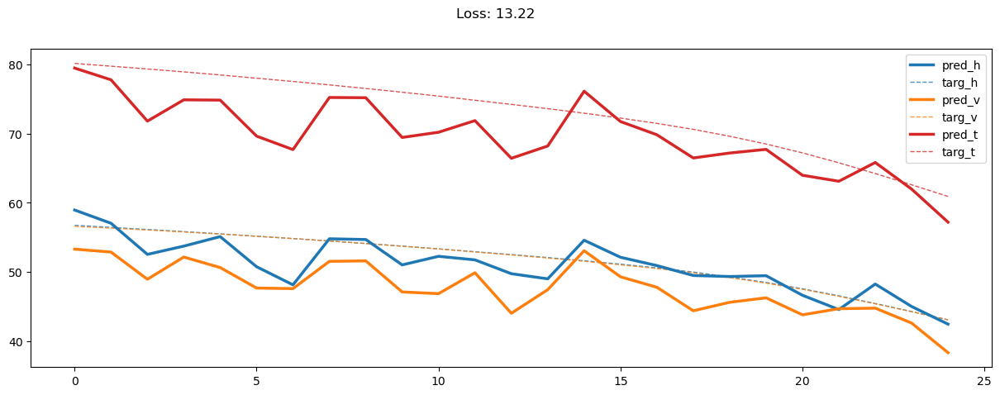

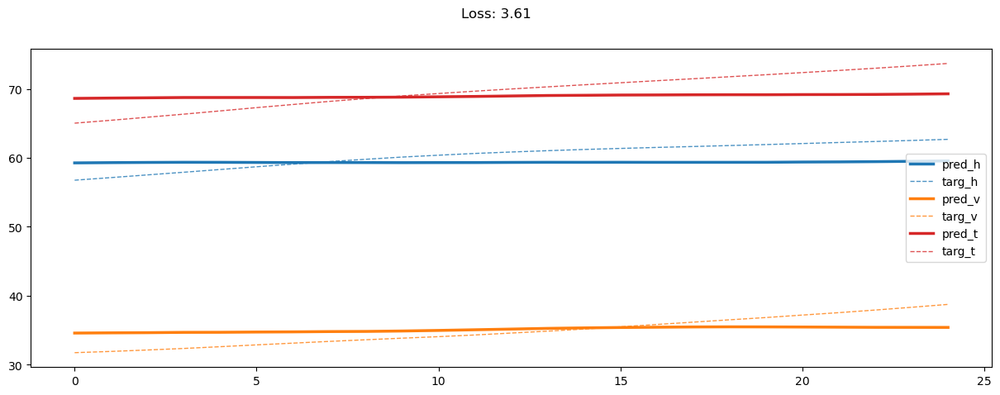

05000: train loss:  213.131, imu loss:  0.667, mag loss:  20.057, div loss:  39.032, slim:  51.642, tlim:  71.665
       valid loss:  392.095, imu loss:  0.478, mag loss:  92.644, div loss:  74.046, slim:  52.125, tlim:  70.814
05020: train loss:  213.331, imu loss:  0.666, mag loss:  20.010, div loss:  39.090, slim:  51.762, tlim:  71.781
       valid loss:  390.760, imu loss:  0.478, mag loss:  91.738, div loss:  73.335, slim:  52.719, tlim:  71.408
05040: train loss:  211.020, imu loss:  0.664, mag loss:  19.459, div loss:  37.947, slim:  51.711, tlim:  71.757
       valid loss:  392.004, imu loss:  0.478, mag loss:  92.849, div loss:  73.843, slim:  51.975, tlim:  70.665
05060: train loss:  211.639, imu loss:  0.666, mag loss:  19.670, div loss:  38.180, slim:  51.710, tlim:  71.732
       valid loss:  392.404, imu loss:  0.478, mag loss:  92.674, div loss:  74.442, slim:  52.051, tlim:  70.741
05080: train loss:  211.136, imu loss:  0.666, mag loss:  19.487, div loss:  38.069, sli

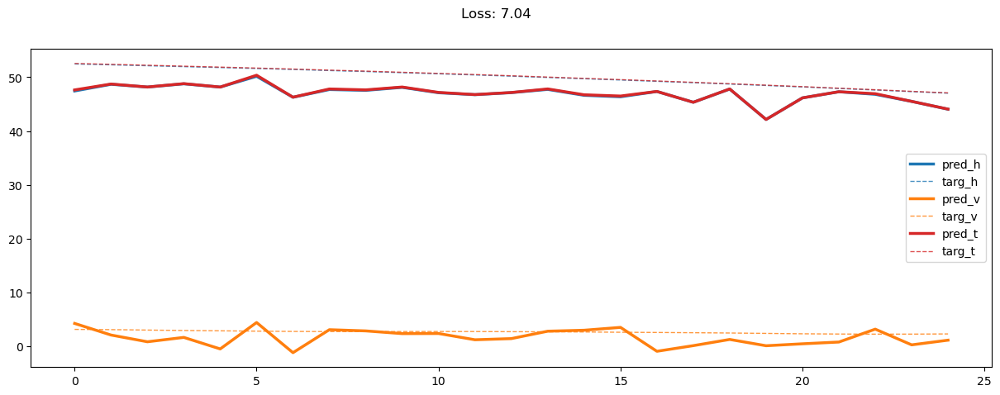

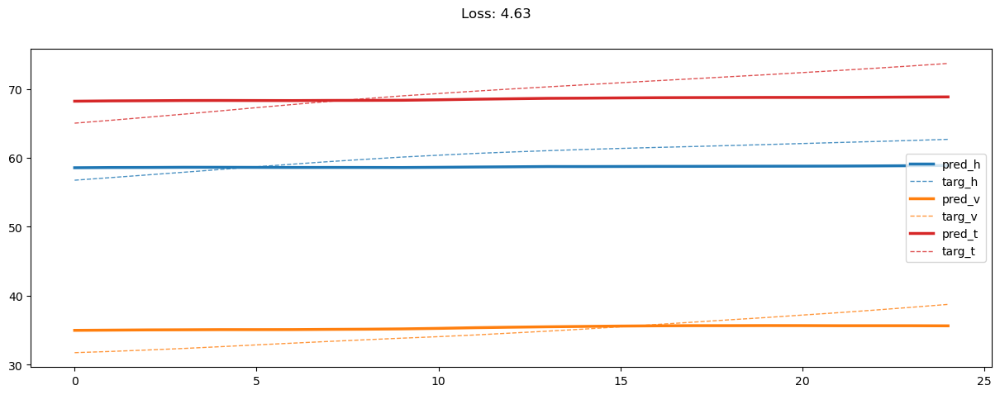

05200: train loss:  208.891, imu loss:  0.665, mag loss:  19.001, div loss:  36.882, slim:  51.606, tlim:  71.692
       valid loss:  391.392, imu loss:  0.478, mag loss:  92.408, div loss:  74.120, slim:  51.972, tlim:  70.662
05220: train loss:  208.207, imu loss:  0.666, mag loss:  18.783, div loss:  36.349, slim:  51.752, tlim:  71.833
       valid loss:  393.737, imu loss:  0.478, mag loss:  92.426, div loss:  76.027, slim:  52.173, tlim:  70.862
05240: train loss:  209.340, imu loss:  0.666, mag loss:  19.035, div loss:  37.170, slim:  51.699, tlim:  71.724
       valid loss:  390.499, imu loss:  0.478, mag loss:  92.297, div loss:  73.281, slim:  52.056, tlim:  70.745
05260: train loss:  207.279, imu loss:  0.665, mag loss:  18.581, div loss:  35.894, slim:  51.796, tlim:  71.774
       valid loss:  391.165, imu loss:  0.478, mag loss:  92.557, div loss:  73.435, slim:  52.052, tlim:  70.741
05280: train loss:  207.253, imu loss:  0.665, mag loss:  18.595, div loss:  36.148, sli

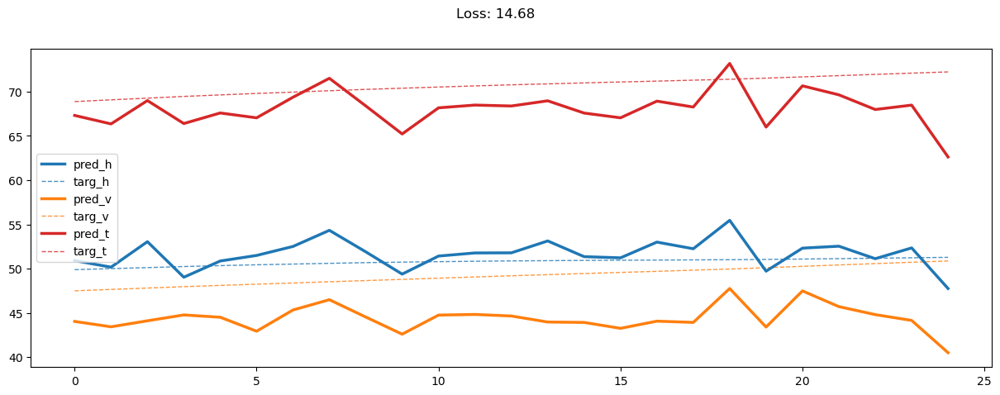

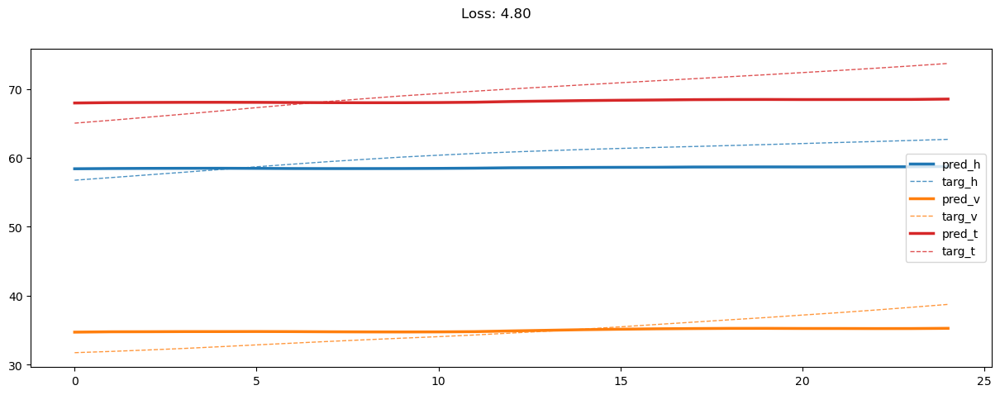

05400: train loss:  206.332, imu loss:  0.665, mag loss:  18.326, div loss:  35.502, slim:  51.731, tlim:  71.765
       valid loss:  389.284, imu loss:  0.478, mag loss:  91.908, div loss:  73.142, slim:  51.907, tlim:  70.596
05420: train loss:  204.890, imu loss:  0.666, mag loss:  17.908, div loss:  34.886, slim:  51.720, tlim:  71.775
       valid loss:  390.510, imu loss:  0.478, mag loss:  91.763, div loss:  73.479, slim:  52.497, tlim:  71.186
05440: train loss:  205.555, imu loss:  0.666, mag loss:  18.110, div loss:  35.150, slim:  51.748, tlim:  71.763
       valid loss:  391.689, imu loss:  0.478, mag loss:  92.893, div loss:  73.617, slim:  51.886, tlim:  70.576
05460: train loss:  205.740, imu loss:  0.665, mag loss:  18.152, div loss:  35.440, slim:  51.735, tlim:  71.642
       valid loss:  390.062, imu loss:  0.478, mag loss:  92.225, div loss:  72.459, slim:  52.321, tlim:  71.010
05480: train loss:  204.626, imu loss:  0.665, mag loss:  17.922, div loss:  34.673, sli

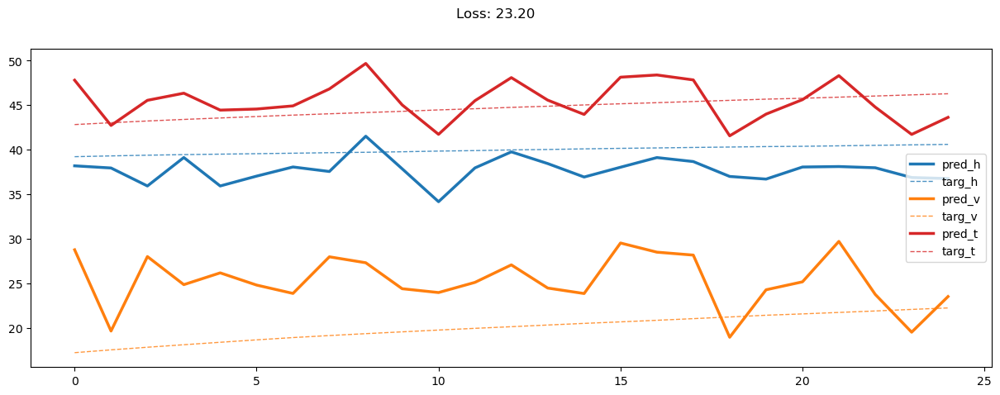

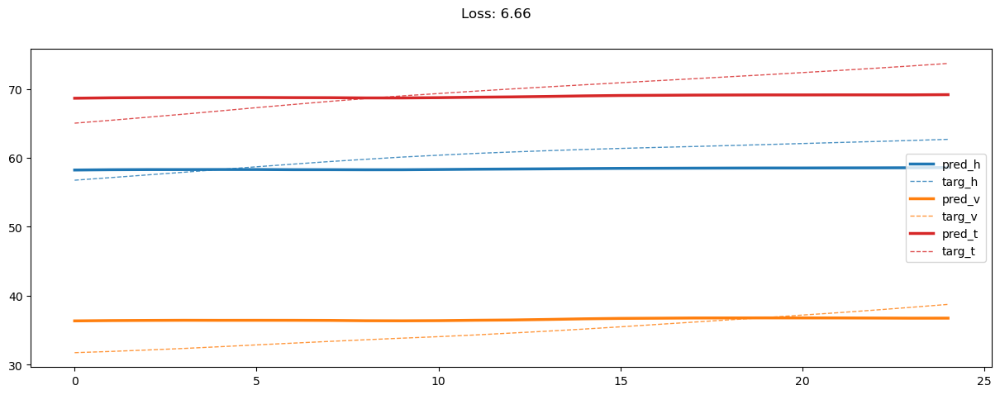

05600: train loss:  201.363, imu loss:  0.665, mag loss:  17.084, div loss:  33.201, slim:  51.644, tlim:  71.672
       valid loss:  391.322, imu loss:  0.478, mag loss:  92.596, div loss:  73.302, slim:  52.158, tlim:  70.847
05620: train loss:  203.120, imu loss:  0.665, mag loss:  17.404, div loss:  34.033, slim:  51.705, tlim:  71.840
       valid loss:  391.175, imu loss:  0.478, mag loss:  91.894, div loss:  74.208, slim:  52.333, tlim:  71.022
05640: train loss:  202.496, imu loss:  0.663, mag loss:  17.195, div loss:  33.948, slim:  51.800, tlim:  71.731
       valid loss:  391.181, imu loss:  0.478, mag loss:  91.379, div loss:  75.554, slim:  52.178, tlim:  70.868
05660: train loss:  201.232, imu loss:  0.664, mag loss:  17.041, div loss:  32.897, slim:  51.803, tlim:  71.791
       valid loss:  389.956, imu loss:  0.478, mag loss:  92.014, div loss:  72.698, slim:  52.359, tlim:  71.048
05680: train loss:  201.168, imu loss:  0.665, mag loss:  17.102, div loss:  32.826, sli

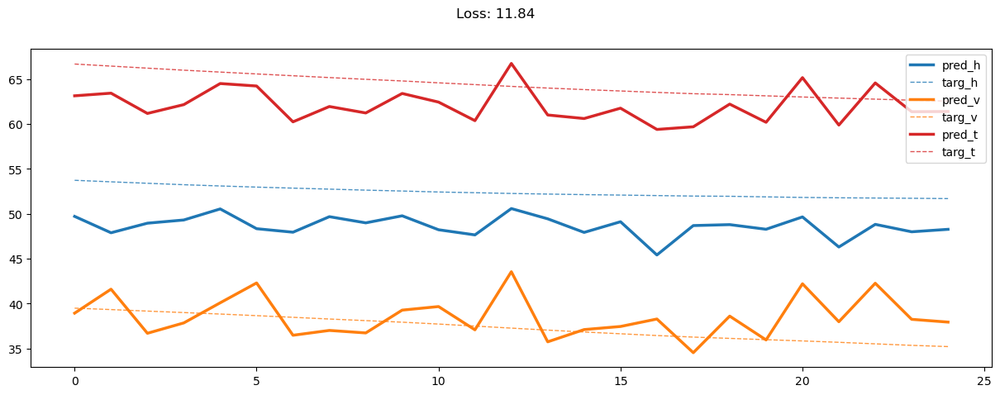

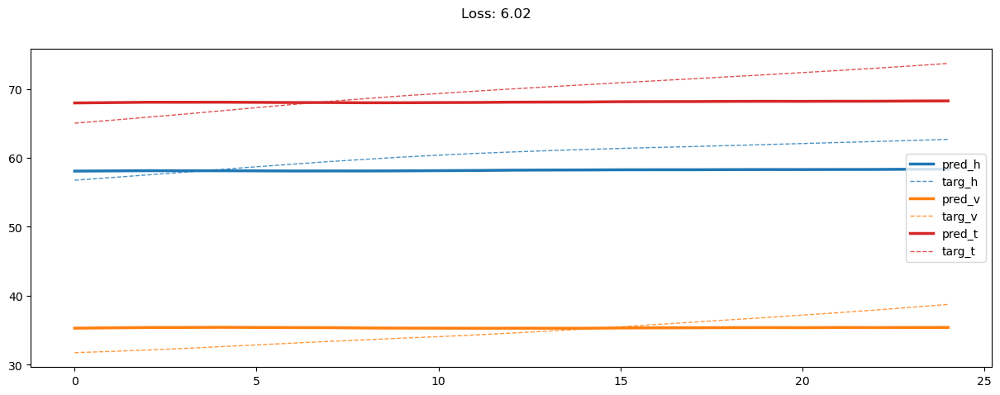

05800: train loss:  199.679, imu loss:  0.664, mag loss:  16.692, div loss:  32.128, slim:  51.648, tlim:  71.786
       valid loss:  388.136, imu loss:  0.478, mag loss:  91.498, div loss:  72.440, slim:  52.094, tlim:  70.783
05820: train loss:  199.867, imu loss:  0.667, mag loss:  16.776, div loss:  32.331, slim:  51.647, tlim:  71.662
       valid loss:  389.823, imu loss:  0.478, mag loss:  91.828, div loss:  73.697, slim:  51.979, tlim:  70.669
05840: train loss:  199.131, imu loss:  0.665, mag loss:  16.396, div loss:  32.154, slim:  51.742, tlim:  71.766
       valid loss:  388.719, imu loss:  0.478, mag loss:  91.443, div loss:  73.042, slim:  52.140, tlim:  70.829
05860: train loss:  199.781, imu loss:  0.664, mag loss:  16.657, div loss:  32.345, slim:  51.736, tlim:  71.727
       valid loss:  386.997, imu loss:  0.478, mag loss:  91.152, div loss:  72.107, slim:  52.037, tlim:  70.727
05880: train loss:  198.887, imu loss:  0.665, mag loss:  16.395, div loss:  31.889, sli

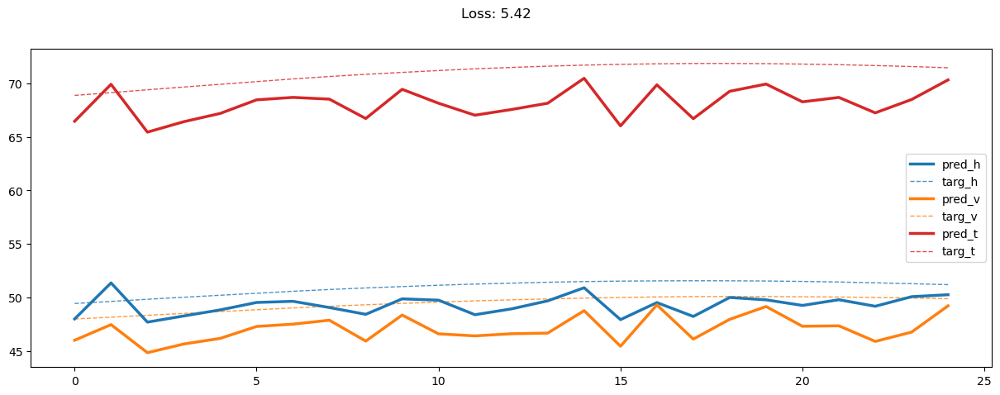

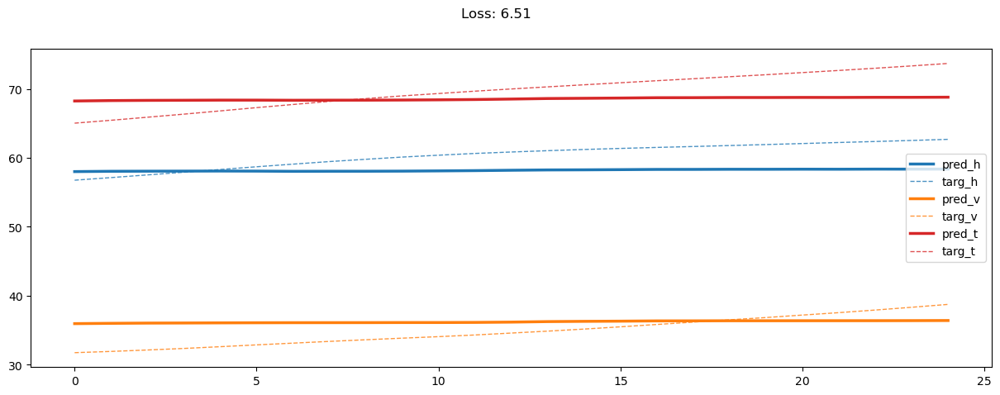

06000: train loss:  197.932, imu loss:  0.665, mag loss:  16.254, div loss:  31.333, slim:  51.679, tlim:  71.724
       valid loss:  392.818, imu loss:  0.477, mag loss:  92.661, div loss:  75.109, slim:  51.938, tlim:  70.627
06020: train loss:  197.646, imu loss:  0.665, mag loss:  16.137, div loss:  31.400, slim:  51.559, tlim:  71.685
       valid loss:  390.151, imu loss:  0.477, mag loss:  92.256, div loss:  73.467, slim:  51.831, tlim:  70.520
06040: train loss:  197.146, imu loss:  0.664, mag loss:  16.045, div loss:  30.915, slim:  51.784, tlim:  71.724
       valid loss:  388.633, imu loss:  0.477, mag loss:  91.462, div loss:  73.033, slim:  52.082, tlim:  70.771
06060: train loss:  197.376, imu loss:  0.665, mag loss:  16.093, div loss:  31.047, slim:  51.734, tlim:  71.741
       valid loss:  388.909, imu loss:  0.477, mag loss:  91.628, div loss:  72.853, slim:  52.145, tlim:  70.834
06080: train loss:  197.089, imu loss:  0.665, mag loss:  15.954, div loss:  31.011, sli

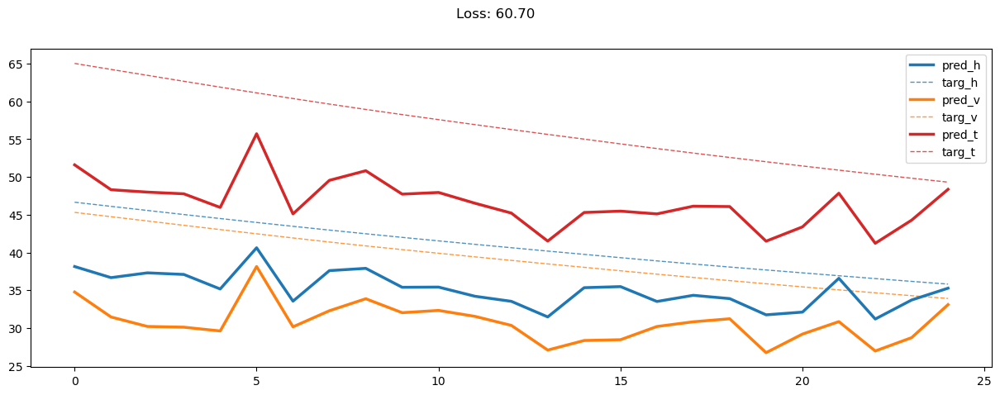

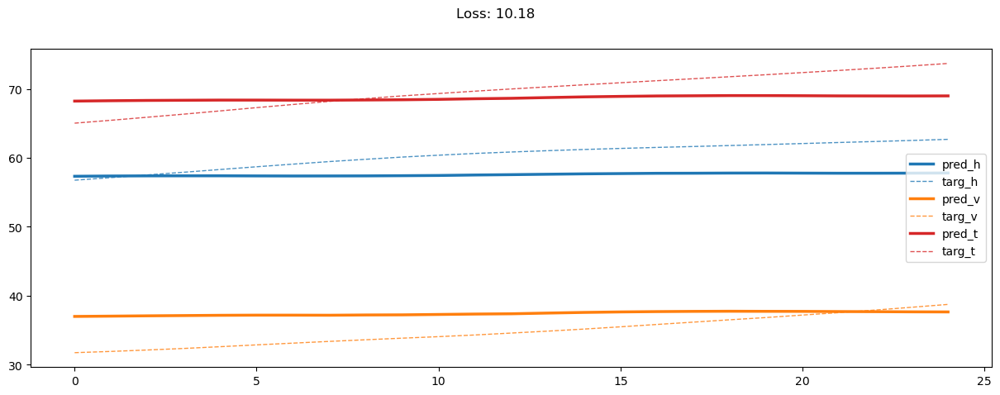

06200: train loss:  196.099, imu loss:  0.665, mag loss:  15.746, div loss:  30.444, slim:  51.757, tlim:  71.747
       valid loss:  390.107, imu loss:  0.477, mag loss:  92.093, div loss:  73.791, slim:  51.810, tlim:  70.499
06220: train loss:  194.804, imu loss:  0.665, mag loss:  15.342, div loss:  29.814, slim:  51.819, tlim:  71.821
       valid loss:  388.047, imu loss:  0.477, mag loss:  91.238, div loss:  72.488, slim:  52.286, tlim:  70.975
06240: train loss:  194.186, imu loss:  0.664, mag loss:  15.205, div loss:  29.481, slim:  51.847, tlim:  71.804
       valid loss:  389.954, imu loss:  0.477, mag loss:  91.916, div loss:  73.243, slim:  52.184, tlim:  70.873
06260: train loss:  194.348, imu loss:  0.664, mag loss:  15.346, div loss:  29.475, slim:  51.740, tlim:  71.765
       valid loss:  390.216, imu loss:  0.477, mag loss:  91.435, div loss:  74.487, slim:  52.174, tlim:  70.863
06280: train loss:  194.411, imu loss:  0.663, mag loss:  15.342, div loss:  29.597, sli

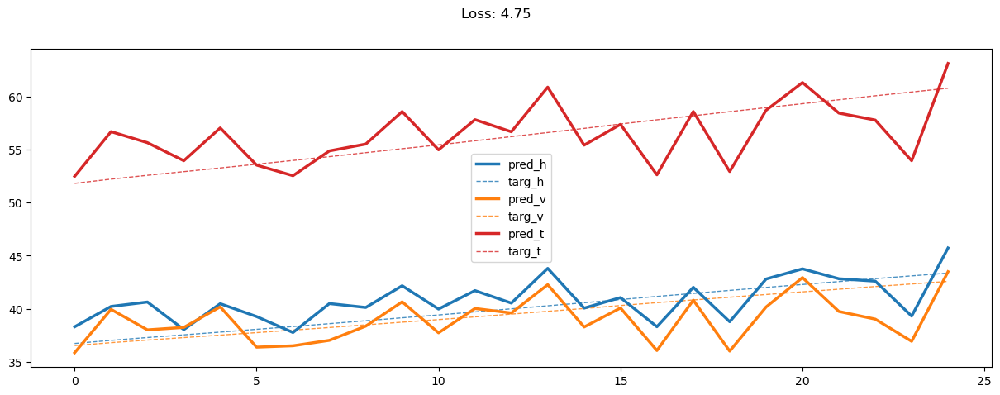

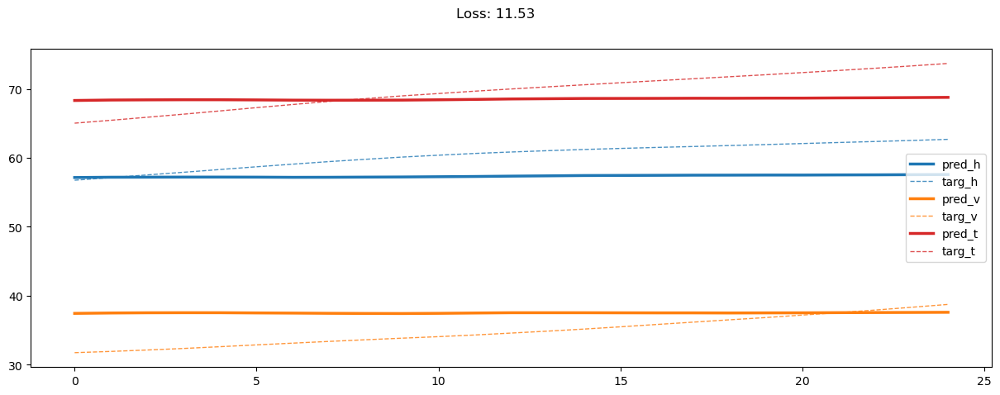

06400: train loss:  193.344, imu loss:  0.664, mag loss:  15.003, div loss:  29.183, slim:  51.717, tlim:  71.756
       valid loss:  391.595, imu loss:  0.477, mag loss:  92.454, div loss:  73.925, slim:  52.126, tlim:  70.815
06420: train loss:  192.689, imu loss:  0.666, mag loss:  14.907, div loss:  28.746, slim:  51.726, tlim:  71.734
       valid loss:  388.067, imu loss:  0.477, mag loss:  91.300, div loss:  72.750, slim:  52.104, tlim:  70.793
06440: train loss:  192.801, imu loss:  0.663, mag loss:  14.861, div loss:  28.843, slim:  51.737, tlim:  71.803
       valid loss:  388.334, imu loss:  0.477, mag loss:  90.992, div loss:  73.026, slim:  52.407, tlim:  71.096
06460: train loss:  192.490, imu loss:  0.663, mag loss:  14.782, div loss:  28.512, slim:  51.847, tlim:  71.885
       valid loss:  388.955, imu loss:  0.477, mag loss:  92.122, div loss:  72.176, slim:  52.012, tlim:  70.701
06480: train loss:  192.448, imu loss:  0.664, mag loss:  14.839, div loss:  28.659, sli

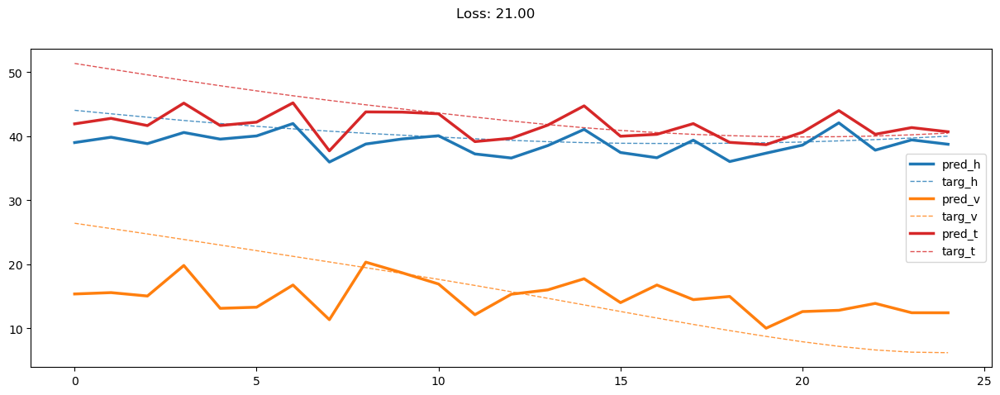

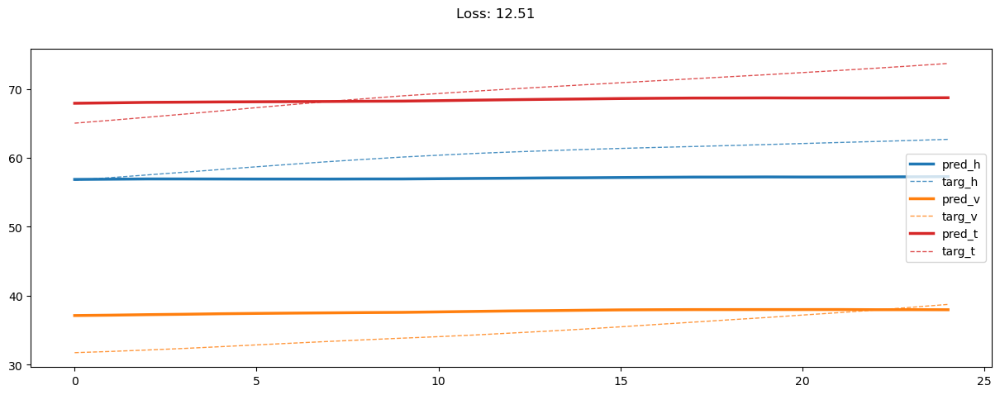

06600: train loss:  191.725, imu loss:  0.665, mag loss:  14.605, div loss:  28.271, slim:  51.823, tlim:  71.778
       valid loss:  388.562, imu loss:  0.477, mag loss:  91.176, div loss:  73.242, slim:  52.229, tlim:  70.918
06620: train loss:  190.481, imu loss:  0.663, mag loss:  14.369, div loss:  27.618, slim:  51.703, tlim:  71.740
       valid loss:  389.502, imu loss:  0.477, mag loss:  91.594, div loss:  73.104, slim:  52.350, tlim:  71.039
06640: train loss:  191.501, imu loss:  0.664, mag loss:  14.515, div loss:  28.159, slim:  51.827, tlim:  71.823
       valid loss:  388.658, imu loss:  0.477, mag loss:  91.356, div loss:  73.216, slim:  52.109, tlim:  70.799
06660: train loss:  190.291, imu loss:  0.662, mag loss:  14.333, div loss:  27.440, slim:  51.765, tlim:  71.760
       valid loss:  390.305, imu loss:  0.477, mag loss:  91.957, div loss:  73.357, slim:  52.261, tlim:  70.950
06680: train loss:  190.193, imu loss:  0.664, mag loss:  14.220, div loss:  27.423, sli

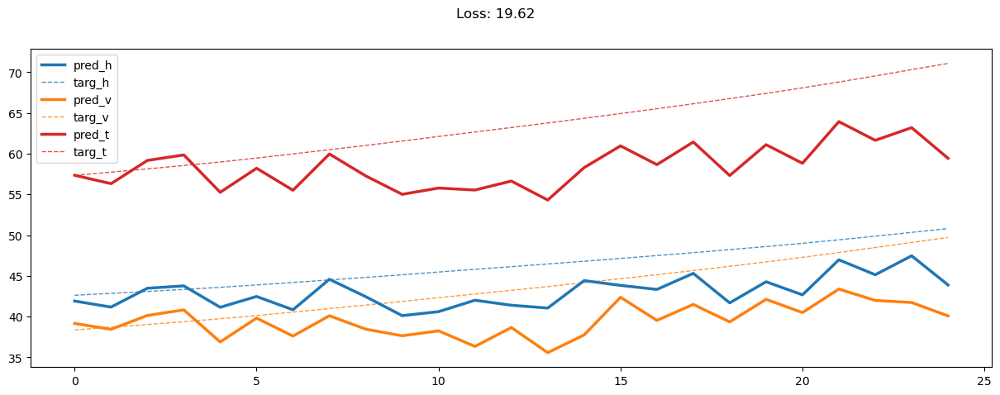

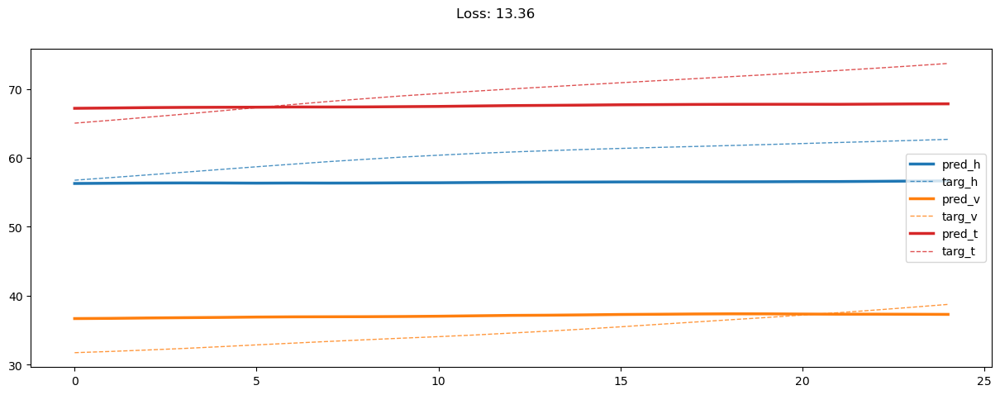

06800: train loss:  189.554, imu loss:  0.665, mag loss:  14.118, div loss:  27.149, slim:  51.771, tlim:  71.746
       valid loss:  388.581, imu loss:  0.477, mag loss:  91.383, div loss:  73.232, slim:  52.037, tlim:  70.726
06820: train loss:  188.559, imu loss:  0.663, mag loss:  13.904, div loss:  26.563, slim:  51.700, tlim:  71.783
       valid loss:  387.369, imu loss:  0.477, mag loss:  90.930, div loss:  73.043, slim:  51.978, tlim:  70.667
06840: train loss:  188.677, imu loss:  0.665, mag loss:  13.805, div loss:  26.859, slim:  51.726, tlim:  71.787
       valid loss:  386.879, imu loss:  0.477, mag loss:  91.082, div loss:  72.611, slim:  51.796, tlim:  70.485
06860: train loss:  189.264, imu loss:  0.663, mag loss:  13.992, div loss:  27.089, slim:  51.745, tlim:  71.771
       valid loss:  389.151, imu loss:  0.477, mag loss:  91.482, div loss:  72.926, slim:  52.375, tlim:  71.065
06880: train loss:  187.887, imu loss:  0.664, mag loss:  13.758, div loss:  26.242, sli

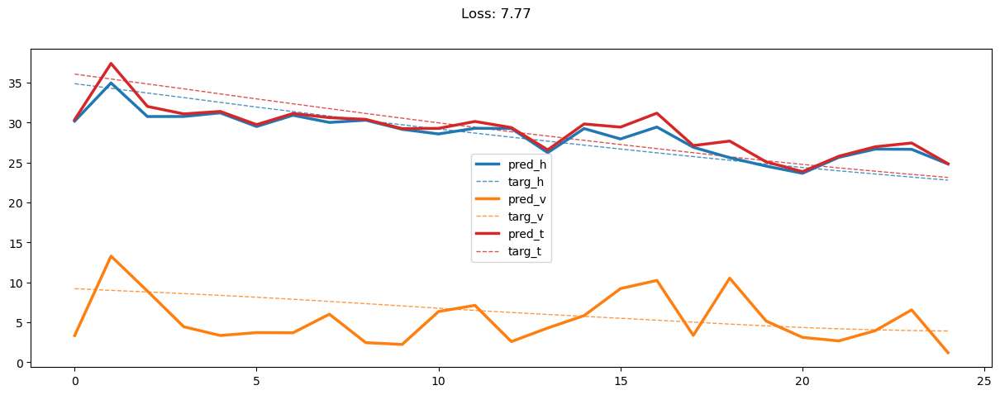

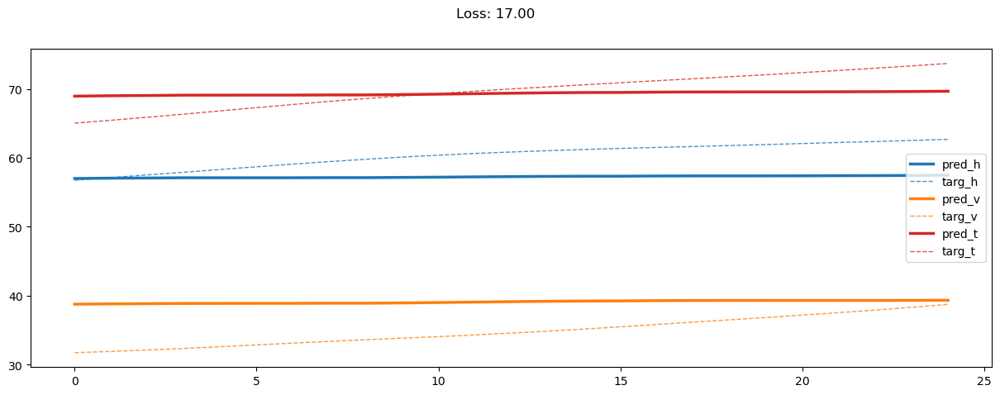

07000: train loss:  187.820, imu loss:  0.662, mag loss:  13.575, div loss:  26.334, slim:  51.797, tlim:  71.850
       valid loss:  386.687, imu loss:  0.477, mag loss:  90.646, div loss:  72.572, slim:  52.156, tlim:  70.845
07020: train loss:  187.334, imu loss:  0.664, mag loss:  13.530, div loss:  26.060, slim:  51.672, tlim:  71.809
       valid loss:  385.094, imu loss:  0.477, mag loss:  90.860, div loss:  70.530, slim:  52.167, tlim:  70.856
07040: train loss:  187.480, imu loss:  0.663, mag loss:  13.585, div loss:  26.051, slim:  51.751, tlim:  71.814
       valid loss:  388.038, imu loss:  0.477, mag loss:  91.628, div loss:  71.710, slim:  52.281, tlim:  70.970
07060: train loss:  186.731, imu loss:  0.663, mag loss:  13.396, div loss:  25.693, slim:  51.723, tlim:  71.815
       valid loss:  386.666, imu loss:  0.477, mag loss:  91.181, div loss:  71.928, slim:  51.933, tlim:  70.622
07080: train loss:  187.447, imu loss:  0.662, mag loss:  13.579, div loss:  26.057, sli

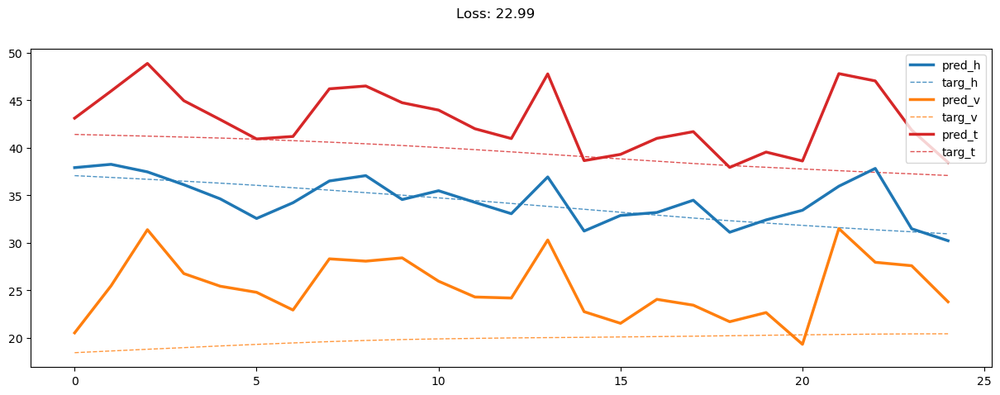

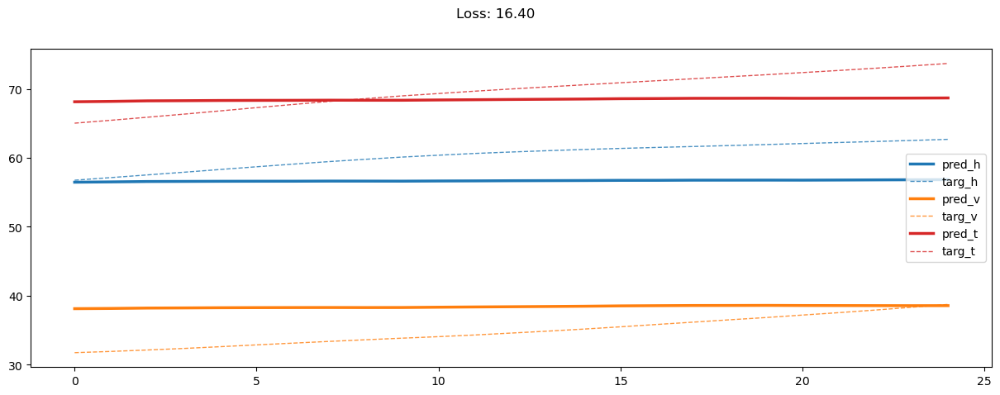

07200: train loss:  185.565, imu loss:  0.664, mag loss:  13.107, div loss:  25.125, slim:  51.796, tlim:  71.776
       valid loss:  387.015, imu loss:  0.477, mag loss:  91.148, div loss:  72.050, slim:  52.079, tlim:  70.769
07220: train loss:  186.005, imu loss:  0.663, mag loss:  13.191, div loss:  25.452, slim:  51.681, tlim:  71.779
       valid loss:  387.995, imu loss:  0.477, mag loss:  91.175, div loss:  72.505, slim:  52.314, tlim:  71.003
07240: train loss:  185.187, imu loss:  0.665, mag loss:  12.958, div loss:  24.929, slim:  51.751, tlim:  71.868
       valid loss:  388.446, imu loss:  0.477, mag loss:  91.523, div loss:  72.530, slim:  52.180, tlim:  70.869
07260: train loss:  185.246, imu loss:  0.663, mag loss:  13.040, div loss:  24.940, slim:  51.765, tlim:  71.787
       valid loss:  390.653, imu loss:  0.477, mag loss:  91.953, div loss:  73.717, slim:  52.260, tlim:  70.949
07280: train loss:  184.947, imu loss:  0.662, mag loss:  12.953, div loss:  24.895, sli

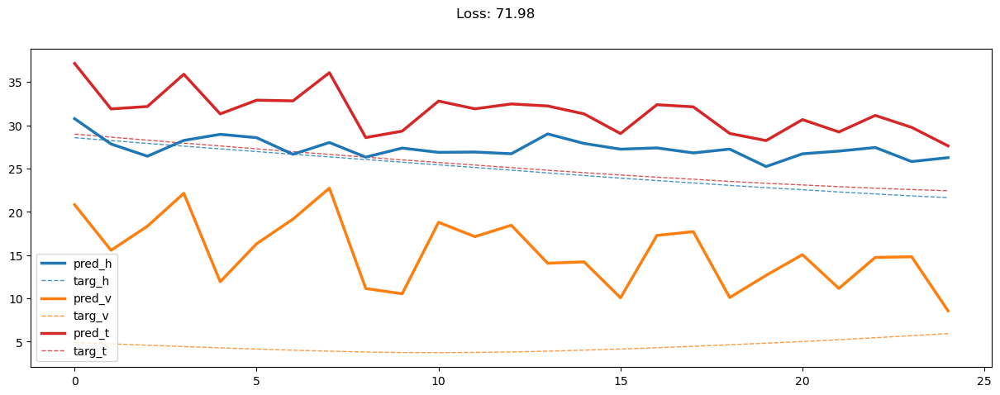

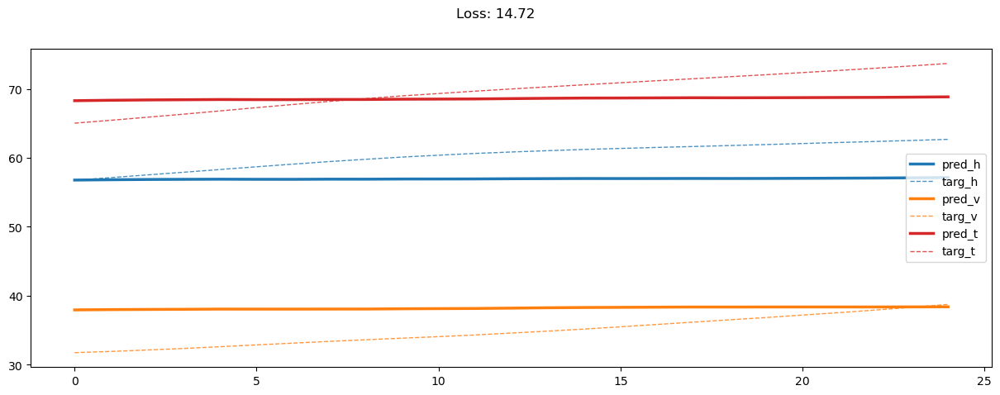

07400: train loss:  184.852, imu loss:  0.663, mag loss:  12.900, div loss:  24.819, slim:  51.770, tlim:  71.789
       valid loss:  391.618, imu loss:  0.476, mag loss:  92.326, div loss:  74.139, slim:  52.158, tlim:  70.848
07420: train loss:  184.706, imu loss:  0.663, mag loss:  12.863, div loss:  24.701, slim:  51.750, tlim:  71.828
       valid loss:  387.827, imu loss:  0.476, mag loss:  91.448, div loss:  72.388, slim:  52.017, tlim:  70.706
07440: train loss:  184.486, imu loss:  0.663, mag loss:  12.766, div loss:  24.655, slim:  51.824, tlim:  71.816
       valid loss:  388.612, imu loss:  0.476, mag loss:  91.402, div loss:  73.139, slim:  52.079, tlim:  70.769
07460: train loss:  184.098, imu loss:  0.663, mag loss:  12.685, div loss:  24.448, slim:  51.829, tlim:  71.802
       valid loss:  389.977, imu loss:  0.476, mag loss:  91.645, div loss:  73.183, slim:  52.496, tlim:  71.185
07480: train loss:  183.814, imu loss:  0.663, mag loss:  12.626, div loss:  24.307, sli

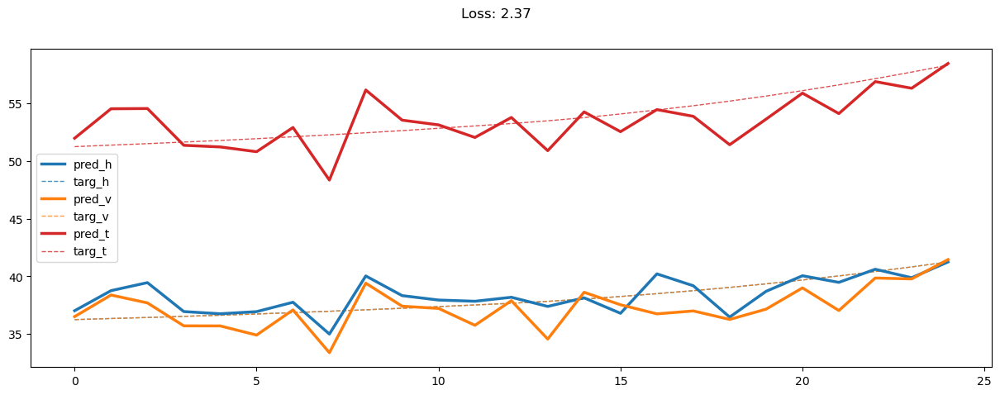

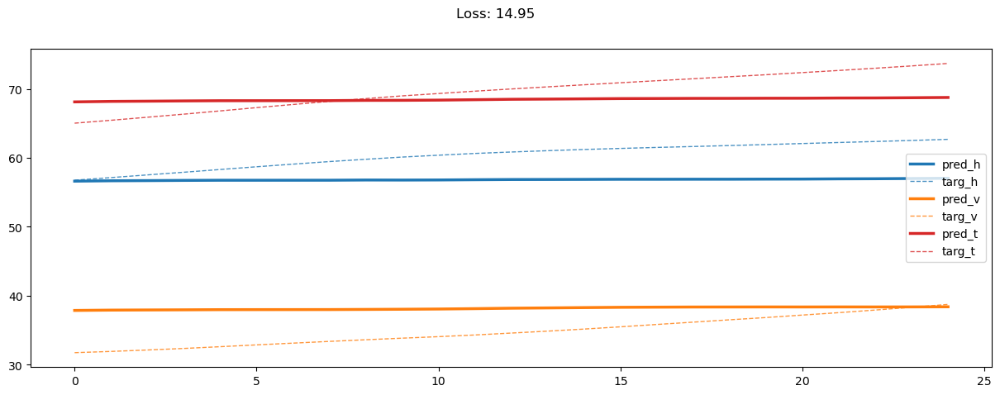

07600: train loss:  182.571, imu loss:  0.662, mag loss:  12.370, div loss:  23.681, slim:  51.725, tlim:  71.750
       valid loss:  386.285, imu loss:  0.476, mag loss:  90.996, div loss:  71.499, slim:  52.142, tlim:  70.831
07620: train loss:  182.912, imu loss:  0.663, mag loss:  12.403, div loss:  23.934, slim:  51.774, tlim:  71.747
       valid loss:  389.196, imu loss:  0.476, mag loss:  91.844, div loss:  73.030, slim:  51.984, tlim:  70.673
07640: train loss:  182.451, imu loss:  0.661, mag loss:  12.349, div loss:  23.512, slim:  51.831, tlim:  71.776
       valid loss:  386.576, imu loss:  0.476, mag loss:  91.174, div loss:  71.149, slim:  52.284, tlim:  70.974
07660: train loss:  181.905, imu loss:  0.663, mag loss:  12.164, div loss:  23.325, slim:  51.793, tlim:  71.796
       valid loss:  387.054, imu loss:  0.476, mag loss:  90.955, div loss:  72.200, slim:  52.216, tlim:  70.906
07680: train loss:  182.334, imu loss:  0.661, mag loss:  12.361, div loss:  23.514, sli

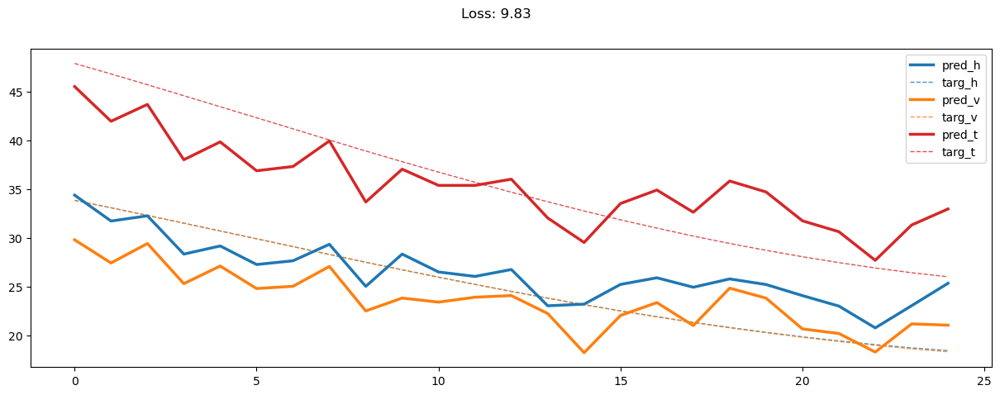

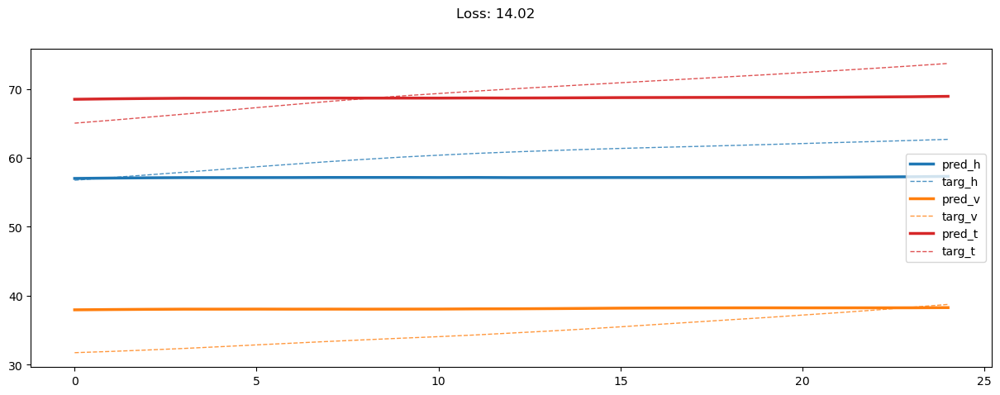

07800: train loss:  181.440, imu loss:  0.662, mag loss:  12.066, div loss:  23.127, slim:  51.803, tlim:  71.745
       valid loss:  385.199, imu loss:  0.476, mag loss:  91.102, div loss:  69.918, slim:  52.284, tlim:  70.973
07820: train loss:  181.271, imu loss:  0.663, mag loss:  11.995, div loss:  23.037, slim:  51.825, tlim:  71.780
       valid loss:  388.418, imu loss:  0.476, mag loss:  91.418, div loss:  72.771, slim:  52.151, tlim:  70.840
07840: train loss:  181.311, imu loss:  0.663, mag loss:  11.981, div loss:  23.036, slim:  51.796, tlim:  71.834
       valid loss:  386.574, imu loss:  0.476, mag loss:  91.006, div loss:  71.961, slim:  52.046, tlim:  70.735
07860: train loss:  181.504, imu loss:  0.664, mag loss:  12.040, div loss:  23.135, slim:  51.805, tlim:  71.815
       valid loss:  388.013, imu loss:  0.476, mag loss:  91.358, div loss:  71.996, slim:  52.395, tlim:  71.085
07880: train loss:  180.874, imu loss:  0.662, mag loss:  11.819, div loss:  22.772, sli

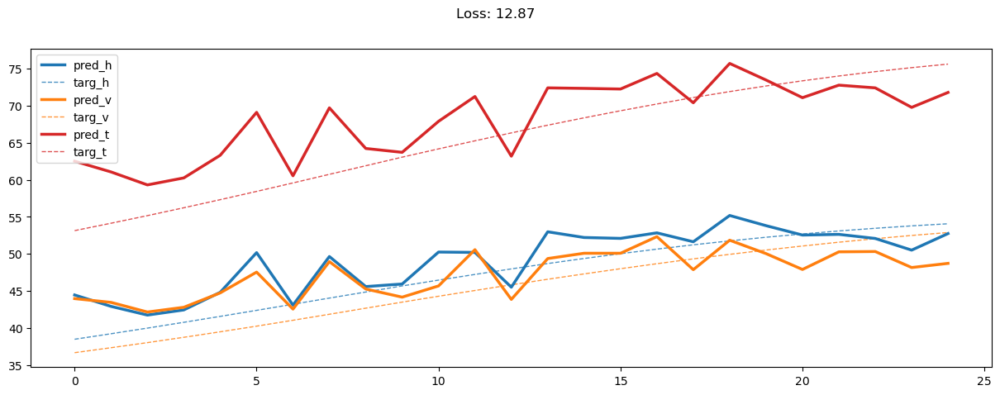

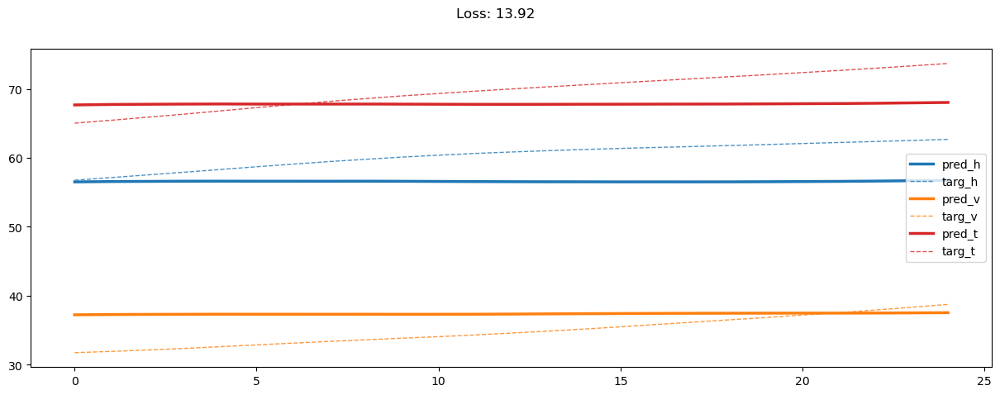

08000: train loss:  180.274, imu loss:  0.663, mag loss:  11.807, div loss:  22.552, slim:  51.703, tlim:  71.729
       valid loss:  387.599, imu loss:  0.476, mag loss:  90.911, div loss:  72.728, slim:  52.269, tlim:  70.958
08020: train loss:  179.981, imu loss:  0.662, mag loss:  11.706, div loss:  22.425, slim:  51.683, tlim:  71.761
       valid loss:  389.962, imu loss:  0.476, mag loss:  91.775, div loss:  73.170, slim:  52.366, tlim:  71.055
08040: train loss:  179.884, imu loss:  0.663, mag loss:  11.638, div loss:  22.342, slim:  51.826, tlim:  71.793
       valid loss:  387.125, imu loss:  0.476, mag loss:  91.170, div loss:  72.356, slim:  51.960, tlim:  70.649
08060: train loss:  179.222, imu loss:  0.662, mag loss:  11.490, div loss:  21.961, slim:  51.727, tlim:  71.837
       valid loss:  388.261, imu loss:  0.476, mag loss:  91.457, div loss:  71.822, slim:  52.508, tlim:  71.197
08080: train loss:  179.213, imu loss:  0.661, mag loss:  11.492, div loss:  22.013, sli

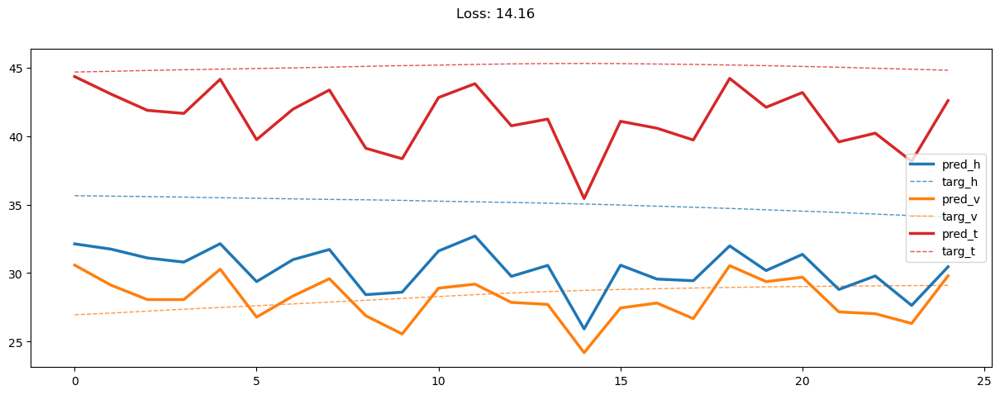

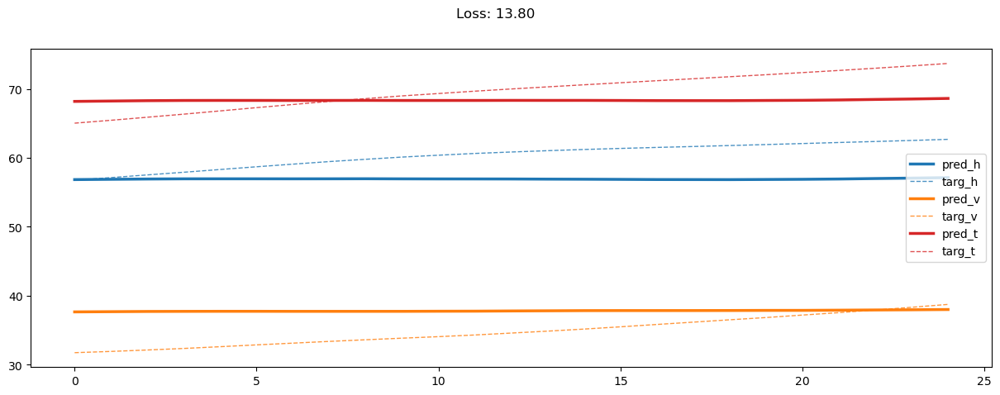

08200: train loss:  179.062, imu loss:  0.660, mag loss:  11.480, div loss:  21.923, slim:  51.762, tlim:  71.758
       valid loss:  383.185, imu loss:  0.476, mag loss:  90.398, div loss:  69.883, slim:  51.998, tlim:  70.687
08220: train loss:  179.180, imu loss:  0.663, mag loss:  11.427, div loss:  21.986, slim:  51.841, tlim:  71.838
       valid loss:  387.628, imu loss:  0.476, mag loss:  91.970, div loss:  70.970, slim:  52.105, tlim:  70.794
08240: train loss:  178.532, imu loss:  0.661, mag loss:  11.404, div loss:  21.626, slim:  51.734, tlim:  71.713
       valid loss:  385.290, imu loss:  0.476, mag loss:  90.373, div loss:  71.536, slim:  52.249, tlim:  70.938
08260: train loss:  179.293, imu loss:  0.664, mag loss:  11.476, div loss:  22.000, slim:  51.807, tlim:  71.848
       valid loss:  389.979, imu loss:  0.476, mag loss:  92.123, div loss:  73.011, slim:  52.106, tlim:  70.795
08280: train loss:  178.115, imu loss:  0.662, mag loss:  11.235, div loss:  21.398, sli

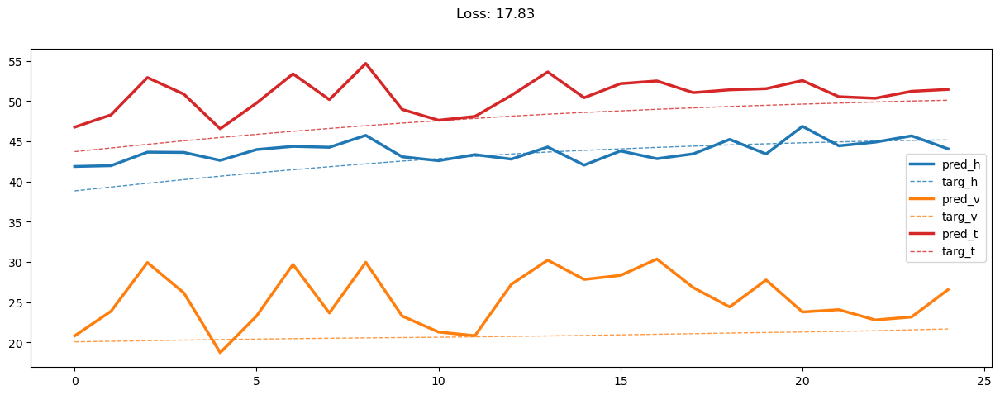

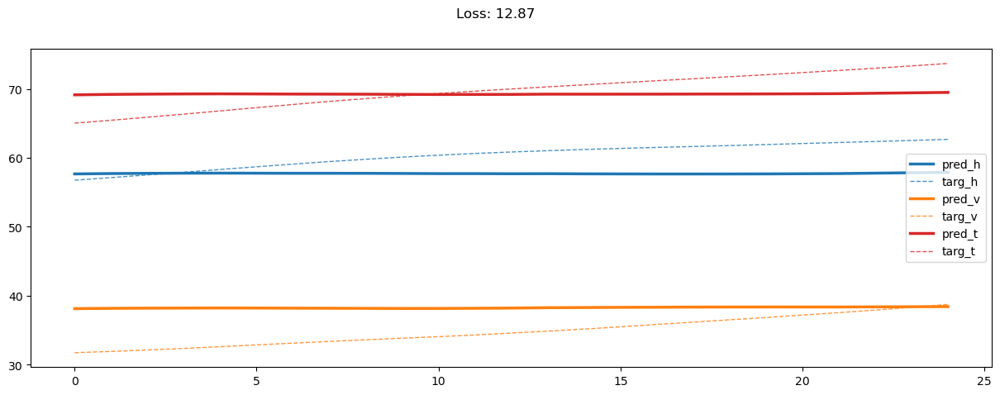

08400: train loss:  178.083, imu loss:  0.663, mag loss:  11.195, div loss:  21.408, slim:  51.834, tlim:  71.804
       valid loss:  385.712, imu loss:  0.476, mag loss:  90.324, div loss:  71.052, slim:  52.752, tlim:  71.441
08420: train loss:  177.329, imu loss:  0.662, mag loss:  11.012, div loss:  21.074, slim:  51.801, tlim:  71.778
       valid loss:  387.968, imu loss:  0.476, mag loss:  91.509, div loss:  71.808, slim:  52.316, tlim:  71.005
08440: train loss:  177.210, imu loss:  0.663, mag loss:  10.994, div loss:  20.977, slim:  51.777, tlim:  71.796
       valid loss:  386.905, imu loss:  0.476, mag loss:  90.814, div loss:  72.225, slim:  52.271, tlim:  70.960
08460: train loss:  177.683, imu loss:  0.662, mag loss:  11.158, div loss:  21.128, slim:  51.774, tlim:  71.794
       valid loss:  388.024, imu loss:  0.476, mag loss:  91.048, div loss:  72.510, slim:  52.454, tlim:  71.143
08480: train loss:  176.631, imu loss:  0.663, mag loss:  10.868, div loss:  20.649, sli

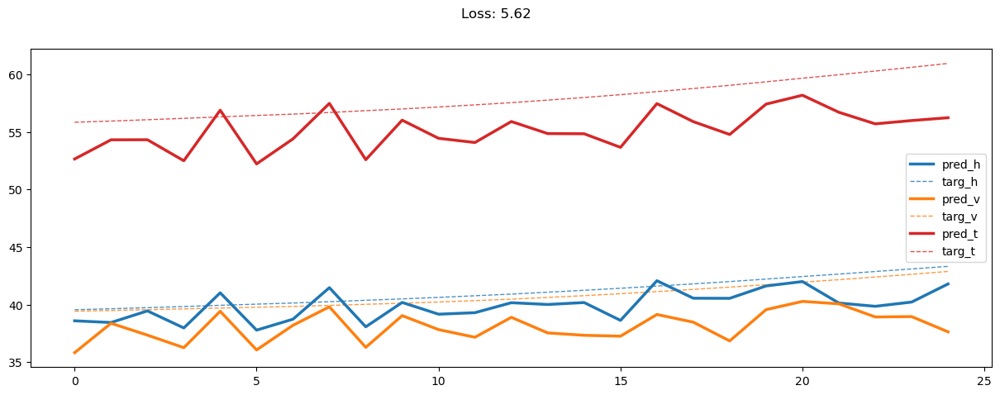

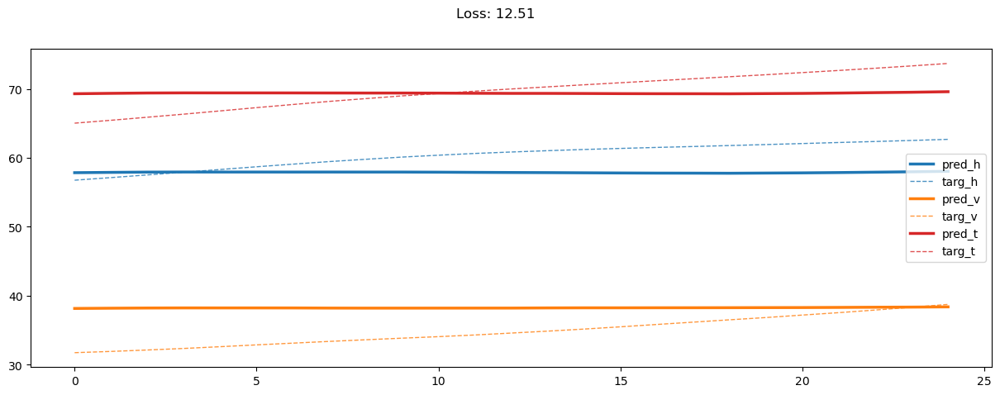

08600: train loss:  176.751, imu loss:  0.661, mag loss:  10.912, div loss:  20.692, slim:  51.845, tlim:  71.767
       valid loss:  387.240, imu loss:  0.476, mag loss:  90.791, div loss:  72.361, slim:  52.394, tlim:  71.083
08620: train loss:  176.341, imu loss:  0.662, mag loss:  10.817, div loss:  20.568, slim:  51.698, tlim:  71.752
       valid loss:  390.627, imu loss:  0.476, mag loss:  92.147, div loss:  73.096, slim:  52.364, tlim:  71.053
08640: train loss:  176.380, imu loss:  0.661, mag loss:  10.807, div loss:  20.619, slim:  51.710, tlim:  71.754
       valid loss:  387.441, imu loss:  0.476, mag loss:  91.548, div loss:  70.953, slim:  52.441, tlim:  71.130
08660: train loss:  176.493, imu loss:  0.661, mag loss:  10.796, div loss:  20.669, slim:  51.743, tlim:  71.800
       valid loss:  389.619, imu loss:  0.476, mag loss:  91.856, div loss:  72.640, slim:  52.379, tlim:  71.068
08680: train loss:  176.242, imu loss:  0.662, mag loss:  10.753, div loss:  20.525, sli

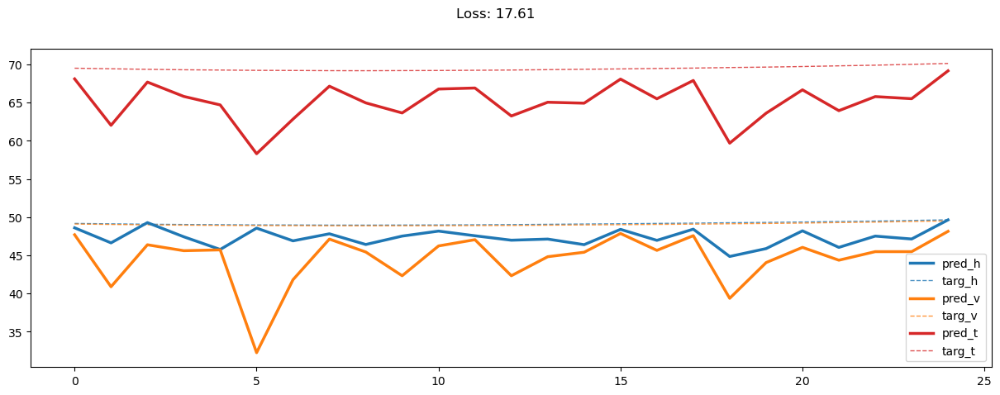

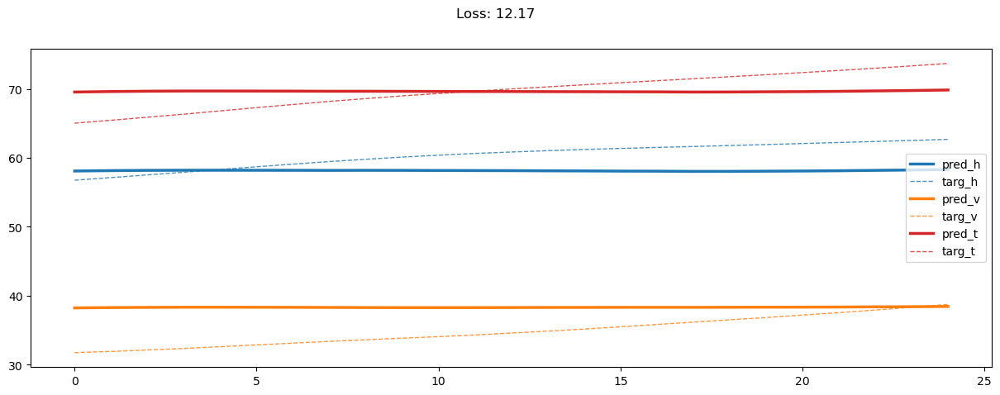

08800: train loss:  175.812, imu loss:  0.662, mag loss:  10.658, div loss:  20.259, slim:  51.771, tlim:  71.793
       valid loss:  388.181, imu loss:  0.476, mag loss:  91.500, div loss:  72.203, slim:  52.235, tlim:  70.924
08820: train loss:  176.162, imu loss:  0.662, mag loss:  10.697, div loss:  20.450, slim:  51.874, tlim:  71.813
       valid loss:  386.930, imu loss:  0.476, mag loss:  91.018, div loss:  71.949, slim:  52.217, tlim:  70.907
08840: train loss:  175.679, imu loss:  0.661, mag loss:  10.630, div loss:  20.227, slim:  51.793, tlim:  71.757
       valid loss:  386.524, imu loss:  0.476, mag loss:  90.710, div loss:  71.811, slim:  52.392, tlim:  71.081
08860: train loss:  175.216, imu loss:  0.662, mag loss:  10.462, div loss:  20.009, slim:  51.722, tlim:  71.840
       valid loss:  385.172, imu loss:  0.476, mag loss:  90.353, div loss:  71.328, slim:  52.315, tlim:  71.004
08880: train loss:  175.473, imu loss:  0.662, mag loss:  10.627, div loss:  20.227, sli

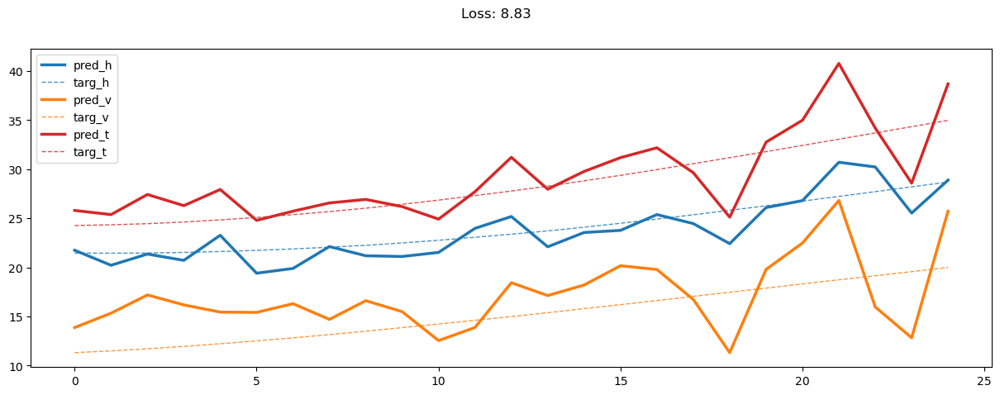

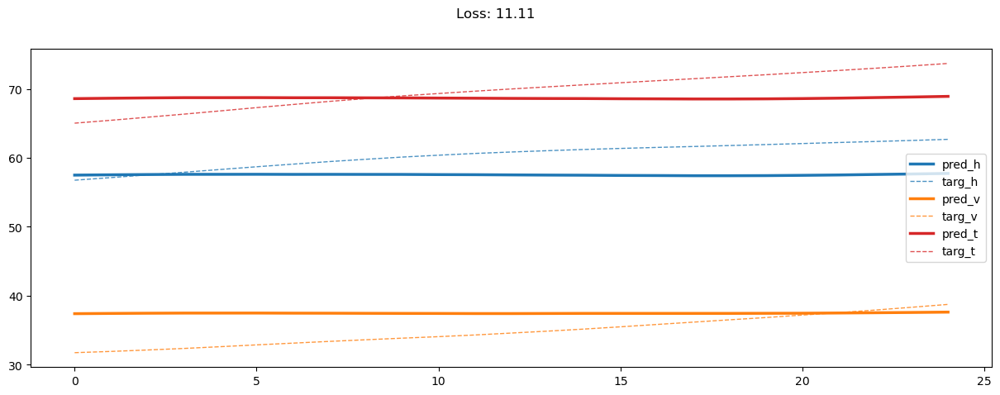

09000: train loss:  174.510, imu loss:  0.663, mag loss:  10.251, div loss:  19.602, slim:  51.915, tlim:  71.857
       valid loss:  384.987, imu loss:  0.476, mag loss:  90.350, div loss:  70.845, slim:  52.467, tlim:  71.156
09020: train loss:  174.808, imu loss:  0.662, mag loss:  10.438, div loss:  19.744, slim:  51.760, tlim:  71.765
       valid loss:  387.129, imu loss:  0.476, mag loss:  91.106, div loss:  71.934, slim:  52.237, tlim:  70.926
09040: train loss:  174.683, imu loss:  0.663, mag loss:  10.342, div loss:  19.779, slim:  51.715, tlim:  71.800
       valid loss:  386.367, imu loss:  0.476, mag loss:  90.869, div loss:  71.739, slim:  52.190, tlim:  70.879
09060: train loss:  174.586, imu loss:  0.662, mag loss:  10.367, div loss:  19.670, slim:  51.719, tlim:  71.774
       valid loss:  387.752, imu loss:  0.476, mag loss:  91.044, div loss:  72.247, slim:  52.454, tlim:  71.143
09080: train loss:  174.045, imu loss:  0.662, mag loss:  10.256, div loss:  19.415, sli

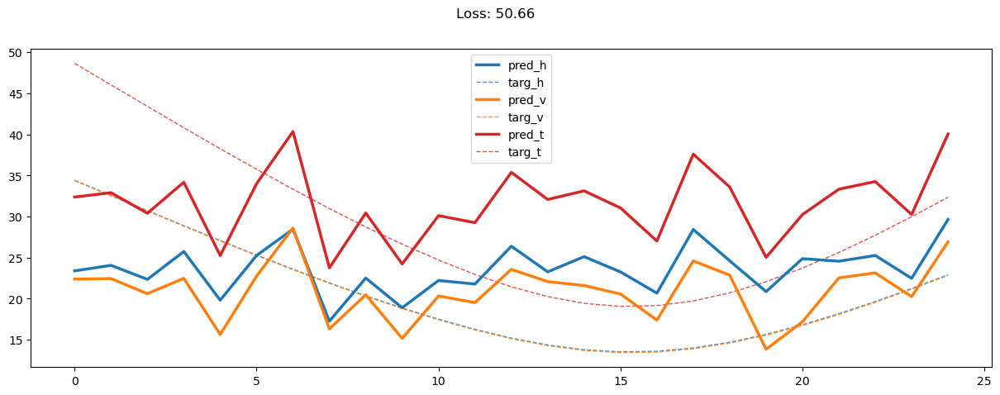

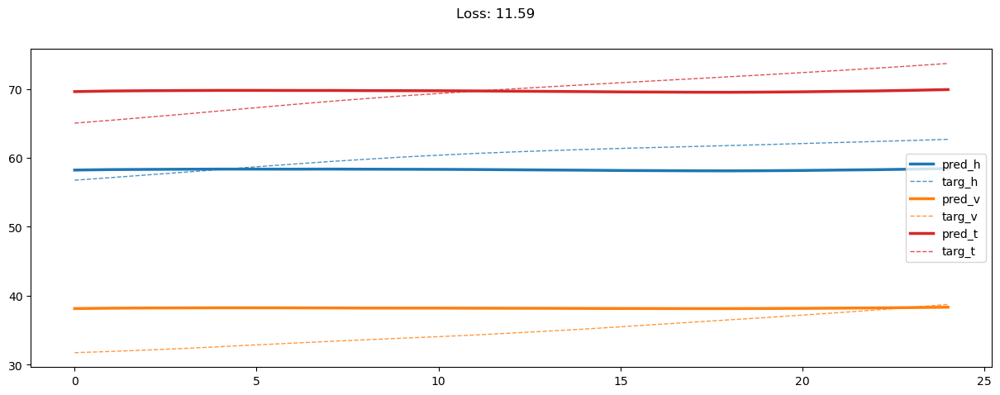

09200: train loss:  173.768, imu loss:  0.662, mag loss:  10.185, div loss:  19.240, slim:  51.730, tlim:  71.754
       valid loss:  388.601, imu loss:  0.475, mag loss:  91.355, div loss:  72.774, slim:  52.303, tlim:  70.993
09220: train loss:  173.661, imu loss:  0.661, mag loss:  10.136, div loss:  19.187, slim:  51.700, tlim:  71.793
       valid loss:  386.677, imu loss:  0.476, mag loss:  90.873, div loss:  71.394, slim:  52.514, tlim:  71.203
09240: train loss:  173.317, imu loss:  0.661, mag loss:  10.001, div loss:  19.010, slim:  51.805, tlim:  71.827
       valid loss:  385.927, imu loss:  0.476, mag loss:  91.073, div loss:  70.756, slim:  52.258, tlim:  70.947
09260: train loss:  173.318, imu loss:  0.663, mag loss:  10.014, div loss:  19.013, slim:  51.753, tlim:  71.824
       valid loss:  386.630, imu loss:  0.475, mag loss:  91.313, div loss:  70.876, slim:  52.309, tlim:  70.998
09280: train loss:  173.556, imu loss:  0.662, mag loss:  10.036, div loss:  19.145, sli

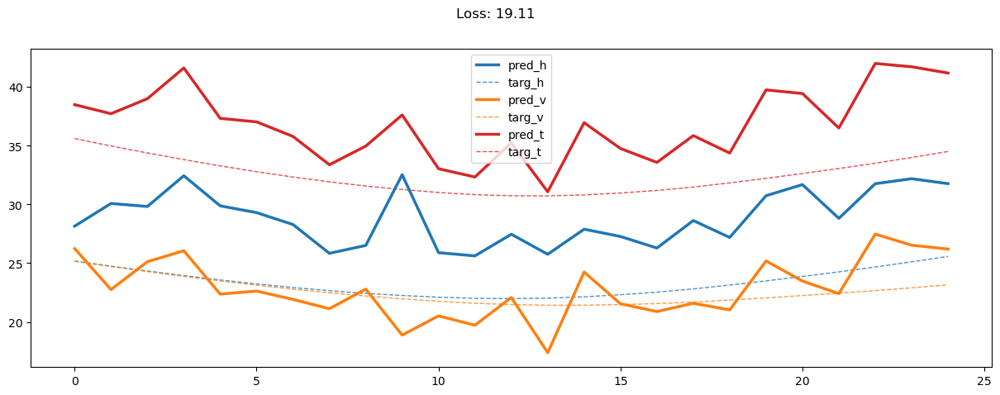

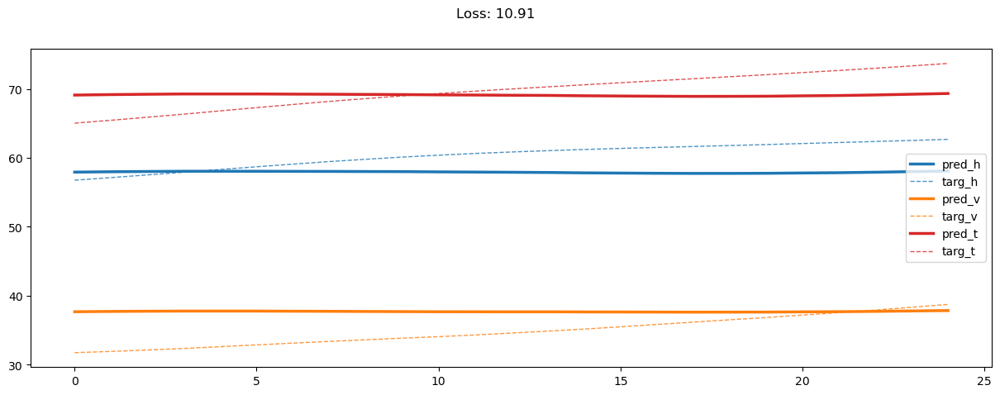

09400: train loss:  173.052, imu loss:  0.660, mag loss:  9.920, div loss:  18.884, slim:  51.805, tlim:  71.844
       valid loss:  388.146, imu loss:  0.476, mag loss:  91.352, div loss:  72.472, slim:  52.231, tlim:  70.920
09420: train loss:  172.659, imu loss:  0.661, mag loss:  9.879, div loss:  18.711, slim:  51.704, tlim:  71.784
       valid loss:  388.317, imu loss:  0.475, mag loss:  91.414, div loss:  72.013, slim:  52.484, tlim:  71.173
09440: train loss:  172.410, imu loss:  0.661, mag loss:  9.817, div loss:  18.518, slim:  51.751, tlim:  71.815
       valid loss:  388.064, imu loss:  0.475, mag loss:  91.108, div loss:  72.769, slim:  52.285, tlim:  70.974
09460: train loss:  172.637, imu loss:  0.661, mag loss:  9.871, div loss:  18.670, slim:  51.815, tlim:  71.771
       valid loss:  385.855, imu loss:  0.475, mag loss:  90.706, div loss:  70.998, slim:  52.468, tlim:  71.157
09480: train loss:  172.313, imu loss:  0.660, mag loss:  9.789, div loss:  18.572, slim:  5

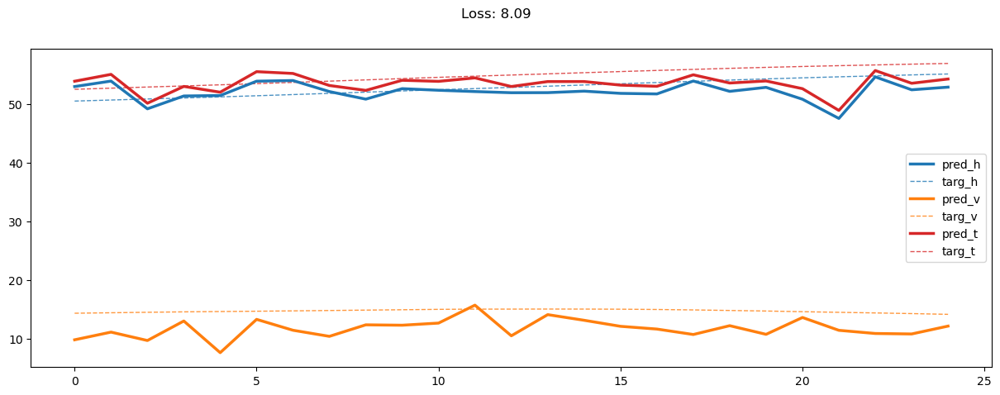

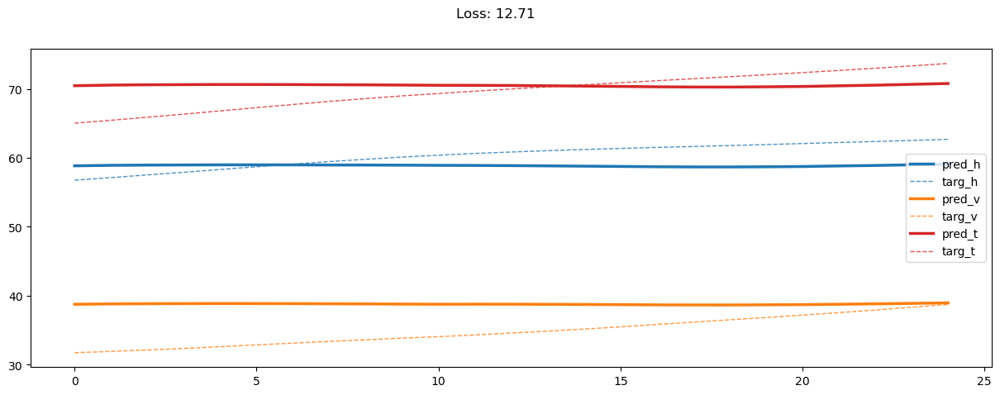

09600: train loss:  171.891, imu loss:  0.662, mag loss:  9.652, div loss:  18.295, slim:  51.853, tlim:  71.802
       valid loss:  388.531, imu loss:  0.475, mag loss:  91.429, div loss:  72.584, slim:  52.290, tlim:  70.980
09620: train loss:  172.102, imu loss:  0.660, mag loss:  9.707, div loss:  18.356, slim:  51.822, tlim:  71.841
       valid loss:  387.257, imu loss:  0.475, mag loss:  91.097, div loss:  72.116, slim:  52.219, tlim:  70.908
09640: train loss:  171.486, imu loss:  0.662, mag loss:  9.586, div loss:  18.149, slim:  51.837, tlim:  71.723
       valid loss:  389.719, imu loss:  0.475, mag loss:  92.000, div loss:  72.384, slim:  52.413, tlim:  71.103
09660: train loss:  171.787, imu loss:  0.660, mag loss:  9.581, div loss:  18.310, slim:  51.820, tlim:  71.831
       valid loss:  385.248, imu loss:  0.475, mag loss:  90.790, div loss:  70.179, slim:  52.490, tlim:  71.180
09680: train loss:  171.421, imu loss:  0.660, mag loss:  9.531, div loss:  18.002, slim:  5

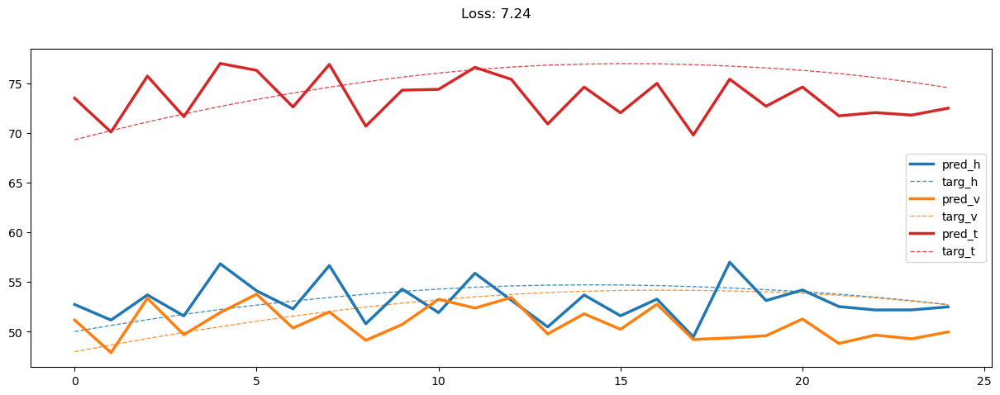

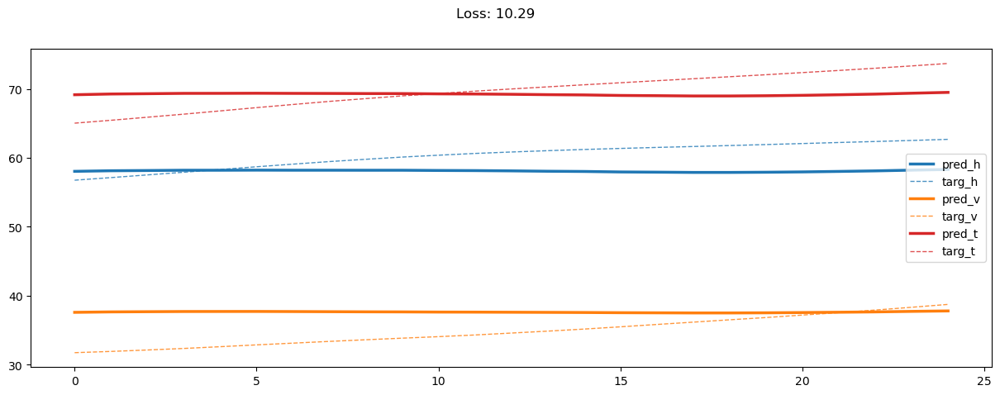

09800: train loss:  170.991, imu loss:  0.660, mag loss:  9.434, div loss:  17.899, slim:  51.813, tlim:  71.772
       valid loss:  388.164, imu loss:  0.475, mag loss:  91.647, div loss:  71.638, slim:  52.361, tlim:  71.050
09820: train loss:  171.006, imu loss:  0.660, mag loss:  9.399, div loss:  17.860, slim:  51.774, tlim:  71.867
       valid loss:  386.386, imu loss:  0.475, mag loss:  91.213, div loss:  70.950, slim:  52.251, tlim:  70.940
09840: train loss:  170.774, imu loss:  0.661, mag loss:  9.397, div loss:  17.780, slim:  51.764, tlim:  71.772
       valid loss:  387.117, imu loss:  0.475, mag loss:  90.961, div loss:  71.893, slim:  52.397, tlim:  71.086
09860: train loss:  170.989, imu loss:  0.660, mag loss:  9.433, div loss:  17.898, slim:  51.804, tlim:  71.775
       valid loss:  386.140, imu loss:  0.475, mag loss:  90.839, div loss:  71.109, slim:  52.421, tlim:  71.111
09880: train loss:  170.726, imu loss:  0.661, mag loss:  9.329, div loss:  17.740, slim:  5

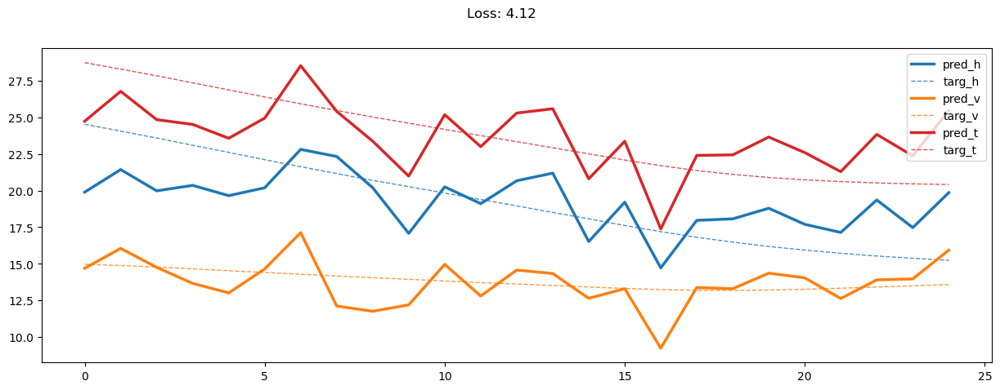

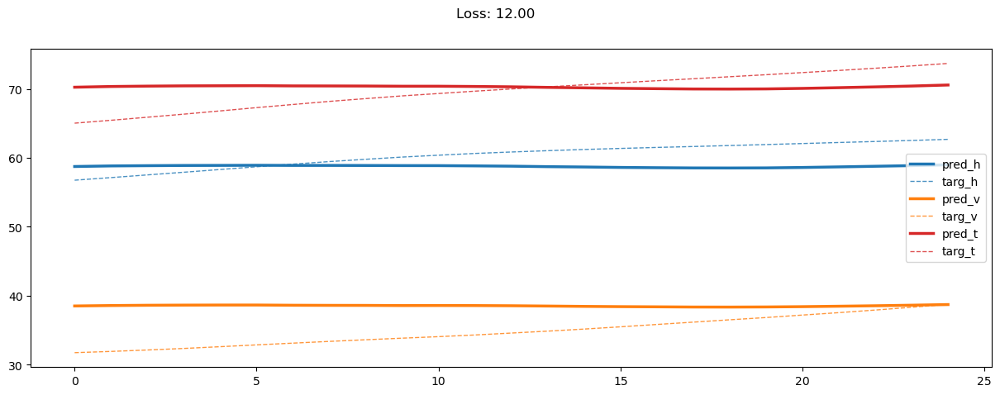

10000: train loss:  170.504, imu loss:  0.660, mag loss:  9.323, div loss:  17.671, slim:  51.834, tlim:  71.740
       valid loss:  388.912, imu loss:  0.475, mag loss:  92.120, div loss:  71.520, slim:  52.321, tlim:  71.010


In [33]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 200 == 0:
        draw = True
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
    
    draw = False
    
    if (epoch + 1) % 20 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep:>5}: train loss: {train_loss: 2.3f}, imu loss: {train_imu_loss: 2.3f}, mag loss: {train_mag_loss: 2.3f}, div loss: {t_d1_loss: 2.3f}, slim: {tlim_loss[0]: 2.3f}, tlim: {tlim_loss[1]: 2.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss: 2.3f}, imu loss: {valid_imu_loss: 2.3f}, mag loss: {valid_mag_loss: 2.3f}, div loss: {v_d1_loss: 2.3f}, slim: {vlim_loss[0]: 2.3f}, tlim: {vlim_loss[1]: 2.3f}')

In [37]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    class_results = []
    class_labels = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 9:11]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 9:11]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
#             gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            predict_mag = predict_mag.detach().cpu().numpy()
            target_mag = target_mag.cpu().numpy()
            source_label = source_label.detach().cpu().numpy()
            
            results.extend(zip(predict_mag, target_mag, source_label))
            
            diff = np.power(predict_mag.reshape(len(predict_mag), -1, 2) - target_mag.reshape(len(target_mag), -1, 2), 2).mean(axis=1)
            class_results.extend(diff)
            class_labels.extend(source_label)
    
    return np.array(results, dtype=object), np.array(class_results), np.array(class_labels)

In [41]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 2)
    targ_mag = result[1].reshape(-1, 2)
    source_label = result[2]
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['h', 'v'], ['tab:blue', 'tab:orange']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{classes[source_label]}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(8973, 2) (8973,)
           loss name|   diff h   diff v      avg
   front_pocket loss:     3.00     6.16     4.58
         pocket loss:     3.66     6.22     4.94
          swing loss:     3.97     5.98     4.98
        average loss:     3.54     6.12     4.83


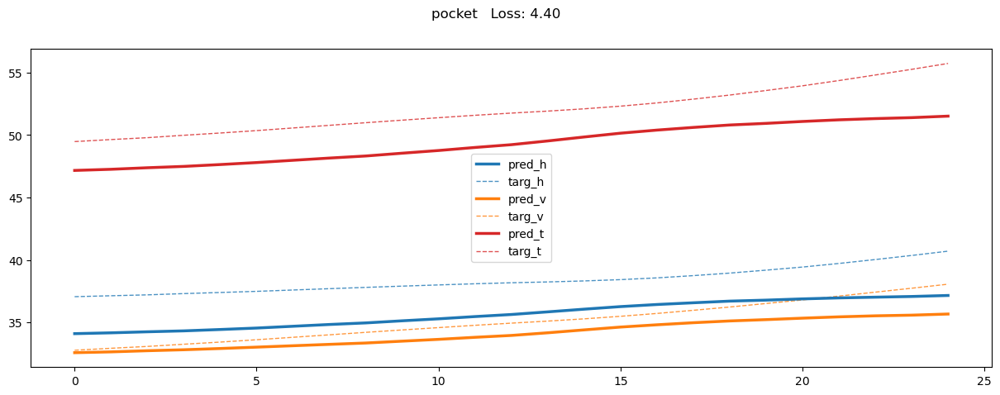

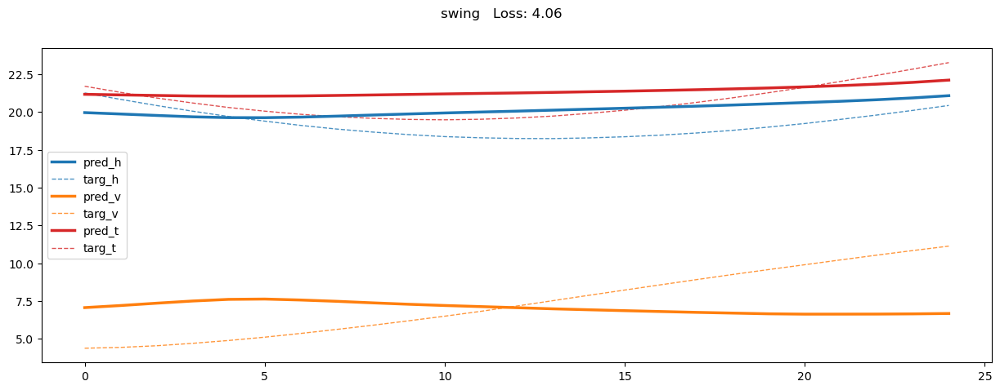

In [42]:
results, cres, clabel = output_eval(model, train_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff h":>8} {"diff v":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dh, dv= cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dh:>8.2f} {dv:>8.2f} {np.mean([dh, dv]):>8.2f}')
dh, dv = cres.mean(axis=0)
print(f'{"average":>15} loss: {dh:>8.2f} {dv:>8.2f} {np.mean([dh, dv]):>8.2f}')

for rs in results[::5000]:
    plot_result(rs)

(1273, 2) (1273,)
           loss name|   diff h   diff v      avg
   front_pocket loss:    12.87   187.47   100.17
         pocket loss:    30.13   150.22    90.18
          swing loss:    36.22   153.94    95.08
        average loss:    25.86   164.95    95.41


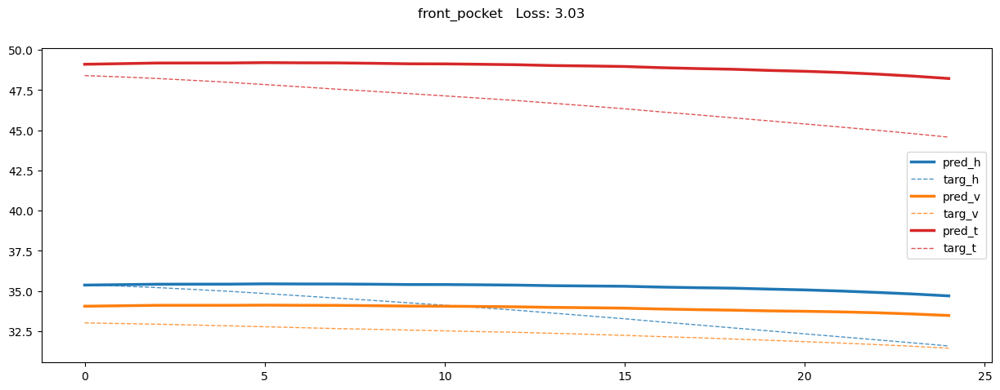

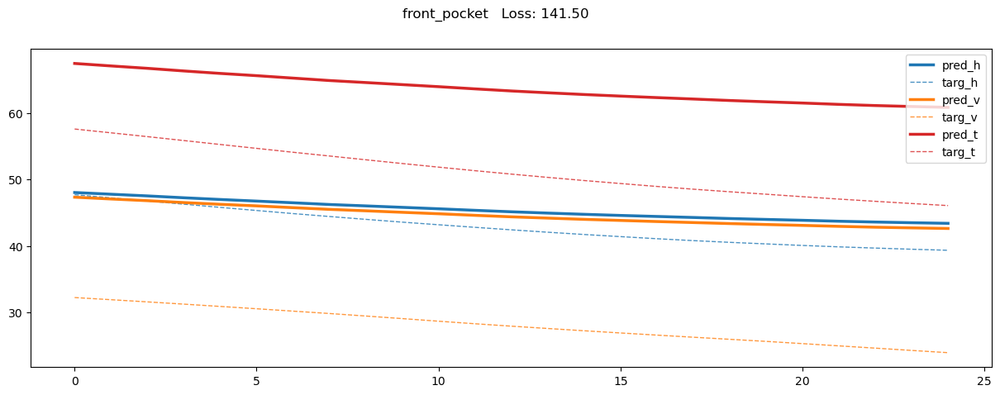

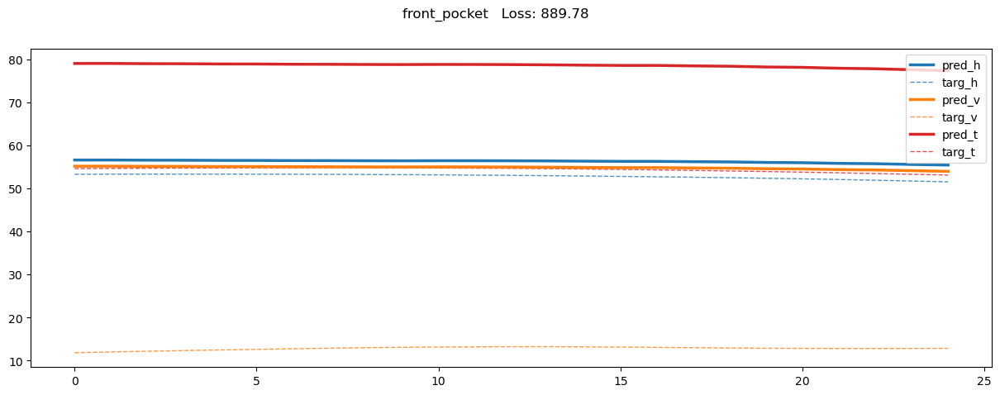

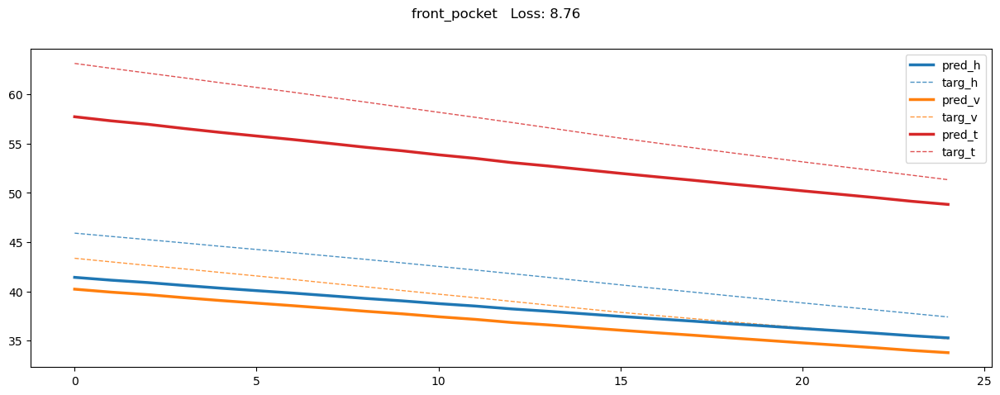

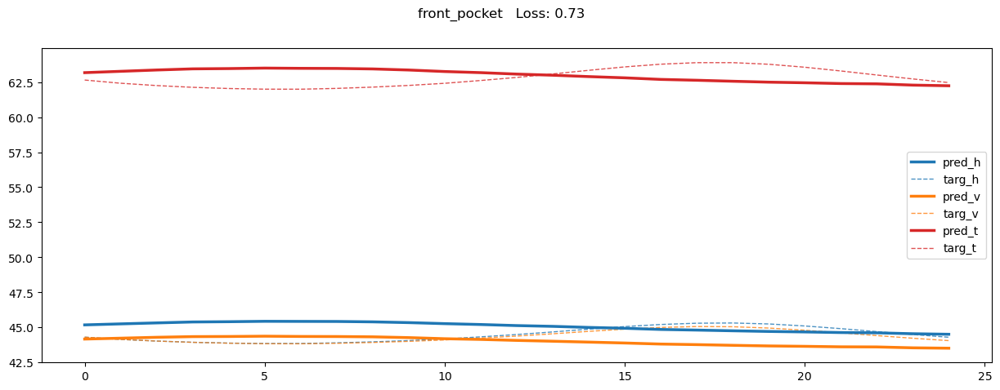

...

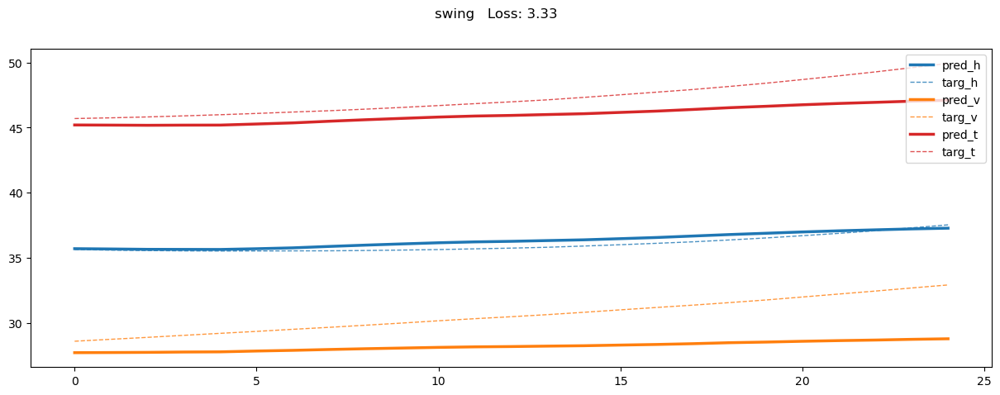

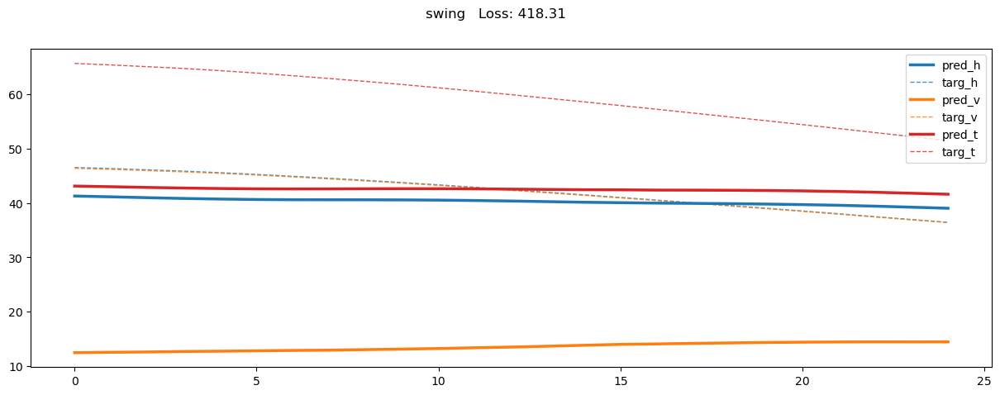

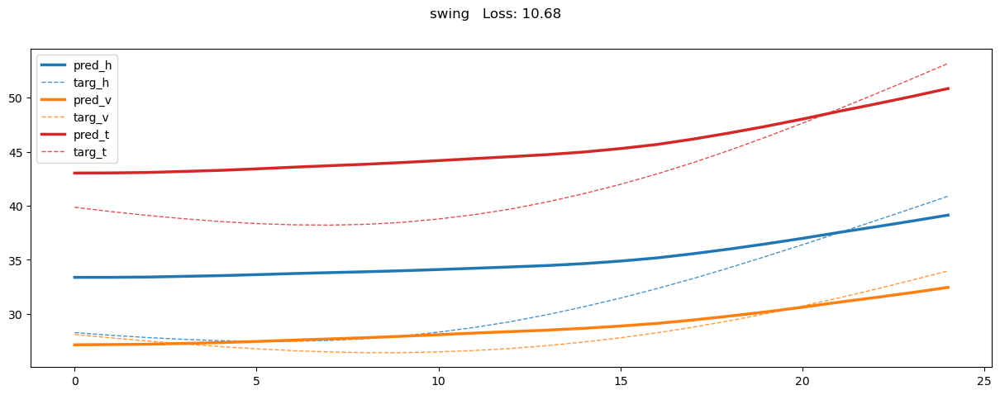

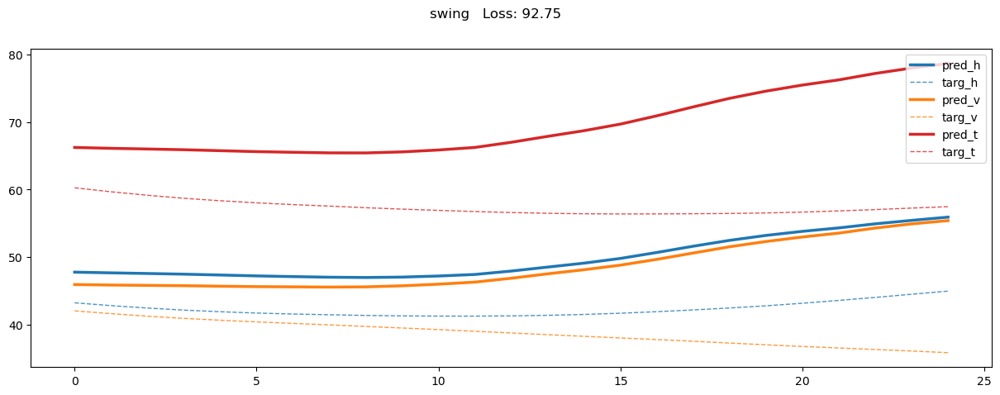

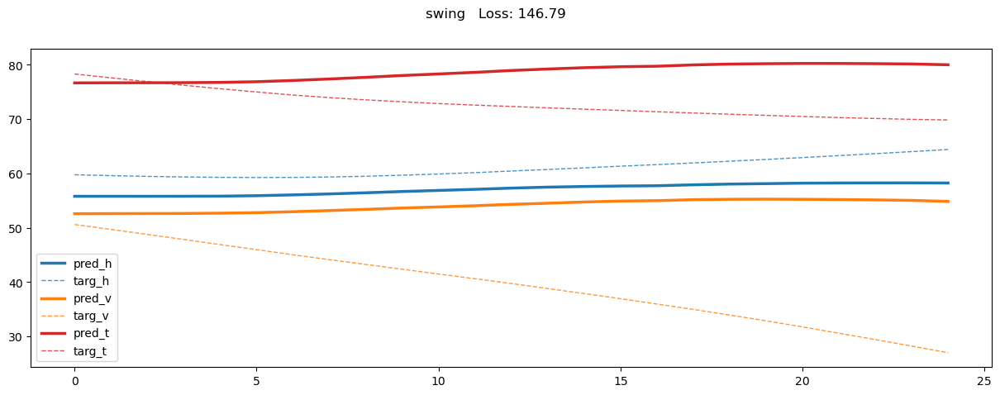

In [44]:
results, cres, clabel = output_eval(model, valid_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff h":>8} {"diff v":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dh, dv= cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dh:>8.2f} {dv:>8.2f} {np.mean([dh, dv]):>8.2f}')
dh, dv = cres.mean(axis=0)
print(f'{"average":>15} loss: {dh:>8.2f} {dv:>8.2f} {np.mean([dh, dv]):>8.2f}')

for rs in results[::50]:
    plot_result(rs)

In [45]:
def plot_eval_result(result, path):
    pred_mag = np.stack(results[:, 0], axis=0)[:, 0].reshape(-1, 2)
    targ_mag = np.stack(results[:, 1], axis=0)[:, 0].reshape(-1, 2)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(25, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['h', 'v'], ['tab:blue', 'tab:orange']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{path}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [46]:
def load_data(folder_path):
    source_path = os.path.join(folder_path, 'source')
    target_path = os.path.join(folder_path, 'target')

    #########################
    ##### check devices #####
    #########################
    source_path, target_path = check_data_device(source_path, target_path)

    ####################################
    ##### load and preprocess data #####
    ####################################
    source_df = load_original_data(source_path)
    target_df = load_original_data(target_path)

    source_df, target_df = bound_range(source_df), bound_range(target_df)
    source_df, target_df = align_data(source_df, target_df)
    
    return select_data(source_df), select_data(target_df)

def split_data(df):
    ncols = seq_len
    nrows = len(df) - seq_len + 1
    
    index = np.zeros((nrows, ncols), dtype=int)
    index += np.arange(ncols)
    index += np.arange(nrows).T[:, None]
    
    return df.to_numpy()[index]    

def combine_to_dataloader(source, target):
    dataset = PairDataset(
                        source_data = torch.tensor(source, dtype=torch.float),
                        source_label = np.zeros(len(source)),
                        target_data = torch.tensor(target, dtype=torch.float),
                        target_label = np.zeros(len(target)),
                    )
    dataloader = DataLoader(dataset, batch_size=512, shuffle=False)
    
    return dataloader

def generate_dataloader(folder_path):
    source_df, target_df = load_data(folder_path)
    source_segs, target_segs = split_data(source_df), split_data(target_df)

    return combine_to_dataloader(source_segs, target_segs)

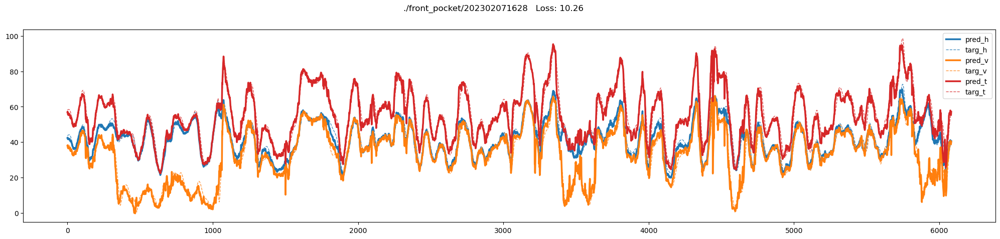

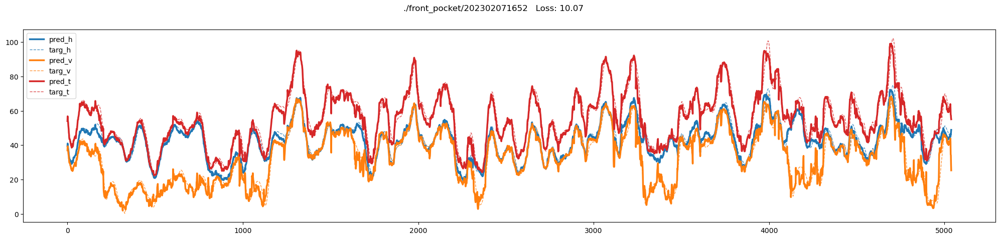

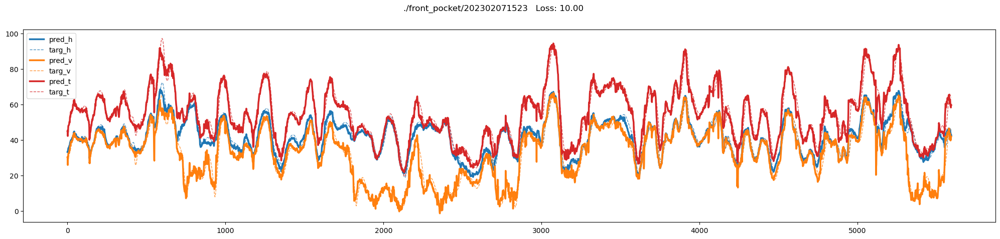

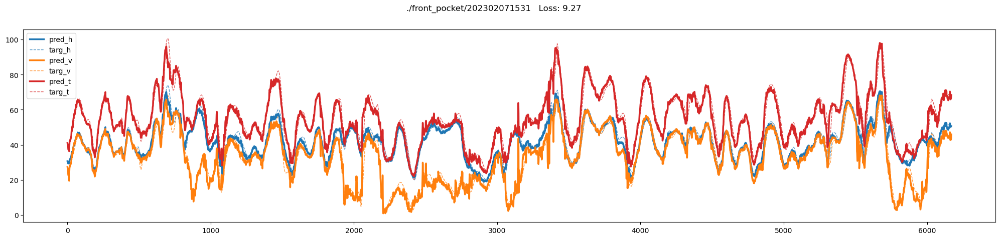

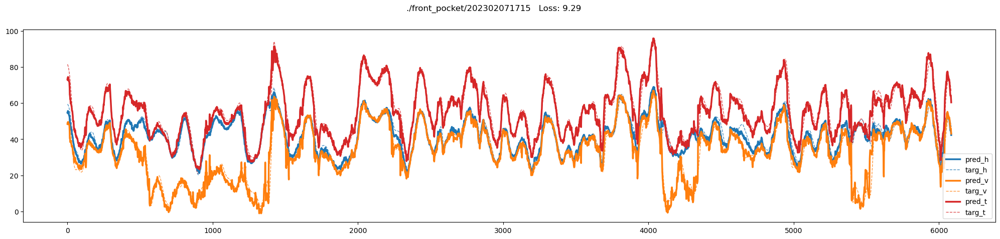

...

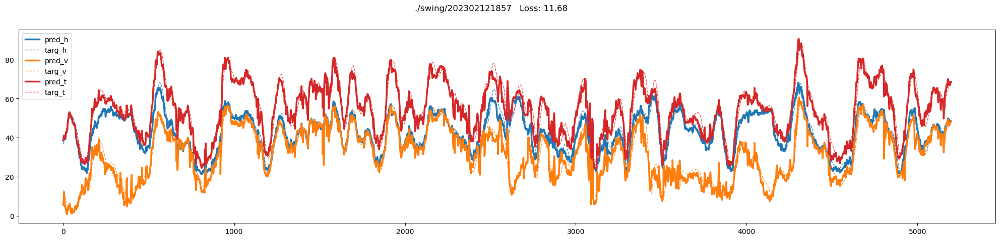

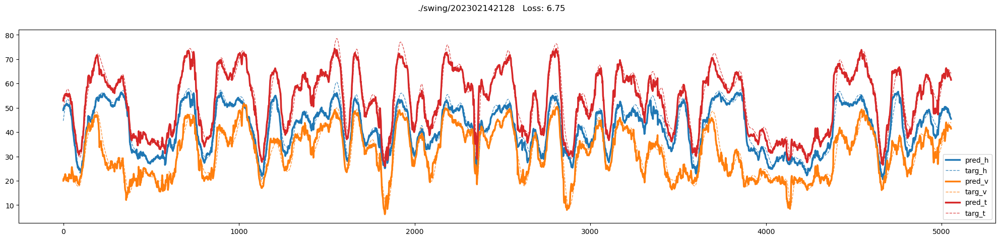

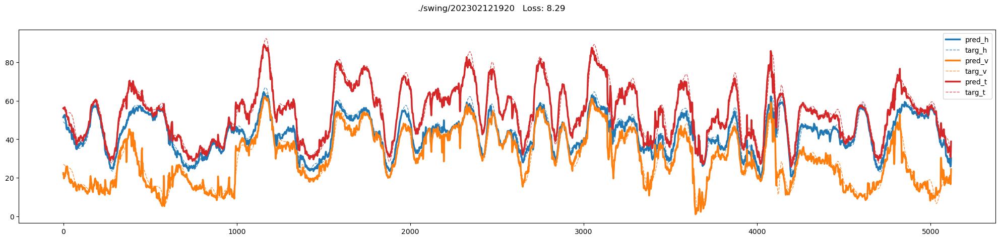

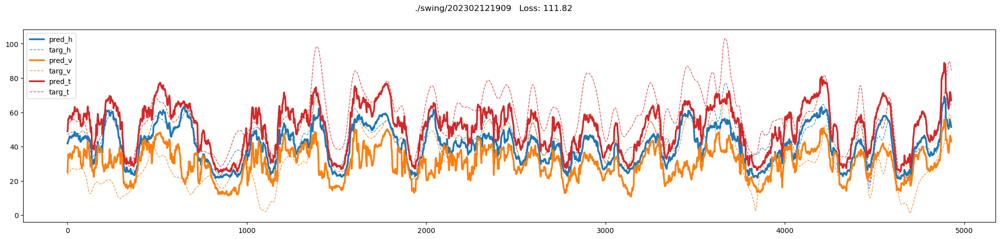

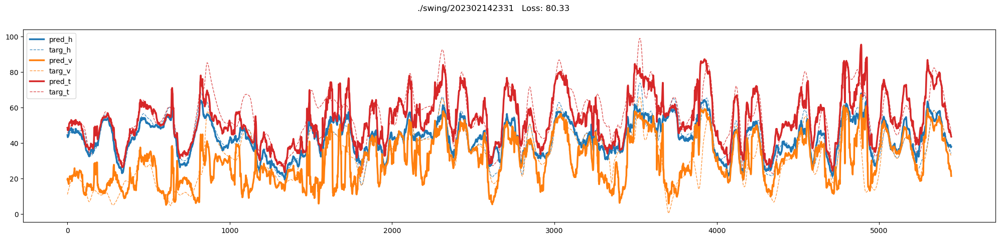

In [47]:
for folder in ['./front_pocket/*', './pocket/*', './swing/*']:
    for path in glob.glob(folder):
        eval_loader = generate_dataloader(path)
        results, _, _ = output_eval(model, eval_loader)
        plot_eval_result(results, path)